In [1]:
%matplotlib inline

import numpy as np
import pandas as pd
import os
import sys

#import from the scripts folder
sys.path.append(os.path.dirname(os.getcwd()))
from scripts import decode

#ploting
import matplotlib.pyplot as plt

In [2]:
pcap_folder = list()
pcap_folder.append('/data/tsukuba_challenge/06_29/2/')
Rss = decode.pcap_extract(pcap_folder)

In [5]:
time_offset = np.min(np.asarray([x[0] for x in Rss]))

In [6]:
data = pd.DataFrame({ 'time':[x[0]-time_offset for x in Rss],
                      'freq':[x[1] for x in Rss],
                      'mac':[x[2] for x in Rss],
                      'rssi':[x[3][0] for x in Rss],
                      'rssi_':[x[3][1:] for x in Rss]
                     })
data.sort_values(by='time', inplace=True)
data

,freq,mac,rssi,rssi_,time
86709,2427,ec:89:14:25:0d:14,-81,"[-84, -87, -85]",0.000000
86710,2427,74:03:bd:97:74:00,-75,"[-84, -81, -77]",0.190466
86711,2427,ec:89:14:25:0d:14,-80,"[-84, -85, -85]",0.204785
86712,2427,0c:70:4a:71:2a:98,-78,"[-85, -84, -82]",0.278662
86713,2427,ec:89:14:25:0d:14,-77,"[-81, -83, -83]",0.307179
86714,2427,58:1d:91:5a:54:b9,-59,"[-64, -64, -62]",0.422708
86715,2427,68:ff:7b:a7:31:b4,-77,"[-78, -83, -87]",0.495137
86716,2462,a4:12:42:22:6a:25,-68,"[-75, -73, -70]",0.600497
86717,2462,e0:cb:bc:88:06:0f,-72,"[-77, -77, -77]",0.615458
86718,2462,a6:12:42:22:6a:25,-74,"[-84, -79, -77]",0.651672


In [8]:
unique_mac = data['mac'].unique()
print('Unique Number of MAC Addresses: {}'.format(len(unique_mac)))

Unique Number of MAC Addresses: 603


In [9]:
# Filter those that were not seen more than 10 times
fdata = data.groupby('mac').filter(lambda x: len(x) > 20)
unique_mac = fdata['mac'].unique()
print( '{:20s} {}\n{:20s} {}'.format(
       'Unique macs',len(fdata['mac'].unique()),
       'Total points',len(fdata)))

Unique macs          316
Total points         140710


In [10]:
for mac in fdata.mac:
    if mac=='00:01:8e:48:f1:48': print(mac)

00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:48:f1:48
00:01:8e:4

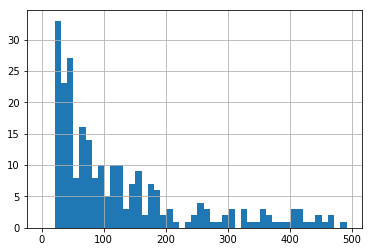

In [11]:
fdata['mac'].value_counts().hist(bins=np.arange(1,500,10))

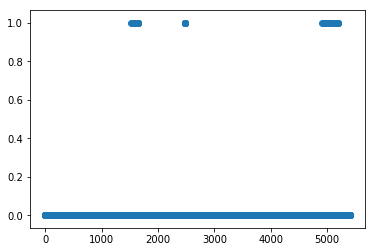

In [14]:
plt.scatter(fdata['time'],fdata['mac']==unique_mac[100])

In [194]:
fdata_time = fdata.groupby(pd.cut(fdata['time'],t))

In [197]:
for k,v in fdata_time:
    print('key',k)
    print(v)

key (0.0, 1.0]
       freq                mac  rssi            rssi_      time
86710  2427  74:03:bd:97:74:00   -75  [-84, -81, -77]  0.190466
86711  2427  ec:89:14:25:0d:14   -80  [-84, -85, -85]  0.204785
86712  2427  0c:70:4a:71:2a:98   -78  [-85, -84, -82]  0.278662
86713  2427  ec:89:14:25:0d:14   -77  [-81, -83, -83]  0.307179
86714  2427  58:1d:91:5a:54:b9   -59  [-64, -64, -62]  0.422708
86715  2427  68:ff:7b:a7:31:b4   -77  [-78, -83, -87]  0.495137
86716  2462  a4:12:42:22:6a:25   -68  [-75, -73, -70]  0.600497
86717  2462  e0:cb:bc:88:06:0f   -72  [-77, -77, -77]  0.615458
86718  2462  a6:12:42:22:6a:25   -74  [-84, -79, -77]  0.651672
86719  2462  d4:38:9c:41:22:c3   -69  [-70, -75, -79]  0.658191
86720  2462  78:62:56:10:27:61   -59  [-61, -68, -65]  0.680446
86721  2462  f2:cb:bc:88:06:0f   -77  [-84, -79, -83]  0.692141
86722  2462  a4:12:42:22:6a:25   -74  [-84, -78, -77]  0.702863
86723  2462  e0:cb:bc:88:05:be   -80  [-89, -83, -84]  0.716143
86724  2462  6c:e4:da:12:

       freq                mac  rssi            rssi_       time
87657  2427  74:03:bd:97:74:00   -70  [-76, -76, -73]  35.005882
87658  2427  ec:89:14:25:0d:14   -77  [-81, -83, -81]  35.122718
87659  2462  d4:38:9c:41:22:c3   -57  [-61, -67, -60]  35.166730
87660  2462  78:62:56:10:27:61   -57  [-58, -69, -64]  35.189491
87661  2462  f2:cb:bc:88:06:0f   -76  [-82, -79, -82]  35.200675
87662  2462  78:62:56:10:27:61   -62  [-64, -68, -70]  35.291911
87663  2462  f2:cb:bc:88:06:0f   -77  [-83, -82, -81]  35.303532
87664  2462  e6:cb:bc:88:06:0f   -78  [-84, -82, -84]  35.354141
87665  2462  a6:12:42:22:6a:25   -74  [-79, -79, -80]  35.365273
87666  2462  6c:e4:da:12:ea:23   -72  [-77, -76, -77]  35.367545
87667  2462  e0:cb:bc:88:06:0f   -77  [-84, -81, -82]  35.431055
87668  2462  6c:e4:da:12:ea:23   -73  [-79, -77, -78]  35.454414
87669  2462  e6:cb:bc:88:06:0f   -79  [-86, -82, -83]  35.457432
87670  2462  d4:38:9c:41:22:c3   -67  [-73, -74, -69]  35.473877
87671  2462  78:62:56:10:

       freq                mac  rssi            rssi_       time
72415  2462  6c:e4:da:12:ea:23   -66  [-70, -70, -71]  72.011119
72416  2462  e6:cb:bc:88:06:0f   -73  [-78, -79, -77]  72.014118
72417  2462  d4:38:9c:41:22:c3   -64  [-71, -66, -71]  72.030367
72418  2462  78:62:56:10:27:61   -46  [-49, -54, -51]  72.053736
72419  2462  f2:cb:bc:88:06:0f   -74  [-81, -79, -78]  72.064424
72420  2462  a4:12:42:22:6a:25   -69  [-78, -71, -74]  72.075695
72421  2462  6c:e4:da:12:ea:23   -66  [-71, -70, -73]  72.113524
72422  2462  e6:cb:bc:88:06:0f   -74  [-80, -79, -78]  72.116528
72423  2462  ea:cb:bc:88:05:be   -78  [-82, -83, -82]  72.139623
72424  2462  a4:12:42:22:6a:25   -69  [-79, -72, -74]  72.178103
72425  2462  78:62:56:10:27:61   -39  [-42, -45, -46]  72.258536
72426  2462  bc:5c:4e:20:5d:e5   -83  [-90, -87, -86]  72.273828
72427  2462  a4:12:42:22:6a:25   -69  [-77, -71, -75]  72.280500
72428  2462  e0:cb:bc:88:06:0f   -74  [-79, -79, -78]  72.294669
72429  2462  00:01:8e:48:

       freq                mac  rssi            rssi_        time
73413  2462  e6:cb:bc:88:05:be   -75  [-83, -78, -79]  111.025740
73414  2462  d4:38:9c:41:22:c3   -58  [-73, -60, -64]  111.044418
73415  2462  ea:cb:bc:88:06:0f   -70  [-79, -72, -77]  111.052804
73416  2462  78:62:56:10:27:61   -50  [-55, -57, -54]  111.068964
73417  2462  e0:cb:bc:88:05:be   -75  [-83, -78, -81]  111.102559
73418  2462  6c:e4:da:12:ea:23   -68  [-75, -71, -74]  111.127808
73419  2462  e6:cb:bc:88:06:0f   -70  [-79, -72, -77]  111.130810
73420  2462  d4:38:9c:41:22:c3   -60  [-74, -62, -64]  111.146819
73421  2462  ea:cb:bc:88:06:0f   -70  [-80, -72, -76]  111.155353
73422  2462  e0:cb:bc:88:06:0f   -70  [-77, -73, -77]  111.206394
73423  2427  ec:89:14:25:0d:14   -72  [-77, -78, -76]  111.307256
73424  2427  0c:70:4a:71:2a:98   -70  [-76, -73, -75]  111.381094
73425  2427  74:03:bd:97:74:00   -66  [-77, -69, -70]  111.396883
73426  2427  0c:70:4a:71:2a:98   -69  [-76, -74, -73]  111.483468
73427  242

49779  2427  74:03:bd:97:74:00   -69  [-79, -78, -71]  143.960490
key (144.0, 145.0]
       freq                mac  rssi            rssi_        time
49780  2427  ec:89:14:25:0d:14   -80  [-89, -84, -83]  144.586890
49781  2462  d4:38:9c:41:22:c3   -61  [-64, -65, -71]  144.733720
49782  2462  78:62:56:10:27:61   -46  [-49, -53, -52]  144.758204
49783  2462  f2:cb:bc:88:05:be   -74  [-88, -79, -76]  144.766447
49784  2462  a4:12:42:22:6a:25   -69  [-75, -72, -74]  144.779702
49785  2462  a6:12:42:22:6a:25   -69  [-77, -72, -73]  144.831026
49786  2462  d4:38:9c:41:22:c3   -69  [-76, -69, -82]  144.836113
49787  2462  ea:cb:bc:88:05:be   -73  [-86, -77, -75]  144.843096
49788  2462  78:62:56:10:27:61   -52  [-59, -58, -55]  144.860595
49789  2462  a4:12:42:22:6a:25   -70  [-78, -73, -74]  144.882102
49790  2462  e0:cb:bc:88:05:be   -74  [-85, -79, -77]  144.894301
49791  2462  e0:cb:bc:88:06:0f   -75  [-82, -79, -79]  144.897317
49792  2462  78:62:56:10:27:61   -57  [-63, -61, -62]  14

       freq                mac  rssi            rssi_        time
50838  2462  a4:12:42:22:6a:25   -70  [-82, -72, -74]  176.011716
50839  2462  e0:cb:bc:88:05:be   -77  [-88, -79, -82]  176.023688
50840  2462  e6:cb:bc:88:05:be   -77  [-84, -80, -81]  176.049290
50841  2462  d4:38:9c:41:22:c3   -55  [-62, -60, -59]  176.068064
50842  2462  a4:12:42:22:6a:25   -70  [-81, -72, -74]  176.114118
50843  2427  a8:0c:63:d5:f9:fd   -75  [-81, -80, -79]  176.203259
50844  2427  74:03:bd:97:74:00   -68  [-78, -72, -72]  176.213687
50845  2427  ec:89:14:25:0d:14   -81  [-86, -84, -88]  176.227929
50846  2427  0c:70:4a:71:2a:98   -78  [-82, -82, -87]  176.404631
50847  2427  a8:0c:63:d5:f9:fd   -80  [-86, -84, -84]  176.410911
50848  2427  a8:0c:63:d5:f9:fd   -78  [-84, -82, -83]  176.516426
50849  2427  ec:89:14:25:0d:14   -80  [-83, -85, -86]  176.535124
50850  2427  0c:70:4a:71:2a:98   -78  [-85, -80, -84]  176.712186
50851  2427  a8:0c:63:d5:f9:fd   -79  [-86, -83, -84]  176.715261
50852  242

      freq                mac  rssi            rssi_        time
1617  2427  68:ff:7b:a7:31:b4   -74  [-76, -79, -81]  209.083374
1618  2427  0c:70:4a:71:2a:98   -76  [-82, -81, -80]  209.172431
1619  2427  ec:89:14:25:0d:14   -75  [-88, -79, -78]  209.200276
1620  2427  ec:89:14:25:0d:14   -77  [-82, -81, -81]  209.302685
1621  2427  ec:89:14:25:0d:14   -68  [-81, -71, -70]  209.507472
1622  2462  6c:e4:da:12:ea:23   -61  [-67, -64, -69]  209.640442
1623  2462  a6:12:42:22:6a:25   -59  [-64, -62, -66]  209.650137
1624  2462  d4:38:9c:41:22:c3   -47  [-54, -51, -51]  209.654724
1625  2462  f2:cb:bc:88:05:be   -78  [-82, -88, -81]  209.687581
1626  2462  e0:cb:bc:88:05:be   -75  [-79, -83, -79]  209.713038
1627  2462  e6:cb:bc:88:06:0f   -73  [-84, -76, -76]  209.740062
1628  2462  a6:12:42:22:6a:25   -70  [-82, -72, -75]  209.752513
1629  2462  d4:38:9c:41:22:c3   -58  [-66, -62, -61]  209.757147
1630  2462  78:62:56:10:27:61   -58  [-65, -63, -60]  209.782659
1631  2462  f2:cb:bc:88:0

4757  2462  e6:cb:bc:88:05:be   -81  [-87, -86, -85]  244.963974
key (245.0, 246.0]
      freq                mac  rssi            rssi_        time
4758  2462  ea:cb:bc:88:06:0f   -76  [-82, -80, -81]  245.006275
4759  2462  78:62:56:10:27:61   -51  [-53, -57, -58]  245.008435
4760  2462  f2:cb:bc:88:05:be   -80  [-85, -84, -86]  245.015308
4761  2462  e0:cb:bc:88:05:be   -81  [-86, -85, -86]  245.040771
4762  2462  d4:38:9c:41:22:c3   -78  [-82, -83, -86]  245.084809
4763  2462  ea:cb:bc:88:05:be   -80  [-85, -83, -85]  245.091988
4764  2427  74:03:bd:97:74:00   -69  [-74, -74, -73]  245.333891
4765  2427  ec:89:14:25:0d:14   -80  [-83, -85, -88]  245.449358
4766  2427  ec:89:14:25:0d:14   -78  [-85, -84, -80]  245.961351
key (246.0, 247.0]
      freq                mac  rssi            rssi_        time
4767  2427  ec:89:14:25:0d:14   -75  [-81, -83, -78]  246.063751
4768  2462  78:62:56:10:27:61   -46  [-47, -54, -53]  246.138450
4769  2462  e0:cb:bc:88:06:0f   -63  [-69, -67, -67]

      freq                mac  rssi            rssi_        time
5834  2427  0c:70:4a:71:2a:98   -72  [-80, -76, -76]  280.032710
5835  2427  ec:89:14:25:0d:14   -75  [-82, -81, -77]  280.060050
5836  2427  74:03:bd:97:74:00   -68  [-73, -72, -73]  280.150072
5837  2427  74:03:bd:97:74:00   -67  [-70, -75, -71]  280.252758
5838  2427  18:c2:bf:3e:6b:71   -78  [-86, -81, -83]  280.263703
5839  2427  14:5f:94:de:fb:be   -50  [-54, -61, -53]  280.289011
5840  2427  74:03:bd:97:74:00   -67  [-71, -74, -72]  280.355488
5841  2462  f2:cb:bc:88:05:be   -58  [-60, -63, -64]  280.650249
5842  2462  a4:12:42:22:6a:25   -57  [-60, -65, -63]  280.664509
5843  2462  e6:cb:bc:88:05:be   -71  [-76, -76, -76]  280.701314
5844  2462  6c:e4:da:12:ea:23   -74  [-82, -75, -83]  280.704990
5845  2462  a6:12:42:22:6a:25   -71  [-75, -79, -75]  280.715697
5846  2462  ea:cb:bc:88:05:be   -69  [-73, -73, -76]  280.726934
5847  2462  78:62:56:10:27:61   -50  [-59, -59, -51]  280.746282
5848  2462  f2:cb:bc:88:0

       freq                mac  rssi            rssi_        time
76460  2462  6c:e4:da:12:ea:23   -51  [-56, -58, -55]  307.021587
76461  2462  d4:38:9c:41:22:c3   -50  [-53, -59, -55]  307.039785
76462  2462  f2:cb:bc:88:05:be   -69  [-76, -75, -71]  307.069254
76463  2462  a4:12:42:22:6a:25   -67  [-74, -76, -69]  307.083696
76464  2462  e6:cb:bc:88:05:be   -68  [-75, -81, -69]  307.121418
76465  2462  6c:e4:da:12:ea:23   -66  [-80, -69, -69]  307.124006
76466  2462  a6:12:42:22:6a:25   -67  [-76, -75, -69]  307.134903
76467  2462  ea:cb:bc:88:05:be   -68  [-74, -81, -70]  307.145945
76468  2462  78:62:56:10:27:61   -56  [-65, -60, -60]  307.165642
76469  2462  f2:cb:bc:88:05:be   -68  [-73, -81, -70]  307.171651
76470  2462  e0:cb:bc:88:05:be   -68  [-74, -76, -69]  307.197115
76471  2462  e6:cb:bc:88:05:be   -67  [-73, -78, -69]  307.223797
76472  2462  6c:e4:da:12:ea:23   -60  [-70, -64, -62]  307.226413
76473  2462  d4:38:9c:41:22:c3   -60  [-66, -75, -62]  307.241031
76474  246

77671  2427  ec:89:14:25:0d:14   -61  [-66, -70, -64]  336.993620
key (337.0, 338.0]
       freq                mac  rssi            rssi_        time
77672  2427  74:03:bd:97:74:00   -64  [-69, -70, -68]  337.084585
77673  2427  ec:89:14:25:0d:14   -62  [-67, -74, -64]  337.096036
77674  2427  74:03:bd:97:74:00   -64  [-69, -73, -67]  337.186983
77675  2427  58:1d:91:5a:54:b9   -57  [-62, -64, -61]  337.211554
77676  2427  74:03:bd:97:74:00   -63  [-67, -67, -68]  337.289450
77677  2427  ec:89:14:25:0d:14   -65  [-69, -67, -76]  337.300843
77678  2427  ec:89:14:25:0d:14   -63  [-66, -71, -67]  337.404751
77679  2427  58:1d:91:5a:54:b9   -62  [-70, -68, -64]  337.416361
77680  2462  e6:cb:bc:88:06:0f   -57  [-61, -63, -61]  337.431916
77681  2462  6c:e4:da:12:ea:23   -62  [-69, -64, -71]  337.434144
77682  2462  a6:12:42:22:6a:25   -50  [-55, -56, -54]  337.445297
77683  2462  d4:38:9c:41:22:c3   -62  [-64, -70, -70]  337.448765
77684  2462  e4:a7:c5:0d:be:96   -64  [-67, -73, -70]  33

       freq                mac  rssi            rssi_        time
60604  2462  6c:e4:da:12:ea:23   -69  [-75, -76, -71]  366.003579
60605  2462  a6:12:42:22:6a:25   -67  [-70, -72, -72]  366.014884
60606  2462  d4:38:9c:41:22:c3   -64  [-70, -73, -67]  366.018097
60607  2462  f2:cb:bc:88:05:be   -79  [-84, -82, -84]  366.051214
60608  2462  a4:12:42:22:6a:25   -67  [-72, -70, -75]  366.066098
60609  2462  e0:cb:bc:88:05:be   -80  [-85, -83, -88]  366.076694
60610  2462  e6:cb:bc:88:06:0f   -72  [-81, -75, -77]  366.103657
60611  2462  6c:e4:da:12:ea:23   -67  [-73, -70, -73]  366.105984
60612  2462  a6:12:42:22:6a:25   -67  [-74, -70, -72]  366.117302
60613  2462  d4:38:9c:41:22:c3   -64  [-69, -71, -67]  366.120479
60614  2462  78:62:56:10:27:61   -71  [-76, -75, -76]  366.148404
60615  2462  a4:12:42:22:6a:25   -68  [-74, -73, -72]  366.168485
60616  2462  88:57:ee:f8:7a:7a   -65  [-70, -69, -70]  366.183243
60617  2462  e6:cb:bc:88:05:be   -78  [-83, -80, -85]  366.204652
60618  246

       freq                mac  rssi            rssi_        time
61581  2427  74:03:bd:97:74:00   -67  [-73, -72, -71]  398.012798
61582  2427  0c:70:4a:71:2a:98   -76  [-81, -83, -79]  398.201510
61583  2462  78:62:56:10:27:61   -58  [-60, -65, -66]  398.310544
61584  2462  88:57:ee:f8:7a:7a   -71  [-77, -72, -81]  398.336736
61585  2462  e6:cb:bc:88:06:0f   -77  [-82, -80, -82]  398.359386
61586  2462  6c:e4:da:12:ea:23   -75  [-82, -78, -82]  398.361672
61587  2462  a6:12:42:22:6a:25   -74  [-79, -79, -78]  398.373275
61588  2462  ea:cb:bc:88:06:0f   -75  [-79, -80, -79]  398.386858
61589  2462  f2:cb:bc:88:06:0f   -76  [-82, -81, -79]  398.410942
61590  2462  e0:cb:bc:88:06:0f   -72  [-75, -79, -77]  398.436467
61591  2462  88:57:ee:f8:7a:7a   -69  [-72, -76, -76]  398.439120
61592  2462  6c:e4:da:12:ea:23   -75  [-79, -80, -80]  398.464090
61593  2462  a6:12:42:22:6a:25   -72  [-75, -80, -77]  398.475686
61594  2462  ea:cb:bc:88:06:0f   -72  [-76, -76, -77]  398.488107
61595  246

12480  2462  e0:cb:bc:88:06:0f   -72  [-78, -75, -78]  438.990624
key (439.0, 440.0]
       freq                mac  rssi            rssi_        time
12481  2462  a6:12:42:22:6a:25   -72  [-78, -75, -78]  439.026076
12482  2462  d4:38:9c:41:22:c3   -65  [-69, -69, -72]  439.028588
12483  2462  a6:12:42:22:6a:25   -74  [-80, -80, -78]  439.128476
12484  2462  a4:12:42:22:6a:25   -75  [-82, -80, -78]  439.179712
12485  2462  e0:cb:bc:88:06:0f   -77  [-89, -79, -83]  439.191156
12486  2462  10:66:82:cb:76:d1   -78  [-84, -80, -87]  439.205106
12487  2462  e6:cb:bc:88:06:0f   -76  [-83, -78, -83]  439.216671
12488  2462  a6:12:42:22:6a:25   -75  [-84, -78, -80]  439.230880
12489  2462  a4:12:42:22:6a:25   -75  [-79, -80, -78]  439.282073
12490  2462  e0:cb:bc:88:06:0f   -76  [-82, -80, -80]  439.299396
12491  2462  a6:12:42:22:6a:25   -74  [-80, -79, -78]  439.333259
12492  2462  a6:12:42:22:6a:25   -75  [-82, -78, -82]  439.436550
12493  2462  78:62:56:10:27:61   -74  [-81, -77, -80]  43

       freq                mac  rssi            rssi_        time
64924  2462  10:b1:f8:09:16:48   -74  [-83, -77, -79]  488.004765
64925  2462  a4:12:42:22:6a:25   -76  [-84, -81, -79]  488.024455
64926  2462  a6:12:42:22:6a:25   -77  [-83, -80, -82]  488.075777
64927  2462  a6:12:42:22:6a:25   -77  [-83, -81, -81]  488.178051
64928  2462  10:b1:f8:09:16:48   -73  [-77, -79, -78]  488.209571
64929  2462  d4:38:9c:41:22:c3   -76  [-79, -80, -82]  488.282527
64930  2462  10:b1:f8:09:16:48   -76  [-84, -80, -80]  488.311961
64931  2462  a4:12:42:22:6a:25   -77  [-80, -82, -82]  488.331677
64932  2462  6c:e4:da:12:ea:23   -79  [-85, -85, -83]  488.372198
64933  2462  a6:12:42:22:6a:25   -74  [-82, -76, -83]  488.382833
64934  2462  d4:38:9c:41:22:c3   -73  [-79, -76, -79]  488.384915
64935  2462  12:66:82:cb:76:d1   -80  [-85, -86, -85]  488.408180
64936  2462  78:62:56:10:27:61   -75  [-79, -80, -80]  488.517189
key (489.0, 490.0]
       freq                mac  rssi            rssi_    

       freq                mac  rssi            rssi_        time
65608  2462  a4:12:42:22:6a:25   -66  [-69, -72, -71]  526.117246
65609  2462  00:25:36:fb:84:5d   -66  [-69, -72, -73]  526.130914
65610  2462  e6:cb:bc:88:06:0f   -64  [-68, -69, -70]  526.153550
65611  2462  d4:38:9c:41:22:c3   -74  [-80, -82, -77]  526.171141
65612  2462  ea:cb:bc:88:06:0f   -79  [-87, -83, -84]  526.179174
65613  2462  e0:cb:bc:88:06:0f   -75  [-82, -81, -78]  526.230547
65614  2462  f2:cb:bc:88:06:0f   -80  [-86, -84, -84]  526.307387
65615  2462  06:61:10:68:11:43   -71  [-74, -86, -73]  526.472709
65616  2462  a6:12:42:22:6a:25   -76  [-81, -79, -82]  526.475611
65617  2462  a4:12:42:22:6a:25   -77  [-81, -82, -82]  526.526825
65618  2462  00:25:36:fb:84:5d   -73  [-76, -77, -83]  526.540502
65619  2462  a4:12:42:22:6a:25   -77  [-83, -81, -80]  526.629237
65620  2462  e0:cb:bc:88:06:0f   -77  [-81, -82, -85]  526.639971
65621  2462  06:61:10:68:11:43   -69  [-71, -77, -75]  526.677514
65622  246

108526  2427  0c:70:4a:71:2a:98   -77  [-82, -81, -83]  565.931460
key (566.0, 567.0]
        freq                mac  rssi            rssi_        time
108527  2427  0c:70:4a:71:2a:98   -76  [-81, -81, -80]  566.034133
108529  2427  7c:e9:d3:0f:39:64   -72  [-80, -80, -74]  566.581371
108530  2462  e0:cb:bc:88:06:0f   -78  [-84, -83, -82]  566.780468
108531  2462  88:57:ee:de:c9:18   -74  [-82, -79, -76]  566.816057
108532  2462  34:3d:c4:1d:bb:c0   -78  [-85, -83, -80]  566.825197
108533  2462  ea:cb:bc:88:06:0f   -79  [-84, -83, -84]  566.831625
108534  2462  12:66:82:cb:76:d1   -80  [-86, -84, -83]  566.846331
108535  2462  ac:f1:df:d6:6d:09   -72  [-78, -76, -77]  566.876677
108536  2462  ac:f1:df:d6:6d:0a   -72  [-77, -77, -77]  566.876700
108537  2462  06:61:10:68:11:43   -81  [-87, -84, -87]  566.920506
108538  2462  34:3d:c4:1d:bb:c0   -79  [-87, -82, -83]  566.927614
108539  2462  ea:cb:bc:88:06:0f   -79  [-85, -83, -84]  566.934017
108540  2462  10:b1:f8:09:16:48   -80  [-84

      freq                mac  rssi            rssi_        time
6555  2462  ea:cb:bc:88:06:0f   -80  [-87, -83, -86]  600.008967
6556  2462  ac:f1:df:d6:6d:09   -67  [-72, -75, -71]  600.054268
6557  2462  ac:f1:df:d6:6d:0a   -68  [-73, -76, -71]  600.054290
6558  2462  e0:cb:bc:88:06:0f   -79  [-83, -84, -86]  600.060152
6559  2462  78:62:56:10:27:61   -80  [-88, -85, -83]  600.098389
6560  2462  34:3d:c4:1d:bb:c0   -79  [-84, -84, -84]  600.105072
6561  2462  10:b1:f8:09:16:48   -75  [-80, -79, -81]  600.132149
6562  2427  e6:cb:bc:88:05:40   -56  [-59, -64, -61]  600.176370
6563  2427  0c:70:4a:71:2a:98   -67  [-76, -70, -74]  600.337621
6564  2427  ea:cb:bc:88:05:40   -67  [-71, -72, -74]  600.509176
6565  2427  e0:cb:bc:88:05:40   -67  [-72, -73, -71]  600.567013
6566  2427  0c:70:4a:71:2a:98   -75  [-81, -77, -82]  600.644818
6567  2427  e6:cb:bc:88:05:40   -67  [-71, -75, -72]  600.688376
6568  2427  e6:cb:bc:88:05:40   -67  [-71, -75, -70]  600.790773
6569  2427  ea:cb:bc:88:0

7627  2462  e0:cb:bc:88:06:0f   -81  [-86, -87, -85]  637.947841
key (638.0, 639.0]
      freq                mac  rssi            rssi_        time
7628  2462  a6:12:42:22:6a:25   -82  [-88, -87, -86]  638.091556
7629  2462  10:b1:f8:09:16:48   -81  [-87, -84, -88]  638.122287
7630  2462  f2:cb:bc:88:06:0f   -81  [-87, -84, -85]  638.127182
7631  2462  ac:f1:df:d6:6d:09   -66  [-74, -70, -71]  638.147043
7632  2462  ac:f1:df:d6:6d:0a   -65  [-69, -69, -70]  638.147071
7633  2462  a6:12:42:22:6a:25   -80  [-85, -84, -86]  638.193949
7634  2462  34:3d:c4:1d:bb:c0   -76  [-84, -80, -80]  638.197752
7635  2462  10:b1:f8:09:16:48   -79  [-84, -82, -85]  638.224682
7636  2462  34:3d:c4:1d:bb:c0   -76  [-81, -80, -80]  638.300302
7637  2462  10:b1:f8:09:16:48   -83  [-86, -88, -89]  638.327080
7638  2462  a4:12:42:22:6a:25   -79  [-87, -81, -84]  638.347545
7639  2462  ac:f1:df:d6:6d:09   -65  [-71, -70, -68]  638.351827
7640  2462  ac:f1:df:d6:6d:0a   -65  [-72, -68, -68]  638.351846
7641  

       freq                mac  rssi            rssi_        time
43031  2427  80:fb:06:fa:52:d4   -80  [-86, -83, -86]  680.031730
43032  2427  0c:70:4a:71:2a:98   -75  [-80, -81, -78]  680.106607
43033  2427  0c:70:4a:71:2a:98   -76  [-82, -80, -81]  680.209018
43034  2462  10:b1:f8:09:16:48   -66  [-69, -71, -72]  680.310859
43035  2462  ac:f1:df:d6:6d:09   -72  [-80, -76, -76]  680.335867
43036  2462  ac:f1:df:d6:6d:0a   -72  [-80, -75, -78]  680.335890
43038  2462  34:3d:c4:1d:bb:c0   -81  [-88, -86, -84]  680.386410
43039  2462  10:b1:f8:09:16:48   -78  [-86, -82, -82]  680.413225
43041  2462  ac:f1:df:d6:6d:09   -72  [-76, -77, -79]  680.438241
43042  2462  ac:f1:df:d6:6d:0a   -72  [-78, -76, -76]  680.438260
43043  2462  88:57:ee:de:c9:18   -80  [-87, -84, -85]  680.479684
43044  2462  ac:f1:df:d6:6d:09   -72  [-75, -77, -81]  680.540622
43045  2462  ac:f1:df:d6:6d:0a   -72  [-74, -77, -81]  680.540651
43046  2462  ea:cb:bc:88:05:fa   -80  [-87, -86, -83]  680.549001
43047  246

       freq                mac  rssi            rssi_        time
73664  2462  88:57:ee:de:c9:18   -78  [-84, -85, -82]  721.029913
73665  2462  34:3d:c4:1d:bb:c0   -79  [-83, -83, -86]  721.039078
73667  2462  34:3d:c4:1d:bb:c0   -79  [-85, -83, -84]  721.141472
73668  2462  10:b1:f8:09:16:48   -79  [-85, -83, -82]  721.270564
73669  2462  ac:f1:df:d6:6d:09   -72  [-78, -76, -77]  721.295675
73671  2462  88:57:ee:de:c9:18   -77  [-88, -79, -81]  721.337105
73672  2462  34:3d:c4:1d:bb:c0   -80  [-86, -83, -85]  721.346281
73673  2462  10:b1:f8:09:16:48   -78  [-84, -81, -84]  721.372970
73674  2462  88:57:ee:de:c9:18   -77  [-85, -79, -83]  721.439513
73675  2462  78:62:56:10:27:61   -79  [-85, -83, -84]  721.443109
73677  2462  ac:f1:df:d6:6d:09   -73  [-76, -78, -80]  721.500586
73678  2462  ac:f1:df:d6:6d:0a   -72  [-77, -74, -80]  721.500604
73679  2462  ea:cb:bc:88:05:fa   -81  [-86, -86, -86]  721.508469
73681  2462  ac:f1:df:d6:6d:0a   -70  [-76, -73, -76]  721.602986
73682  246

       freq                mac  rssi            rssi_        time
74568  2427  0c:70:4a:71:2a:98   -74  [-76, -82, -82]  761.104466
74569  2462  ac:f1:df:d6:6d:09   -59  [-60, -69, -68]  761.436590
74570  2462  ac:f1:df:d6:6d:0a   -58  [-60, -67, -66]  761.436612
74571  2462  e0:cb:bc:88:06:0f   -68  [-72, -74, -73]  761.441201
74572  2462  88:57:ee:de:c9:18   -76  [-83, -79, -82]  761.477769
74573  2462  06:61:10:68:11:43   -75  [-81, -80, -78]  761.479599
74574  2462  78:62:56:10:27:61   -83  [-88, -88, -87]  761.481753
74575  2462  ac:f1:df:d6:6d:09   -72  [-75, -78, -77]  761.538971
74576  2462  ac:f1:df:d6:6d:0a   -72  [-76, -76, -77]  761.538990
74577  2462  d4:38:9c:41:22:c3   -78  [-83, -82, -83]  761.586036
74578  2462  00:24:6b:6f:1d:4f   -82  [-88, -89, -86]  761.588282
74579  2462  06:61:10:68:11:43   -75  [-79, -81, -80]  761.684416
74580  2462  34:3d:c4:1d:bb:c0   -80  [-85, -84, -85]  761.691732
74581  2462  10:b1:f8:09:16:48   -81  [-86, -88, -85]  761.718340
74582  246

        freq                mac  rssi            rssi_        time
135652  2427  34:76:c5:c6:93:d4   -73  [-80, -77, -79]  797.036757
135653  2427  74:03:bd:97:74:00   -71  [-75, -78, -75]  797.066835
135654  2427  34:76:c5:c6:93:d4   -73  [-79, -76, -79]  797.139249
135655  2427  34:76:c5:c6:93:d4   -74  [-81, -78, -78]  797.241534
135656  2427  ec:89:14:25:0d:14   -79  [-84, -85, -84]  797.274821
135657  2427  68:ff:7b:a7:31:b4   -72  [-75, -79, -78]  797.370334
135658  2427  ec:89:14:25:0d:14   -76  [-81, -82, -80]  797.479628
135659  2427  74:03:bd:97:74:00   -76  [-83, -78, -81]  797.578867
135660  2427  ec:89:14:25:0d:14   -77  [-81, -84, -82]  797.581992
135661  2427  68:ff:7b:a7:31:b4   -69  [-71, -76, -77]  797.881304
135662  2462  d4:38:9c:41:22:c3   -65  [-70, -72, -69]  797.937094
135663  2462  34:3d:c4:1d:bb:c0   -68  [-72, -73, -73]  797.941356
135664  2462  a4:12:42:22:6a:25   -77  [-81, -82, -82]  797.989026
135665  2462  ac:f1:df:d6:6d:09   -69  [-72, -74, -75]  797.99

        freq                mac  rssi            rssi_        time
136684  2462  e0:cb:bc:88:06:0f   -79  [-84, -85, -83]  835.066260
136685  2462  06:61:10:68:11:43   -56  [-63, -59, -62]  835.104871
136686  2462  f2:cb:bc:88:06:0f   -78  [-83, -83, -82]  835.143271
136687  2462  ac:f1:df:d6:6d:09   -75  [-82, -79, -80]  835.164548
136688  2462  ac:f1:df:d6:6d:0a   -74  [-79, -79, -79]  835.164567
136689  2462  06:61:10:68:11:43   -57  [-67, -59, -63]  835.207283
136690  2462  78:62:56:10:27:61   -73  [-81, -77, -76]  835.210192
136691  2462  88:57:ee:f8:7a:7a   -71  [-81, -80, -72]  835.275941
136692  2462  6c:e4:da:12:ea:23   -81  [-85, -88, -85]  835.299530
136693  2462  06:61:10:68:11:43   -56  [-62, -60, -61]  835.309682
136694  2462  a4:12:42:22:6a:25   -77  [-81, -81, -85]  835.364993
136695  2462  e6:cb:bc:88:06:0f   -77  [-80, -80, -86]  835.399002
136696  2462  6c:e4:da:12:ea:23   -78  [-81, -84, -83]  835.401446
136697  2462  06:61:10:68:11:43   -56  [-62, -61, -60]  835.41

        freq                mac  rssi            rssi_        time
114331  2462  e0:cb:bc:88:06:0f   -80  [-86, -84, -84]  871.008889
114332  2462  e6:cb:bc:88:06:0f   -79  [-84, -83, -83]  871.038362
114333  2462  06:61:10:68:11:43   -72  [-78, -74, -79]  871.047118
114334  2462  78:62:56:10:27:61   -73  [-79, -76, -78]  871.050407
114335  2462  ea:cb:bc:88:06:0f   -77  [-83, -81, -83]  871.059489
114336  2462  f2:cb:bc:88:06:0f   -78  [-84, -82, -82]  871.085366
114337  2462  e0:cb:bc:88:06:0f   -79  [-85, -83, -83]  871.111090
114338  2462  e6:cb:bc:88:06:0f   -80  [-87, -84, -84]  871.137162
114339  2462  06:61:10:68:11:43   -73  [-75, -78, -82]  871.149508
114340  2462  a6:12:42:22:6a:25   -75  [-80, -80, -79]  871.153745
114341  2462  a4:12:42:22:6a:25   -75  [-80, -82, -79]  871.204978
114342  2462  e6:cb:bc:88:06:0f   -78  [-82, -84, -83]  871.238808
114343  2462  06:61:10:68:11:43   -73  [-85, -75, -78]  871.251903
114344  2462  f2:cb:bc:88:06:0f   -79  [-84, -83, -85]  871.29

       freq                mac  rssi            rssi_        time
10911  2427  0c:70:4a:71:2a:98   -73  [-77, -78, -80]  907.023282
10912  2427  0c:70:4a:71:2a:98   -74  [-77, -79, -79]  907.125664
10913  2427  0c:70:4a:71:2a:98   -73  [-79, -76, -77]  907.331729
10914  2427  ec:89:14:25:0d:14   -74  [-76, -81, -80]  907.455558
10915  2462  e6:cb:bc:88:06:0f   -64  [-66, -71, -69]  907.487984
10916  2462  6c:e4:da:12:ea:23   -61  [-64, -68, -67]  907.490222
10917  2462  06:61:10:68:11:43   -58  [-70, -65, -60]  907.501337
10918  2462  d4:38:9c:41:22:c3   -53  [-58, -59, -58]  907.503925
10919  2462  10:b1:f8:09:16:48   -77  [-85, -80, -83]  907.535046
10920  2462  a4:12:42:22:6a:25   -75  [-82, -76, -85]  907.556924
10921  2462  6c:e4:da:12:ea:23   -76  [-82, -80, -82]  907.593211
10922  2462  06:61:10:68:11:43   -71  [-81, -76, -75]  907.603735
10923  2462  d4:38:9c:41:22:c3   -65  [-71, -70, -70]  907.606340
10924  2462  10:b1:f8:09:16:48   -76  [-85, -80, -80]  907.637468
10925  246

       freq                mac  rssi            rssi_        time
11883  2462  74:1b:b2:d6:9a:2a   -70  [-77, -73, -75]  949.011293
11884  2462  e6:cb:bc:88:02:ad   -78  [-84, -82, -83]  949.015947
11885  2462  a4:12:42:22:6a:25   -70  [-77, -74, -73]  949.028889
11886  2427  74:03:bd:97:74:00   -71  [-79, -75, -74]  949.137746
11887  2427  58:1d:91:5a:54:b9   -69  [-73, -75, -74]  949.146692
11888  2427  74:03:bd:97:74:00   -70  [-80, -75, -72]  949.240167
11889  2427  58:1d:91:5a:54:b9   -69  [-72, -76, -74]  949.249081
11890  2427  74:03:bd:97:74:00   -70  [-78, -76, -72]  949.344317
11891  2427  ec:89:14:25:0d:14   -73  [-80, -78, -76]  949.438920
11892  2427  58:1d:91:5a:54:b9   -66  [-70, -69, -73]  949.454841
11893  2427  ec:89:14:25:0d:14   -71  [-75, -77, -76]  949.541350
11895  2427  58:1d:91:5a:54:b9   -64  [-71, -75, -66]  949.556270
11896  2427  ec:89:14:25:0d:14   -78  [-85, -82, -81]  949.643710
11897  2427  0c:70:4a:71:2a:98   -75  [-82, -81, -77]  949.826124
11898  242

       freq                mac  rssi            rssi_        time
55356  2462  d4:38:9c:41:22:c3   -72  [-77, -79, -75]  993.007061
55357  2462  f2:cb:bc:88:05:be   -74  [-77, -80, -80]  993.041358
55358  2462  a4:12:42:22:6a:25   -65  [-68, -71, -69]  993.060828
55359  2462  e0:cb:bc:88:05:be   -72  [-74, -78, -80]  993.066816
55360  2462  e6:cb:bc:88:06:0f   -70  [-76, -73, -76]  993.097490
55361  2462  a6:12:42:22:6a:25   -65  [-70, -74, -69]  993.112841
55362  2462  f2:cb:bc:88:06:0f   -71  [-76, -78, -74]  993.145463
55363  2462  a4:12:42:22:6a:25   -65  [-69, -73, -69]  993.163231
55364  2462  e6:cb:bc:88:05:be   -73  [-76, -82, -78]  993.195937
55365  2462  a6:12:42:22:6a:25   -65  [-68, -72, -69]  993.214424
55366  2462  f2:cb:bc:88:06:0f   -70  [-73, -75, -76]  993.251804
55367  2462  a4:12:42:22:6a:25   -64  [-67, -73, -68]  993.266951
55368  2462  e0:cb:bc:88:06:0f   -70  [-72, -76, -76]  993.273066
55369  2462  d4:38:9c:41:22:c3   -71  [-74, -77, -76]  993.314252
55370  246

        freq                mac  rssi            rssi_         time
137128  2462  f2:cb:bc:88:05:be   -73  [-78, -78, -78]  1034.001035
137129  2462  10:66:82:4e:93:11   -73  [-77, -79, -78]  1034.072688
137130  2462  a6:12:42:22:6a:25   -71  [-74, -74, -80]  1034.074781
137131  2462  d4:38:9c:41:22:c3   -77  [-81, -82, -82]  1034.171422
137132  2462  a6:12:42:22:6a:25   -68  [-75, -70, -77]  1034.174381
137133  2462  a4:12:42:22:6a:25   -68  [-76, -70, -76]  1034.225598
137134  2427  fa:8f:ca:3b:03:52   -71  [-80, -76, -74]  1034.401019
key (1035.0, 1036.0]
        freq                mac  rssi            rssi_         time
137135  2427  74:03:bd:97:74:00   -67  [-71, -72, -73]  1035.051543
137136  2462  a6:12:42:22:6a:25   -71  [-78, -74, -76]  1035.300789
137137  2462  ea:cb:bc:88:05:be   -67  [-74, -68, -79]  1035.306464
137138  2462  74:1b:b2:d6:9a:2a   -68  [-75, -72, -72]  1035.436160
137139  2462  a4:12:42:22:6a:25   -66  [-69, -69, -76]  1035.454394
137140  2462  e6:cb:bc:88:0

        freq                mac  rssi            rssi_         time
138061  2427  0c:70:4a:71:2a:98   -73  [-80, -82, -75]  1073.012352
138062  2427  74:03:bd:97:74:00   -60  [-64, -63, -68]  1073.042025
138063  2427  ec:89:14:25:0d:14   -68  [-75, -73, -72]  1073.102249
138064  2427  0c:70:4a:71:2a:98   -74  [-80, -82, -77]  1073.217168
138065  2427  74:03:bd:97:74:00   -60  [-64, -63, -68]  1073.246835
138066  2427  ec:89:14:25:0d:14   -70  [-76, -75, -74]  1073.307050
138067  2427  74:03:bd:97:74:00   -60  [-64, -63, -68]  1073.349244
138068  2427  74:03:bd:97:74:00   -60  [-64, -63, -69]  1073.451625
138069  2427  ec:89:14:25:0d:14   -60  [-66, -66, -64]  1073.511862
138070  2427  74:03:bd:97:74:00   -61  [-64, -65, -69]  1073.554073
138071  2427  ec:89:14:25:0d:14   -68  [-74, -73, -71]  1073.614248
138072  2427  74:03:bd:97:74:00   -60  [-64, -64, -69]  1073.656462
138073  2427  ec:89:14:25:0d:14   -69  [-74, -73, -73]  1073.716644
138074  2427  0c:70:4a:71:2a:98   -75  [-80, -82

       freq                mac  rssi            rssi_         time
96472  2462  f2:cb:bc:88:05:be   -80  [-92, -85, -83]  1103.018086
96473  2462  10:66:82:4e:93:11   -73  [-84, -76, -77]  1103.050197
96474  2462  a6:12:42:22:6a:25   -72  [-76, -79, -76]  1103.089524
96475  2462  12:66:82:4e:93:11   -72  [-80, -74, -77]  1103.100890
96476  2462  74:1b:b2:d6:9a:2a   -76  [-82, -80, -81]  1103.130584
96477  2462  a4:12:42:22:6a:25   -72  [-78, -80, -75]  1103.140757
96478  2462  10:66:82:4e:93:11   -70  [-75, -73, -76]  1103.154520
96479  2462  e6:cb:bc:88:05:be   -75  [-79, -81, -78]  1103.171494
96480  2462  6c:e4:da:12:ea:23   -62  [-68, -72, -65]  1103.175510
96481  2462  a6:12:42:22:6a:25   -72  [-79, -77, -74]  1103.191923
96482  2462  12:66:82:4e:93:11   -71  [-79, -73, -77]  1103.202484
96483  2462  f2:cb:bc:88:05:be   -80  [-90, -84, -83]  1103.222880
96484  2427  ec:89:14:25:0d:14   -68  [-74, -73, -72]  1103.309793
96485  2427  74:03:bd:97:74:00   -64  [-65, -73, -71]  1103.35

       freq                mac  rssi            rssi_         time
68619  2462  e6:cb:bc:88:06:0f   -72  [-80, -76, -77]  1139.013067
68620  2462  6c:e4:da:12:ea:23   -52  [-56, -54, -66]  1139.018014
68621  2462  10:66:82:4e:93:11   -76  [-80, -83, -81]  1139.074637
68622  2462  a4:12:42:22:6a:25   -68  [-74, -72, -73]  1139.083065
68623  2462  6c:e4:da:12:ea:23   -52  [-55, -56, -64]  1139.119702
68624  2462  a6:12:42:22:6a:25   -67  [-72, -72, -72]  1139.134270
68625  2462  ea:cb:bc:88:06:0f   -72  [-75, -78, -77]  1139.140459
68626  2462  f2:cb:bc:88:06:0f   -74  [-79, -79, -77]  1139.166130
68627  2462  10:66:82:4e:93:11   -74  [-77, -84, -79]  1139.176444
68628  2462  a4:12:42:22:6a:25   -68  [-75, -72, -72]  1139.185470
68629  2462  6c:e4:da:12:ea:23   -54  [-57, -57, -62]  1139.220187
68630  2462  d4:38:9c:41:22:c3   -75  [-82, -79, -79]  1139.232755
68631  2462  ea:cb:bc:88:06:0f   -72  [-76, -79, -76]  1139.242945
68632  2462  10:66:82:4e:93:11   -72  [-75, -82, -77]  1139.27

       freq                mac  rssi            rssi_         time
69725  2462  a6:12:42:22:6a:25   -67  [-72, -74, -71]  1172.004645
69726  2462  10:66:82:4e:93:11   -68  [-72, -75, -74]  1172.027809
69727  2462  a4:12:42:22:6a:25   -68  [-74, -74, -72]  1172.055848
69728  2462  e0:cb:bc:88:06:0f   -73  [-80, -78, -76]  1172.061685
69729  2462  12:66:82:4e:93:11   -72  [-79, -75, -76]  1172.077734
69730  2462  6c:e4:da:12:ea:23   -66  [-71, -72, -69]  1172.090443
69731  2462  f2:cb:bc:88:02:df   -81  [-86, -86, -85]  1172.101113
69732  2462  10:66:82:4e:93:11   -67  [-71, -72, -73]  1172.130162
69733  2462  74:1b:b2:d6:9a:2a   -71  [-78, -72, -78]  1172.140229
69734  2462  12:66:82:4e:93:11   -73  [-83, -77, -77]  1172.180070
69735  2427  ec:89:14:25:0d:14   -72  [-78, -76, -76]  1172.223978
69736  2427  74:03:bd:97:74:00   -68  [-77, -73, -71]  1172.267857
69737  2427  ec:89:14:25:0d:14   -64  [-71, -67, -68]  1172.428736
69738  2427  74:03:bd:97:74:00   -68  [-75, -74, -70]  1172.47

        freq                mac  rssi            rssi_         time
125274  2427  ec:89:14:25:0d:14   -67  [-73, -71, -73]  1207.039416
125275  2427  0c:70:4a:71:2a:98   -76  [-82, -81, -80]  1207.052915
125276  2427  74:03:bd:97:74:00   -63  [-72, -66, -69]  1207.083915
125277  2427  ec:89:14:25:0d:14   -70  [-75, -75, -74]  1207.141840
125278  2427  ec:89:14:25:0d:14   -69  [-75, -73, -73]  1207.244207
125279  2427  ec:89:14:25:0d:14   -71  [-77, -75, -76]  1207.346609
125280  2427  ec:89:14:25:0d:14   -62  [-67, -66, -66]  1207.448998
125281  2427  74:03:bd:97:74:00   -62  [-70, -65, -67]  1207.493631
125282  2427  ec:89:14:25:0d:14   -61  [-68, -65, -65]  1207.551408
125283  2427  74:03:bd:97:74:00   -64  [-71, -67, -69]  1207.596010
125284  2427  ec:89:14:25:0d:14   -69  [-76, -73, -74]  1207.653785
125285  2462  e6:cb:bc:88:06:0f   -60  [-66, -64, -64]  1207.722225
125286  2462  6c:e4:da:12:ea:23   -52  [-58, -56, -58]  1207.725500
125287  2462  a4:12:42:22:6a:25   -67  [-70, -72

        freq                mac  rssi            rssi_         time
126298  2427  ec:89:14:25:0d:14   -73  [-82, -79, -76]  1240.114123
126299  2462  10:66:82:4e:93:11   -55  [-61, -57, -61]  1240.186736
126300  2462  6c:e4:da:12:ea:23   -51  [-58, -56, -54]  1240.195195
126301  2462  ea:cb:bc:88:05:be   -74  [-79, -79, -78]  1240.207140
126302  2462  12:66:82:4e:93:11   -67  [-72, -71, -73]  1240.236646
126303  2462  6c:e4:da:12:ea:23   -63  [-71, -68, -65]  1240.288588
126304  2462  10:66:82:4e:93:11   -68  [-74, -72, -71]  1240.291222
126305  2462  12:66:82:4e:93:11   -69  [-76, -73, -74]  1240.338976
126306  2462  10:66:82:4e:93:11   -67  [-77, -71, -71]  1240.391406
126307  2462  6c:e4:da:12:ea:23   -62  [-72, -69, -64]  1240.394721
126308  2462  a6:12:42:22:6a:25   -66  [-70, -70, -70]  1240.407771
126309  2462  ea:cb:bc:88:05:be   -74  [-79, -78, -79]  1240.411922
126310  2462  12:66:82:4e:93:11   -69  [-77, -72, -73]  1240.441343
126311  2462  e6:cb:bc:88:06:0f   -71  [-76, -77

        freq                mac  rssi            rssi_         time
122529  2462  a6:12:42:22:6a:25   -64  [-69, -69, -69]  1279.012515
122530  2462  f2:cb:bc:88:06:0f   -76  [-80, -81, -80]  1279.043320
122531  2462  a4:12:42:22:6a:25   -64  [-69, -68, -68]  1279.063725
122532  2462  6c:e4:da:12:ea:23   -61  [-62, -69, -71]  1279.101189
122533  2462  a6:12:42:22:6a:25   -64  [-68, -68, -69]  1279.114921
122534  2462  ea:cb:bc:88:06:0f   -73  [-79, -78, -78]  1279.120093
122535  2462  12:66:82:4e:93:11   -75  [-78, -80, -80]  1279.128298
122536  2462  6c:e4:da:12:ea:23   -62  [-65, -70, -69]  1279.203572
122537  2462  12:66:82:4e:93:11   -73  [-76, -78, -79]  1279.228463
122538  2462  e0:cb:bc:88:02:df   -75  [-81, -80, -79]  1279.236346
122539  2462  a4:12:42:22:6a:25   -63  [-67, -68, -68]  1279.268527
122540  2462  10:66:82:4e:93:11   -73  [-75, -77, -83]  1279.280874
122541  2462  a6:12:42:22:6a:25   -64  [-67, -69, -71]  1279.319716
122542  2462  12:66:82:4e:93:11   -73  [-75, -81

        freq                mac  rssi            rssi_         time
103030  2427  fa:8f:ca:3b:03:52   -76  [-81, -82, -79]  1321.012832
103031  2427  74:03:bd:97:74:00   -68  [-71, -76, -73]  1321.055566
103032  2427  ec:89:14:25:0d:14   -72  [-77, -79, -75]  1321.111253
103033  2427  74:03:bd:97:74:00   -67  [-70, -74, -74]  1321.157848
103034  2427  ec:89:14:25:0d:14   -72  [-79, -79, -75]  1321.213650
103035  2462  e0:cb:bc:88:05:be   -64  [-67, -69, -70]  1321.358515
103036  2462  ea:cb:bc:88:02:df   -78  [-82, -83, -86]  1321.376559
103037  2462  6c:e4:da:12:ea:23   -59  [-66, -64, -63]  1321.392075
103038  2462  f2:cb:bc:88:02:df   -74  [-77, -82, -79]  1321.402441
103039  2462  a6:12:42:22:6a:25   -73  [-76, -79, -78]  1321.406079
103040  2462  f2:cb:bc:88:06:0f   -77  [-81, -80, -84]  1321.436546
103041  2462  a4:12:42:22:6a:25   -72  [-77, -77, -78]  1321.458417
103042  2462  6c:e4:da:12:ea:23   -61  [-69, -67, -63]  1321.494303
103043  2462  a6:12:42:22:6a:25   -72  [-75, -77

        freq                mac  rssi            rssi_         time
104086  2462  a4:12:42:22:6a:25   -64  [-68, -69, -69]  1358.014029
104087  2462  e6:cb:bc:88:06:0f   -66  [-72, -71, -70]  1358.045218
104088  2462  6c:e4:da:12:ea:23   -69  [-73, -72, -77]  1358.052096
104089  2462  a4:12:42:22:6a:25   -63  [-69, -67, -69]  1358.116438
104090  2462  6c:e4:da:12:ea:23   -69  [-76, -72, -78]  1358.153210
104091  2462  a6:12:42:22:6a:25   -62  [-66, -65, -69]  1358.167626
104092  2462  ea:cb:bc:88:06:0f   -71  [-75, -75, -77]  1358.172217
104093  2462  bc:5c:4e:20:5d:e5   -79  [-83, -86, -84]  1358.214281
104094  2462  a4:12:42:22:6a:25   -63  [-71, -66, -69]  1358.218837
104095  2462  a6:12:42:22:6a:25   -63  [-70, -66, -69]  1358.270026
104096  2462  ea:cb:bc:88:05:be   -69  [-74, -73, -78]  1358.273325
104097  2462  10:66:82:4e:93:11   -77  [-83, -79, -83]  1358.287949
104098  2462  e6:cb:bc:88:02:ad   -79  [-83, -84, -85]  1358.304281
104099  2462  a4:12:42:22:6a:25   -63  [-70, -66

       freq                mac  rssi            rssi_         time
25468  2427  c0:25:a2:50:10:86   -72  [-80, -77, -75]  1394.006310
25469  2427  d2:25:a2:50:10:86   -74  [-79, -78, -79]  1394.057767
25470  2427  fa:8f:ca:3b:03:52   -69  [-74, -72, -77]  1394.126117
25471  2427  fa:8f:ca:3b:03:52   -70  [-76, -74, -74]  1394.228514
25472  2462  f2:cb:bc:88:05:be   -65  [-70, -72, -68]  1394.343695
25473  2462  a4:12:42:22:6a:25   -59  [-63, -64, -65]  1394.365999
25474  2462  e0:cb:bc:88:05:be   -61  [-66, -64, -66]  1394.369029
25475  2462  e6:cb:bc:88:05:be   -76  [-82, -81, -79]  1394.394684
25476  2462  6c:e4:da:12:ea:23   -73  [-76, -80, -80]  1394.402787
25477  2462  00:24:a5:f5:ce:33   -73  [-84, -76, -76]  1394.417020
25478  2462  ea:cb:bc:88:06:0f   -71  [-76, -76, -77]  1394.421353
25479  2462  a4:12:42:22:6a:25   -73  [-79, -76, -80]  1394.468391
25480  2462  00:24:a5:f5:ce:33   -76  [-84, -80, -80]  1394.519412
25481  2462  ea:cb:bc:88:05:be   -72  [-72, -82, -80]  1394.52

       freq                mac  rssi            rssi_         time
26357  2462  ea:cb:bc:88:06:0f   -72  [-75, -77, -79]  1433.025956
26358  2462  bc:5c:4c:20:5d:e5   -77  [-82, -83, -82]  1433.032574
26359  2462  a4:12:42:22:6a:25   -73  [-75, -79, -79]  1433.073151
26360  2462  e6:cb:bc:88:05:be   -76  [-80, -82, -80]  1433.101798
26361  2462  a4:12:42:22:6a:25   -73  [-75, -78, -85]  1433.175548
26362  2462  e0:cb:bc:88:06:0f   -72  [-75, -77, -78]  1433.179423
26363  2462  ea:cb:bc:88:02:ad   -80  [-86, -85, -85]  1433.183468
26364  2462  ea:cb:bc:88:05:9e   -79  [-83, -83, -85]  1433.193239
26365  2462  e6:cb:bc:88:05:be   -77  [-80, -81, -83]  1433.203897
26366  2462  bc:5c:4c:20:5d:e5   -76  [-80, -80, -83]  1433.236734
26367  2462  a4:12:42:22:6a:25   -74  [-76, -78, -85]  1433.277949
26368  2462  e0:cb:bc:88:06:0f   -75  [-78, -82, -80]  1433.386943
26369  2462  f2:cb:bc:88:05:be   -76  [-81, -84, -80]  1433.562560
26370  2462  a4:12:42:22:6a:25   -73  [-77, -75, -82]  1433.58

        freq                mac  rssi            rssi_         time
115705  2427  fa:8f:ca:3b:03:52   -68  [-73, -74, -72]  1481.063896
115706  2427  fa:8f:ca:3b:03:52   -70  [-77, -72, -75]  1481.165720
115707  2427  d2:25:a2:50:10:86   -74  [-77, -78, -83]  1481.303048
115708  2427  70:8a:09:4b:1b:db   -69  [-74, -71, -79]  1481.306967
115709  2427  34:29:12:4a:94:f5   -68  [-72, -71, -79]  1481.365887
115710  2427  fa:8f:ca:3b:03:52   -71  [-77, -75, -74]  1481.370507
115711  2427  70:8a:09:4b:1b:db   -70  [-74, -71, -80]  1481.409345
115712  2427  34:29:12:4a:94:f5   -67  [-74, -69, -74]  1481.468299
115713  2427  fa:8f:ca:3b:03:52   -70  [-77, -73, -76]  1481.472904
115714  2427  70:8a:09:4b:1b:db   -73  [-78, -75, -83]  1481.511746
115715  2462  74:1b:b2:d6:9a:2a   -64  [-68, -70, -70]  1481.590531
115716  2462  bc:5c:4e:20:5d:e5   -67  [-71, -76, -71]  1481.605378
115717  2462  e0:cb:bc:88:05:be   -79  [-83, -85, -83]  1481.613231
115718  2462  e6:cb:bc:88:05:be   -78  [-85, -81

       freq                mac  rssi            rssi_         time
93145  2427  fa:8f:ca:3b:03:52   -68  [-78, -72, -71]  1528.064716
93146  2427  fa:8f:ca:3b:03:52   -68  [-74, -74, -71]  1528.167121
93147  2462  f2:cb:bc:88:05:9e   -67  [-70, -71, -75]  1528.245315
93148  2462  a6:12:42:22:6a:25   -75  [-83, -78, -83]  1528.253832
93149  2462  a4:12:42:22:6a:25   -76  [-81, -78, -83]  1528.305042
93150  2462  a6:12:42:22:6a:25   -72  [-76, -74, -82]  1528.356247
93151  2462  a4:12:42:22:6a:25   -76  [-83, -79, -82]  1528.407438
93152  2462  e0:cb:bc:88:06:0f   -78  [-82, -84, -84]  1528.410587
93153  2462  a4:12:42:22:6a:25   -74  [-79, -77, -80]  1528.509862
93154  2462  ea:cb:bc:88:06:0f   -77  [-82, -82, -82]  1528.574185
93155  2462  a4:12:42:22:6a:25   -75  [-82, -77, -82]  1528.612234
93156  2462  e0:cb:bc:88:06:0f   -77  [-81, -80, -83]  1528.617178
93157  2462  a6:12:42:22:6a:25   -72  [-75, -78, -78]  1528.663433
93158  2462  f2:cb:bc:88:06:0f   -74  [-76, -82, -83]  1528.69

       freq                mac  rssi            rssi_         time
89892  2462  a4:12:42:22:6a:25   -74  [-77, -79, -81]  1571.005793
89893  2462  a6:12:42:22:6a:25   -77  [-81, -84, -80]  1571.056986
89894  2462  00:90:cc:be:dc:3a   -74  [-79, -76, -83]  1571.064393
89895  2462  bc:5c:4c:20:5d:e5   -78  [-87, -81, -83]  1571.169334
89896  2462  bc:5c:4c:20:5d:e5   -76  [-81, -80, -83]  1571.274042
89897  2462  dc:ee:06:43:b7:67   -78  [-81, -82, -86]  1571.280707
89898  2462  a4:12:42:22:6a:25   -73  [-78, -80, -76]  1571.312991
89899  2462  a6:12:42:22:6a:25   -73  [-77, -83, -76]  1571.364193
89900  2462  bc:5c:4e:20:5d:e5   -79  [-87, -83, -83]  1571.407882
89901  2462  a4:12:42:22:6a:25   -74  [-78, -82, -77]  1571.415371
89902  2462  00:90:cc:be:dc:3a   -74  [-75, -80, -84]  1571.474004
89903  2462  bc:5c:4c:20:5d:e5   -80  [-86, -84, -84]  1571.476493
89904  2462  a4:12:42:22:6a:25   -74  [-79, -79, -78]  1571.517790
89905  2462  58:52:8a:11:0d:9f   -80  [-88, -82, -86]  1571.53

       freq                mac  rssi            rssi_         time
90920  2427  34:3d:c4:c4:35:f8   -79  [-82, -85, -84]  1607.046026
90921  2427  06:3a:9d:2f:46:ca   -80  [-83, -86, -85]  1607.099126
90922  2427  c0:25:a2:50:10:86   -73  [-83, -82, -75]  1607.101860
90923  2427  fa:8f:ca:3b:03:52   -75  [-81, -81, -78]  1607.117166
90924  2427  18:c2:bf:01:d8:20   -80  [-86, -85, -83]  1607.185322
90925  2427  fa:8f:ca:3b:03:52   -75  [-80, -81, -78]  1607.219578
90926  2427  18:c2:bf:4b:4b:10   -81  [-85, -87, -86]  1607.239844
90927  2427  60:84:bd:02:99:a0   -79  [-82, -85, -88]  1607.246267
90928  2462  a4:12:42:22:6a:25   -63  [-72, -70, -65]  1607.357780
90929  2462  a6:12:42:22:6a:25   -74  [-81, -79, -78]  1607.408942
90930  2462  a4:12:42:22:6a:25   -77  [-83, -82, -81]  1607.460153
90931  2462  10:6f:3f:08:08:cb   -73  [-76, -80, -78]  1607.480934
90932  2462  a6:12:42:22:6a:25   -76  [-86, -80, -79]  1607.511349
90933  2462  bc:5c:4c:20:5d:e5   -82  [-87, -87, -85]  1607.52

       freq                mac  rssi            rssi_         time
51548  2462  a6:12:42:22:6a:25   -70  [-73, -75, -77]  1642.020111
51549  2462  ea:cb:bc:88:06:0f   -77  [-82, -82, -82]  1642.023451
51550  2462  dc:ee:06:43:b7:67   -80  [-86, -85, -84]  1642.041327
51551  2462  f2:cb:bc:88:06:0f   -78  [-84, -81, -84]  1642.048148
51552  2462  16:6f:3f:08:08:cb   -73  [-74, -83, -83]  1642.058887
51553  2462  e0:cb:bc:88:06:0f   -76  [-81, -82, -80]  1642.074306
51554  2462  10:6f:3f:08:08:cb   -73  [-74, -81, -81]  1642.083967
51555  2462  e6:cb:bc:88:06:0f   -80  [-87, -84, -85]  1642.099213
51556  2462  a6:12:42:22:6a:25   -75  [-81, -77, -82]  1642.123651
51557  2462  bc:5c:4c:20:5d:e5   -79  [-83, -87, -84]  1642.132378
51558  2462  5a:52:8a:11:0d:9f   -80  [-83, -85, -87]  1642.137018
51559  2462  16:6f:3f:08:08:cb   -72  [-75, -77, -77]  1642.169472
51560  2462  a4:12:42:22:6a:25   -74  [-80, -76, -81]  1642.173700
51561  2462  e0:cb:bc:88:06:0f   -79  [-85, -83, -83]  1642.17

       freq                mac  rssi            rssi_         time
52338  2462  10:6f:3f:08:08:cb   -65  [-70, -72, -68]  1673.012882
52339  2462  a6:12:42:22:6a:25   -79  [-81, -84, -89]  1673.048995
52340  2462  ea:cb:bc:88:06:0f   -77  [-81, -83, -84]  1673.051989
52341  2462  bc:5c:4c:20:5d:e5   -72  [-78, -75, -78]  1673.057164
52342  2462  00:24:6b:6f:1d:4f   -74  [-77, -81, -79]  1673.058627
52343  2462  bc:5c:4e:20:5d:e5   -73  [-78, -77, -78]  1673.090894
52344  2462  88:15:44:a9:fa:6f   -75  [-79, -80, -81]  1673.117827
52345  2462  00:24:6b:6c:60:98   -70  [-75, -74, -75]  1673.146021
52346  2462  a6:12:42:22:6a:25   -78  [-82, -82, -85]  1673.149653
52347  2462  bc:5c:4c:20:5d:e5   -72  [-77, -75, -79]  1673.159519
52348  2462  f2:cb:bc:88:06:0f   -79  [-83, -83, -85]  1673.177596
52349  2462  bc:5c:4e:20:5d:e5   -72  [-75, -76, -79]  1673.193316
52350  2462  a4:12:42:22:6a:25   -75  [-78, -82, -83]  1673.201799
52351  2462  24:05:88:21:2b:c5   -77  [-81, -81, -85]  1673.21

       freq                mac  rssi            rssi_         time
27234  2427  68:94:23:d7:b2:42   -74  [-81, -79, -78]  1708.064367
27235  2427  a8:0c:63:d5:f9:fd   -73  [-79, -76, -81]  1708.112369
27236  2427  c2:25:a2:4b:66:ee   -81  [-83, -86, -89]  1708.136316
27237  2427  fa:8f:ca:3b:03:52   -73  [-75, -76, -84]  1708.185506
27238  2427  c0:25:a2:4b:66:ee   -82  [-88, -87, -86]  1708.189578
27239  2427  18:c2:bf:01:d8:20   -78  [-85, -85, -80]  1708.254516
27240  2427  6c:f3:7f:e2:73:03   -70  [-77, -76, -73]  1708.277937
27241  2427  fa:8f:ca:3b:03:52   -73  [-78, -79, -78]  1708.287919
27242  2427  18:c2:bf:4b:4b:10   -82  [-84, -88, -89]  1708.308212
27243  2427  a8:0c:63:d5:f9:fd   -75  [-78, -81, -80]  1708.317175
27244  2427  18:c2:bf:3e:6b:71   -80  [-83, -85, -87]  1708.431755
27245  2427  8c:4c:dc:27:0a:bd   -78  [-80, -83, -86]  1708.439569
27246  2427  7c:e9:d3:0f:39:64   -82  [-89, -87, -86]  1708.559299
27247  2427  12:66:82:f7:cb:0f   -68  [-76, -73, -72]  1708.57

91509  2427  d2:25:a2:50:10:86   -68  [-73, -72, -75]  1748.974821
key (1749.0, 1750.0]
       freq                mac  rssi            rssi_         time
91510  2427  c0:25:a2:4b:66:ee   -74  [-82, -78, -78]  1749.047240
91511  2427  d2:25:a2:50:10:86   -73  [-77, -78, -78]  1749.077240
91512  2427  c2:25:a2:4b:66:ee   -79  [-87, -85, -82]  1749.096333
91513  2427  18:c2:bf:01:d8:20   -80  [-85, -85, -84]  1749.112316
91514  2427  c0:25:a2:50:10:86   -73  [-77, -80, -77]  1749.129791
91515  2427  c2:25:a2:4b:66:ee   -76  [-84, -83, -79]  1749.198741
91516  2427  a8:0c:63:d5:f9:fd   -70  [-74, -78, -74]  1749.278020
91517  2427  c2:25:a2:4b:66:ee   -77  [-88, -80, -80]  1749.301133
91518  2462  bc:5c:4e:20:5d:e5   -61  [-66, -66, -64]  1749.381603
91519  2462  a4:12:42:22:6a:25   -72  [-75, -79, -77]  1749.386382
91520  2462  e0:cb:bc:88:06:0f   -63  [-66, -72, -69]  1749.389381
91521  2462  bc:5c:4c:20:5d:e5   -73  [-76, -77, -80]  1749.447388
91522  2462  e6:cb:bc:88:06:0f   -73  [-7

       freq                mac  rssi            rssi_         time
92444  2427  12:66:82:f7:cb:0f   -65  [-67, -70, -79]  1789.065111
92445  2427  6c:f3:7f:e2:73:01   -67  [-70, -73, -75]  1789.069479
92446  2427  6c:f3:7f:e2:73:02   -64  [-69, -69, -70]  1789.070456
92447  2427  6c:f3:7f:e2:73:03   -68  [-70, -73, -74]  1789.072265
92448  2427  fa:8f:ca:3b:03:52   -72  [-77, -77, -77]  1789.081135
92449  2427  a8:0c:63:d5:f9:fd   -58  [-61, -63, -65]  1789.111037
92450  2427  74:03:bd:97:74:00   -67  [-72, -73, -72]  1789.127003
92451  2427  18:c2:bf:01:d8:20   -70  [-76, -78, -73]  1789.151757
92452  2427  6c:f3:7f:e2:73:01   -62  [-65, -68, -68]  1789.171888
92453  2427  a8:0c:63:d5:f9:fd   -60  [-64, -64, -67]  1789.213395
92454  2427  18:c2:bf:01:d8:20   -71  [-75, -77, -75]  1789.251306
92455  2427  6c:f3:7f:e2:73:06   -65  [-70, -68, -71]  1789.278959
92456  2427  fa:8f:ca:3b:03:52   -72  [-77, -77, -76]  1789.285973
92457  2427  74:03:bd:97:74:00   -68  [-73, -73, -74]  1789.33

       freq                mac  rssi            rssi_         time
78926  2462  4c:e6:76:59:29:f5   -78  [-87, -80, -83]  1823.059693
78927  2462  10:6f:3f:de:7b:0d   -80  [-86, -85, -84]  1823.149721
78928  2462  2e:b1:7f:e0:f4:16   -82  [-86, -87, -86]  1823.154560
78929  2462  8a:57:ee:d0:8f:e1   -74  [-79, -77, -83]  1823.180154
78930  2462  60:84:bd:8d:3f:a0   -81  [-85, -86, -87]  1823.224746
78931  2462  00:24:a5:f5:ce:33   -79  [-84, -83, -84]  1823.270855
78932  2462  52:e6:76:59:29:f5   -79  [-86, -82, -85]  1823.280351
78933  2462  10:6f:3f:de:7b:0d   -80  [-82, -86, -86]  1823.354771
78934  2462  2e:b1:7f:e0:f4:16   -79  [-86, -87, -81]  1823.359378
78935  2427  c0:25:a2:4b:66:ee   -65  [-68, -71, -71]  1823.389745
78936  2427  a8:0c:63:d5:f9:fd   -49  [-52, -52, -59]  1823.415111
78937  2427  c2:25:a2:4b:66:ee   -78  [-86, -80, -84]  1823.438812
78938  2427  a8:0c:63:d5:f9:fd   -46  [-49, -49, -58]  1823.517505
78939  2427  18:c2:bf:01:d8:20   -79  [-88, -84, -81]  1823.55

       freq                mac  rssi            rssi_         time
34331  2427  18:c2:bf:01:d8:20   -78  [-81, -83, -83]  1862.057497
34332  2427  a8:0c:63:d5:f9:fd   -41  [-44, -47, -49]  1862.122435
34333  2427  c2:25:a2:4b:66:ee   -74  [-80, -78, -78]  1862.146056
34334  2427  c0:25:a2:4b:66:ee   -73  [-78, -78, -78]  1862.199314
34335  2427  c2:25:a2:4b:66:ee   -76  [-81, -82, -81]  1862.248463
34336  2427  18:c2:bf:01:d8:20   -78  [-83, -81, -86]  1862.262274
34337  2427  c0:25:a2:4b:66:ee   -72  [-75, -76, -78]  1862.301737
34338  2427  98:f1:99:58:38:ba   -69  [-71, -77, -74]  1862.416444
34339  2427  a8:0c:63:d5:f9:fd   -46  [-50, -51, -51]  1862.430109
34340  2427  a8:0c:63:d5:f9:fd   -47  [-50, -53, -55]  1862.532017
34341  2427  10:66:82:f7:cb:0f   -74  [-79, -79, -78]  1862.537380
34342  2427  c2:25:a2:4b:66:ee   -76  [-80, -82, -81]  1862.555638
34343  2427  c0:25:a2:4b:66:ee   -77  [-81, -82, -83]  1862.608950
34344  2427  c2:25:a2:4b:66:ee   -76  [-84, -81, -80]  1862.65

       freq                mac  rssi            rssi_         time
35126  2462  2e:b1:7f:e0:f4:16   -83  [-89, -87, -87]  1910.092200
35127  2462  78:62:56:10:27:61   -68  [-73, -74, -71]  1910.211809
35128  2462  00:24:a5:f5:ce:33   -82  [-86, -87, -88]  1910.413972
35129  2462  10:6f:3f:de:7b:0d   -81  [-84, -86, -86]  1910.496947
35130  2462  52:e6:76:59:29:f5   -79  [-84, -83, -83]  1910.525123
35131  2427  c0:25:a2:4b:66:ee   -81  [-86, -84, -87]  1910.634581
35132  2427  a8:0c:63:d5:f9:fd   -47  [-51, -54, -52]  1910.660159
35133  2427  18:c2:bf:01:d8:20   -80  [-84, -86, -85]  1910.700161
35134  2427  12:66:82:f7:cb:0f   -74  [-80, -81, -77]  1910.716928
35135  2427  a8:0c:63:d5:f9:fd   -45  [-47, -52, -51]  1910.762880
35136  2427  18:c2:bf:01:d8:20   -81  [-86, -85, -85]  1910.799896
35137  2427  fa:8f:ca:3b:03:52   -78  [-82, -83, -85]  1910.936609
35138  2427  c0:25:a2:4b:66:ee   -78  [-84, -83, -82]  1910.941760
35139  2427  00:23:b1:74:b1:9d   -78  [-80, -84, -85]  1910.95

key (1956.0, 1957.0]
       freq                mac  rssi            rssi_         time
37624  2427  a8:0c:63:d5:f9:fd   -67  [-68, -77, -74]  1956.023489
37625  2427  c2:25:a2:4b:66:ee   -78  [-83, -82, -83]  1956.046948
37626  2427  18:c2:bf:01:d8:20   -79  [-82, -83, -86]  1956.060392
37627  2427  c0:25:a2:4b:66:ee   -78  [-82, -82, -84]  1956.100226
37628  2427  00:23:b1:74:b1:9d   -81  [-84, -87, -87]  1956.114067
37629  2427  c2:25:a2:4b:66:ee   -79  [-81, -85, -86]  1956.149347
37630  2427  c0:25:a2:4b:66:ee   -80  [-83, -86, -86]  1956.202627
37631  2427  a8:0c:63:d5:f9:fd   -68  [-70, -78, -73]  1956.228292
37632  2462  2e:b1:7f:e0:f4:16   -83  [-89, -91, -86]  1956.377038
37633  2462  78:62:56:10:27:61   -73  [-77, -77, -80]  1956.394444
37634  2462  78:62:56:10:27:61   -77  [-81, -83, -82]  1956.496852
37635  2462  2e:b1:7f:e0:f4:16   -82  [-87, -86, -88]  1956.581830
37636  2462  78:62:56:10:27:61   -78  [-81, -82, -87]  1956.599326
37637  2462  1c:b1:7f:e0:f4:16   -82  [-8

       freq                mac  rssi            rssi_         time
17282  2462  00:25:36:bf:ce:ba   -83  [-89, -87, -87]  1993.010598
17283  2462  58:52:8a:11:0d:9f   -83  [-88, -86, -90]  1993.012590
17284  2462  10:6f:3f:de:7b:0d   -81  [-85, -85, -87]  1993.031750
17285  2462  2e:b1:7f:e0:f4:16   -80  [-84, -85, -85]  1993.036282
17286  2462  4c:e6:76:59:29:f5   -84  [-90, -87, -89]  1993.039556
17287  2462  00:24:a5:f5:ce:33   -83  [-88, -86, -88]  1993.051140
17288  2462  02:25:36:bf:ce:ba   -83  [-87, -89, -87]  1993.061836
17289  2462  1c:b1:7f:e0:f4:16   -82  [-87, -88, -87]  1993.088710
17290  2462  78:62:56:10:27:61   -56  [-57, -63, -69]  1993.156276
17291  2462  00:25:36:bf:ce:ba   -83  [-89, -88, -88]  1993.215395
17292  2462  10:6f:3f:de:7b:0d   -83  [-88, -87, -89]  1993.236503
17293  2462  00:24:a5:f5:ce:33   -81  [-88, -85, -87]  1993.255895
17294  2462  bc:5c:4c:20:5d:e5   -80  [-83, -84, -89]  1993.261350
17295  2462  bc:5c:4e:20:5d:e5   -81  [-85, -84, -88]  1993.29

       freq                mac  rssi            rssi_         time
18151  2427  a8:0c:63:d5:f9:fd   -58  [-64, -64, -61]  2031.185293
18152  2427  18:c2:bf:01:d8:20   -79  [-83, -85, -84]  2031.221768
18153  2427  00:23:b1:74:b1:9d   -77  [-80, -81, -84]  2031.276617
18154  2427  a8:0c:63:d5:f9:fd   -56  [-61, -63, -60]  2031.287721
18155  2462  10:6f:3f:de:7b:0d   -64  [-71, -70, -67]  2031.329476
18156  2462  00:24:a5:f5:ce:33   -68  [-72, -72, -73]  2031.348931
18157  2462  78:62:56:10:27:61   -59  [-63, -65, -65]  2031.351671
18158  2462  2e:b1:7f:e0:f4:16   -82  [-88, -86, -87]  2031.436289
18159  2462  78:62:56:10:27:61   -69  [-73, -75, -73]  2031.454083
18160  2462  78:62:56:10:27:61   -69  [-72, -74, -74]  2031.556490
18161  2462  bc:5c:4c:20:5d:e5   -80  [-83, -88, -87]  2031.558892
18162  2462  78:62:56:10:27:61   -66  [-71, -72, -69]  2031.658892
18163  2462  78:62:56:10:27:61   -72  [-73, -77, -83]  2031.863723
18164  2462  78:62:56:10:27:61   -66  [-70, -70, -71]  2031.96

84734  2462  1c:b1:7f:e0:f4:16   -76  [-84, -79, -82]  2073.984714
key (2074.0, 2075.0]
       freq                mac  rssi            rssi_         time
84735  2462  2e:b1:7f:e0:f4:16   -76  [-81, -80, -81]  2074.034693
84736  2462  78:62:56:10:27:61   -70  [-71, -78, -78]  2074.052731
84737  2462  1c:b1:7f:e0:f4:16   -79  [-86, -82, -83]  2074.087111
84738  2462  78:62:56:10:27:61   -66  [-71, -68, -73]  2074.257540
84739  2462  1c:b1:7f:e2:2b:82   -85  [-93, -89, -89]  2074.305665
84740  2462  2e:b1:7f:e0:f4:16   -76  [-83, -80, -80]  2074.341856
84741  2462  78:62:56:10:27:61   -68  [-72, -72, -76]  2074.359939
84742  2462  1c:b1:7f:e0:f4:16   -76  [-81, -79, -82]  2074.394309
84743  2462  1c:b1:7f:e0:f4:16   -75  [-81, -79, -79]  2074.496740
84744  2462  1c:b1:7f:e0:f4:16   -75  [-81, -79, -81]  2074.599100
84745  2462  00:24:a5:f5:ce:33   -78  [-85, -83, -82]  2074.664380
84746  2462  1c:b1:7f:e0:f4:16   -76  [-83, -79, -82]  2074.703196
84747  2462  2e:b1:7f:e0:f4:16   -74  [-8

        freq                mac  rssi            rssi_         time
133297  2462  78:62:56:10:27:61   -71  [-75, -75, -79]  2115.012974
133298  2462  78:62:56:10:27:61   -74  [-81, -77, -79]  2115.115371
133299  2462  2e:b1:7f:e0:f4:16   -74  [-80, -80, -78]  2115.303387
133300  2462  78:62:56:10:27:61   -71  [-78, -75, -76]  2115.320165
133301  2462  2e:b1:7f:e2:2b:82   -83  [-87, -88, -89]  2115.419032
133302  2462  1c:b1:7f:e0:f4:16   -75  [-80, -80, -79]  2115.456727
133303  2427  c2:25:a2:4b:66:ee   -79  [-83, -85, -83]  2115.688678
133304  2427  a8:0c:63:d5:f9:fd   -59  [-63, -61, -71]  2115.767999
133305  2427  a8:0c:63:d5:f9:fd   -58  [-62, -61, -70]  2115.870354
133306  2427  00:23:b1:74:b1:9d   -78  [-84, -85, -81]  2115.962342
key (2116.0, 2117.0]
        freq                mac  rssi            rssi_         time
133307  2427  00:23:b1:74:b1:9d   -79  [-83, -84, -84]  2116.064778
133308  2427  a8:0c:63:d5:f9:fd   -55  [-58, -58, -65]  2116.075139
133309  2427  c0:25:a2:4b:6

        freq                mac  rssi            rssi_         time
134082  2462  78:62:56:10:27:61   -69  [-71, -75, -77]  2153.105993
134083  2462  60:84:bd:8d:3f:a0   -82  [-87, -87, -87]  2153.157163
134084  2462  2e:b1:7f:e0:f4:16   -83  [-88, -86, -90]  2153.189905
134085  2462  78:62:56:10:27:61   -66  [-70, -71, -73]  2153.208392
134086  2462  1c:b1:7f:e0:f4:16   -69  [-77, -71, -79]  2153.242333
134087  2462  2e:b1:7f:e0:f4:16   -73  [-79, -76, -80]  2153.292302
134088  2462  2e:b1:7f:e0:f4:16   -72  [-77, -75, -79]  2153.394736
134089  2462  00:24:a5:f5:ce:33   -77  [-80, -82, -86]  2153.410461
134090  2462  78:62:56:10:27:61   -67  [-71, -71, -74]  2153.413175
134091  2462  1c:b1:7f:e0:f4:16   -73  [-80, -75, -79]  2153.447133
134092  2462  2e:b1:7f:e0:f4:16   -73  [-79, -77, -77]  2153.497104
134093  2462  78:62:56:10:27:61   -64  [-67, -70, -69]  2153.618524
134094  2462  2e:b1:7f:e0:f4:16   -71  [-78, -75, -76]  2153.701899
134095  2462  78:62:56:10:27:61   -67  [-72, -71

       freq                mac  rssi            rssi_         time
16673  2462  78:62:56:10:27:61   -74  [-78, -82, -78]  2200.005564
16674  2462  78:62:56:10:27:61   -75  [-79, -81, -79]  2200.107857
16675  2462  78:62:56:10:27:61   -69  [-72, -76, -74]  2200.210255
16676  2462  a4:12:42:22:6a:25   -85  [-88, -93, -90]  2200.355556
16677  2462  2e:b1:7f:e0:f4:16   -76  [-79, -81, -81]  2200.396305
16678  2462  78:62:56:10:27:61   -71  [-76, -78, -75]  2200.415068
16679  2462  78:62:56:10:27:61   -67  [-68, -83, -74]  2200.517459
16680  2427  a8:0c:63:d5:f9:fd   -60  [-64, -67, -63]  2200.760192
16681  2427  18:c2:bf:01:d8:20   -87  [-90, -94, -92]  2200.796486
16682  2427  00:23:b1:74:b1:9d   -81  [-86, -85, -86]  2200.852959
16683  2427  c2:25:a2:4b:66:ee   -86  [-89, -91, -92]  2200.885550
16684  2427  00:23:b1:74:b1:9d   -80  [-84, -84, -86]  2200.955381
key (2201.0, 2202.0]
       freq                mac  rssi            rssi_         time
16685  2427  a8:0c:63:d5:f9:fd   -61  [-6

       freq                mac  rssi            rssi_         time
80145  2427  00:23:b1:74:b1:9d   -76  [-79, -82, -81]  2250.008120
80146  2427  a8:0c:63:d5:f9:fd   -47  [-55, -53, -49]  2250.016086
80147  2427  c2:25:a2:4b:66:ee   -74  [-77, -81, -79]  2250.037585
80148  2427  c2:25:a2:4b:66:ee   -76  [-82, -82, -80]  2250.139969
80149  2427  18:c2:bf:01:d8:20   -79  [-84, -83, -84]  2250.152512
80150  2427  c0:25:a2:4b:66:ee   -77  [-81, -82, -83]  2250.193257
80151  2427  00:23:b1:74:b1:9d   -73  [-74, -83, -81]  2250.210389
80152  2427  a8:0c:63:d5:f9:fd   -49  [-52, -57, -55]  2250.219512
80153  2427  c2:25:a2:4b:66:ee   -76  [-78, -86, -80]  2250.242399
80154  2427  c0:25:a2:4b:66:ee   -77  [-80, -83, -85]  2250.295672
80155  2427  00:23:b1:74:b1:9d   -74  [-80, -81, -77]  2250.312775
80156  2427  a8:0c:63:d5:f9:fd   -49  [-51, -56, -55]  2250.321898
80157  2427  c2:25:a2:4b:66:ee   -73  [-78, -76, -80]  2250.344762
80158  2427  18:c2:bf:01:d8:20   -77  [-81, -81, -83]  2250.35

     freq                mac  rssi            rssi_         time
295  2427  00:23:b1:74:b1:9d   -66  [-74, -73, -68]  2298.134227
296  2427  a8:0c:63:d5:f9:fd   -49  [-54, -54, -54]  2298.143152
297  2427  c2:25:a2:4b:66:ee   -79  [-81, -89, -86]  2298.165599
298  2427  00:23:b1:74:b1:9d   -60  [-67, -65, -64]  2298.238269
299  2427  00:23:b1:74:b1:9d   -60  [-69, -67, -62]  2298.441412
300  2427  a8:0c:63:d5:f9:fd   -56  [-65, -58, -60]  2298.552446
301  2427  c2:25:a2:4b:66:ee   -78  [-81, -84, -85]  2298.575199
302  2427  18:c2:bf:01:d8:20   -77  [-79, -84, -83]  2298.589744
303  2427  00:23:b1:74:b1:9d   -71  [-81, -81, -72]  2298.646213
304  2427  a8:0c:63:d5:f9:fd   -50  [-58, -57, -52]  2298.654823
305  2427  c2:25:a2:4b:66:ee   -80  [-83, -87, -85]  2298.677626
306  2427  18:c2:bf:01:d8:20   -77  [-80, -85, -81]  2298.712327
307  2427  00:23:b1:74:b1:9d   -73  [-81, -78, -76]  2298.748607
308  2427  c2:25:a2:4b:66:ee   -80  [-84, -86, -83]  2298.780018
309  2427  00:23:b1:74:b1

        freq                mac  rssi            rssi_         time
130814  2462  78:62:56:10:27:61   -42  [-45, -46, -51]  2354.015933
130815  2462  12:66:82:4e:93:11   -77  [-85, -80, -83]  2354.217208
130816  2462  78:62:56:10:27:61   -40  [-42, -46, -47]  2354.220710
130817  2462  2e:b1:7f:e0:f4:16   -76  [-81, -81, -80]  2354.250167
130818  2462  00:24:6b:6c:60:98   -76  [-78, -83, -83]  2354.312469
130819  2462  78:62:56:10:27:61   -44  [-48, -53, -48]  2354.323116
130820  2462  12:66:82:4e:93:11   -78  [-84, -82, -84]  2354.421882
130821  2462  78:62:56:10:27:61   -41  [-45, -49, -45]  2354.425512
130822  2462  78:62:56:10:27:61   -43  [-50, -47, -48]  2354.527929
130823  2462  00:01:8e:48:f1:49   -78  [-82, -83, -85]  2354.634602
130824  2462  60:84:bd:8d:3f:a0   -79  [-85, -82, -84]  2354.679537
130825  2462  78:62:56:10:27:61   -36  [-45, -42, -38]  2354.732730
130826  2462  10:6f:3f:de:7b:0d   -82  [-87, -86, -88]  2354.812509
130827  2462  78:62:56:10:27:61   -38  [-51, -44

key (2402.0, 2403.0]
       freq                mac  rssi            rssi_         time
80689  2427  00:23:b1:74:b1:9d   -78  [-83, -85, -82]  2402.071413
80690  2427  c2:25:a2:4b:66:ee   -82  [-87, -86, -87]  2402.101750
80691  2427  00:23:b1:74:b1:9d   -77  [-85, -80, -81]  2402.173814
80692  2427  88:57:ee:1f:70:80   -78  [-87, -86, -80]  2402.187836
80693  2427  1c:b1:7f:e2:2b:9e   -76  [-81, -81, -83]  2402.226588
80694  2427  dc:fb:02:a3:c6:e4   -74  [-75, -80, -84]  2402.245640
80695  2427  10:6f:3f:06:0b:7b   -77  [-82, -82, -82]  2402.254851
80696  2427  00:23:b1:74:b1:9d   -77  [-84, -80, -81]  2402.276213
80697  2427  dc:fb:02:a3:c6:e4   -75  [-79, -85, -79]  2402.348052
80698  2427  00:23:b1:74:b1:9d   -78  [-87, -83, -81]  2402.378615
80699  2427  a8:0c:63:d5:f9:fd   -57  [-64, -59, -64]  2402.386383
80700  2427  88:57:ee:1f:70:80   -79  [-86, -85, -81]  2402.392628
80701  2462  e6:cb:bc:88:06:0f   -72  [-77, -77, -77]  2402.617396
80702  2462  10:6f:3f:de:7b:0d   -83  [-8

       freq                mac  rssi            rssi_         time
81644  2427  a8:0c:63:d5:f9:fd   -54  [-57, -58, -60]  2434.028052
81645  2427  88:57:ee:1f:70:80   -64  [-67, -69, -74]  2434.034312
81646  2427  bc:5c:4c:ea:e1:39   -78  [-82, -84, -83]  2434.076829
81647  2427  88:57:ee:1f:70:80   -76  [-81, -79, -84]  2434.136719
81648  2427  dc:fb:02:a3:c6:e4   -76  [-77, -87, -83]  2434.194362
81649  2427  fa:8f:ca:3b:03:52   -79  [-88, -85, -80]  2434.198199
81650  2427  00:23:b1:74:b1:9d   -79  [-85, -86, -82]  2434.225333
81651  2427  1c:b1:7f:e2:2b:9e   -76  [-84, -82, -78]  2434.279010
81652  2427  fa:8f:ca:3b:03:52   -77  [-86, -86, -78]  2434.300609
81653  2427  00:23:b1:74:b1:9d   -80  [-87, -87, -83]  2434.327741
81654  2427  88:57:ee:1f:70:80   -78  [-83, -80, -86]  2434.341514
81655  2427  fa:8f:ca:3b:03:52   -78  [-84, -82, -82]  2434.403035
81656  2427  00:23:b1:74:b1:9d   -81  [-87, -88, -84]  2434.430141
81657  2427  88:57:ee:1f:70:80   -75  [-80, -79, -83]  2434.44

        freq                mac  rssi            rssi_         time
120147  2462  e0:cb:bc:88:46:78   -70  [-74, -76, -75]  2466.013412
120148  2462  1c:b1:7f:e0:f4:16   -70  [-76, -74, -76]  2466.021026
120149  2462  2e:b1:7f:e2:2b:82   -78  [-83, -87, -80]  2466.039695
120150  2462  2e:b1:7f:e0:f4:16   -70  [-78, -75, -73]  2466.071001
120151  2462  bc:5c:4e:20:5d:e5   -80  [-86, -86, -83]  2466.075072
120152  2462  00:25:36:bf:ce:ba   -81  [-91, -83, -86]  2466.094313
120153  2462  e0:cb:bc:88:46:78   -71  [-78, -74, -75]  2466.115824
120154  2462  1c:b1:7f:e0:f4:16   -72  [-76, -79, -75]  2466.123419
120155  2462  00:1b:8b:61:55:fe   -78  [-81, -83, -84]  2466.133359
120156  2462  0c:51:01:e7:b6:f4   -84  [-88, -89, -91]  2466.139388
120157  2462  2e:b1:7f:e0:f4:16   -71  [-80, -75, -75]  2466.173397
120158  2462  1c:b1:7f:e2:2b:82   -82  [-89, -87, -85]  2466.193297
120159  2462  58:52:8a:11:0d:9f   -85  [-92, -88, -90]  2466.201544
120160  2462  00:1b:8b:61:55:fe   -74  [-78, -79

        freq                mac  rssi            rssi_         time
121268  2427  34:3d:c4:c4:35:f8   -80  [-84, -85, -84]  2499.051031
121269  2427  88:57:ee:1f:70:80   -72  [-76, -76, -77]  2499.058522
121270  2427  98:f1:99:b5:69:8e   -69  [-74, -73, -74]  2499.070553
121271  2427  1c:b1:7f:e2:2b:9e   -73  [-78, -76, -81]  2499.097304
121272  2427  88:57:ee:1f:70:80   -75  [-79, -80, -80]  2499.160919
121273  2427  98:f1:99:b5:69:8e   -68  [-73, -72, -75]  2499.172896
121274  2427  60:84:bd:02:99:a0   -71  [-74, -76, -78]  2499.252187
121275  2427  34:3d:c4:c4:35:f8   -80  [-83, -85, -85]  2499.255987
121276  2427  88:57:ee:1f:70:80   -73  [-76, -77, -80]  2499.263307
121277  2427  98:f1:99:b5:69:8e   -67  [-70, -75, -72]  2499.275218
121278  2427  06:3a:9d:2f:46:ca   -78  [-84, -83, -82]  2499.315134
121279  2427  34:3d:c4:c4:35:f8   -78  [-82, -82, -85]  2499.358629
121280  2427  06:3a:9d:2f:46:ca   -78  [-82, -82, -84]  2499.417540
121281  2427  60:84:bd:02:99:a0   -69  [-72, -73

      freq                mac  rssi            rssi_         time
2775  2427  60:84:bd:02:99:a0   -64  [-69, -71, -68]  2528.026919
2776  2427  98:f1:99:b5:69:8e   -64  [-69, -69, -69]  2528.030648
2777  2427  06:3a:9d:2f:46:ca   -68  [-74, -71, -73]  2528.089687
2778  2427  8c:4c:dc:27:0a:bc   -67  [-73, -72, -70]  2528.124961
2779  2427  60:84:bd:02:99:a0   -63  [-70, -71, -65]  2528.128967
2780  2427  98:f1:99:b5:69:8e   -64  [-69, -68, -71]  2528.132971
2781  2427  88:57:ee:1f:70:80   -64  [-69, -67, -73]  2528.140242
2782  2427  8c:4c:dc:27:0a:bd   -66  [-70, -72, -70]  2528.157284
2783  2427  7c:e9:d3:0f:39:64   -75  [-81, -80, -78]  2528.172249
2784  2427  8c:4c:dc:27:0a:bc   -68  [-76, -70, -73]  2528.227378
2785  2427  60:84:bd:02:99:a0   -65  [-72, -70, -69]  2528.231360
2786  2427  88:57:ee:1f:70:80   -72  [-77, -76, -78]  2528.242624
2787  2427  8c:4c:dc:27:0a:bd   -70  [-74, -72, -79]  2528.259701
2789  2427  06:3a:9d:2f:46:ca   -71  [-77, -77, -73]  2528.294489
2790  2427

      freq                mac  rssi            rssi_         time
3905  2462  58:52:8a:11:0d:9f   -82  [-88, -85, -87]  2557.030291
3906  2462  1c:b1:7f:e0:f4:16   -81  [-87, -86, -84]  2557.054659
3907  2462  34:3d:c4:ca:c0:2b   -69  [-73, -75, -76]  2557.091612
3908  2462  50:c4:dd:05:c0:50   -77  [-85, -82, -81]  2557.097038
3909  2462  2e:b1:7f:e0:f4:16   -82  [-88, -87, -86]  2557.104615
3910  2462  e0:cb:bc:88:46:78   -74  [-76, -79, -81]  2557.148504
3911  2462  78:62:56:10:27:61   -81  [-84, -88, -87]  2557.178648
3912  2462  2e:b1:7f:e0:f4:16   -81  [-87, -86, -85]  2557.207035
3913  2462  90:84:0d:ea:7c:85   -74  [-78, -81, -78]  2557.221860
3914  2462  5a:52:8a:11:0d:9f   -79  [-84, -85, -83]  2557.286281
3915  2462  34:3d:c4:ca:c0:2b   -70  [-77, -76, -73]  2557.296396
3916  2462  2e:b1:7f:e0:f4:16   -81  [-86, -89, -84]  2557.309422
3917  2462  dc:fb:02:c6:40:78   -68  [-73, -73, -72]  2557.355625
3918  2462  1c:b1:7f:e0:f4:16   -80  [-87, -85, -84]  2557.361852
3920  2462

128361  2427  2e:b1:7f:e2:2b:2a   -62  [-72, -65, -68]  2588.969634
key (2589.0, 2590.0]
        freq                mac  rssi            rssi_         time
128362  2427  1c:b1:7f:e2:2b:2a   -64  [-71, -66, -70]  2589.022084
128363  2427  34:3d:c4:c4:35:f8   -76  [-80, -81, -82]  2589.060741
128364  2427  34:76:c5:9c:aa:e0   -77  [-81, -81, -82]  2589.078623
128365  2427  b8:87:1e:0a:2d:3c   -77  [-82, -81, -83]  2589.102309
128366  2427  00:24:6b:61:44:93   -70  [-75, -73, -80]  2589.120062
128367  2427  1c:b1:7f:e2:2b:2a   -61  [-69, -70, -62]  2589.124468
128368  2427  b8:87:1e:0a:20:40   -74  [-80, -78, -78]  2589.153436
128369  2427  2e:b1:7f:e2:2b:2a   -59  [-66, -63, -64]  2589.174443
128370  2427  34:76:c5:9c:aa:e0   -75  [-80, -80, -80]  2589.180943
128371  2427  b8:87:1e:0a:2d:3c   -77  [-84, -79, -84]  2589.204714
128372  2462  ea:cb:bc:88:1e:e3   -67  [-69, -71, -75]  2589.261440
128373  2462  52:c4:dd:05:c0:51   -67  [-75, -74, -69]  2589.301439
128374  2462  c0:25:a2:5d:f

        freq                mac  rssi            rssi_         time
109404  2427  84:af:ec:78:82:a1   -64  [-71, -68, -67]  2643.130146
109405  2427  fc:0a:81:55:00:53   -53  [-64, -57, -57]  2643.202695
109406  2427  88:57:ee:1f:70:80   -60  [-68, -70, -62]  2643.238159
109407  2427  fc:0a:81:55:00:51   -53  [-57, -59, -59]  2643.385627
109408  2427  88:57:ee:1f:70:80   -60  [-66, -66, -62]  2643.545366
109409  2427  fc:0a:81:55:00:51   -52  [-59, -55, -57]  2643.591279
109410  2427  fc:0a:81:55:00:51   -54  [-59, -63, -57]  2643.796187
109411  2427  fc:0a:81:55:00:51   -53  [-57, -57, -60]  2643.897919
109412  2427  fc:0a:81:55:00:53   -55  [-58, -60, -64]  2643.919608
109413  2427  b4:c7:99:92:af:82   -66  [-70, -69, -74]  2643.973078
109414  2427  b4:c7:99:92:af:81   -61  [-64, -67, -67]  2643.991528
key (2644.0, 2645.0]
        freq                mac  rssi            rssi_         time
109415  2462  30:74:96:f5:86:f5   -39  [-40, -51, -46]  2644.062561
109416  2462  52:c4:dd:05:c

        freq                mac  rssi            rssi_         time
110214  2427  4c:ed:de:ad:50:e7   -65  [-73, -68, -70]  2688.079803
110215  2427  fc:0a:81:54:18:81   -59  [-64, -63, -63]  2688.354349
110216  2427  fc:0a:81:54:18:82   -60  [-67, -65, -64]  2688.435875
110217  2427  fc:0a:81:55:00:53   -60  [-65, -63, -70]  2688.570267
110218  2462  50:c4:dd:05:c0:50   -45  [-49, -52, -49]  2688.680721
110219  2462  30:74:96:f5:86:f5   -60  [-63, -64, -71]  2688.711195
110220  2462  00:01:8e:48:f1:48   -60  [-65, -63, -66]  2688.767220
110221  2462  00:01:8e:48:f1:48   -66  [-70, -73, -71]  2688.869620
110222  2462  00:01:8e:48:f1:49   -66  [-69, -72, -73]  2688.871034
110223  2462  50:c4:dd:05:c0:50   -65  [-69, -69, -73]  2688.987928
key (2689.0, 2690.0]
        freq                mac  rssi            rssi_         time
110224  2462  52:c4:dd:05:c0:51   -66  [-69, -72, -71]  2689.038760
110225  2462  00:01:8e:48:f1:49   -62  [-67, -67, -67]  2689.280661
110226  2462  00:01:8e:48:f

       freq                mac  rssi            rssi_         time
13878  2462  e4:34:93:ad:69:23   -58  [-66, -66, -60]  2730.033258
13879  2462  30:74:96:f5:86:f5   -61  [-68, -68, -64]  2730.090186
13881  2427  4c:ed:de:ad:50:e7   -40  [-44, -43, -47]  2730.268782
13882  2427  fc:0a:81:55:00:52   -63  [-68, -67, -66]  2730.314714
13883  2427  fc:0a:81:54:18:82   -65  [-69, -71, -69]  2730.322024
13884  2427  fc:0a:81:55:00:51   -63  [-68, -68, -67]  2730.334648
13885  2427  4c:ed:de:ad:50:e7   -53  [-61, -54, -72]  2730.473775
13886  2427  6a:9a:87:dd:71:fa   -73  [-78, -77, -78]  2730.658581
13887  2427  fc:0a:81:55:00:53   -62  [-70, -69, -64]  2730.663926
13888  2427  4c:ed:de:ad:50:e7   -54  [-61, -56, -64]  2730.678393
13889  2427  04:79:70:c8:27:c1   -77  [-84, -83, -80]  2730.719318
13890  2427  4c:ed:de:ad:50:e7   -54  [-59, -57, -62]  2730.781023
13891  2427  fc:0a:81:54:18:81   -61  [-65, -63, -69]  2730.853974
13892  2427  4c:ed:de:ad:50:e7   -52  [-55, -56, -63]  2730.88

       freq                mac  rssi            rssi_         time
35497  2427  fc:0a:81:55:00:51   -65  [-74, -70, -68]  2767.003047
35498  2427  4c:ed:de:ad:50:e7   -69  [-74, -72, -74]  2767.030553
35499  2427  fc:0a:81:55:00:52   -66  [-73, -72, -69]  2767.082637
35500  2427  fc:0a:81:55:00:51   -67  [-76, -72, -70]  2767.104794
35501  2427  fc:0a:81:55:00:53   -67  [-75, -74, -70]  2767.125510
35502  2427  00:23:b1:74:b1:9d   -82  [-88, -87, -85]  2767.131587
35503  2427  4c:ed:de:ad:50:e7   -73  [-78, -78, -78]  2767.132941
35504  2427  fc:0a:81:55:00:52   -65  [-70, -73, -68]  2767.190722
35505  2427  fc:0a:81:55:00:51   -65  [-70, -73, -67]  2767.209855
35506  2427  6a:9a:87:dd:71:fa   -75  [-83, -80, -79]  2767.215280
35507  2427  04:79:70:c8:27:c1   -76  [-80, -83, -81]  2767.274414
35508  2427  fc:0a:81:55:00:52   -65  [-71, -71, -68]  2767.290477
35509  2427  b4:c7:99:92:af:81   -74  [-79, -79, -78]  2767.296496
35510  2427  fc:0a:81:55:00:51   -65  [-70, -71, -68]  2767.30

       freq                mac  rssi            rssi_         time
36426  2427  fc:0a:81:55:00:52   -60  [-64, -65, -65]  2802.005675
36427  2427  b4:c7:99:92:af:82   -73  [-76, -84, -76]  2802.094759
36428  2427  fc:0a:81:54:18:83   -69  [-72, -74, -76]  2802.151602
36429  2427  4c:ed:de:ad:50:e7   -73  [-78, -80, -75]  2802.154212
36430  2427  04:79:70:c8:27:c1   -71  [-78, -74, -77]  2802.192555
36431  2427  b4:c7:99:92:af:82   -74  [-84, -76, -83]  2802.196168
36432  2462  fa:8f:ca:67:88:43   -66  [-70, -72, -71]  2802.254791
36433  2462  00:01:8e:48:f1:49   -78  [-82, -81, -88]  2802.331574
36434  2462  12:66:82:5e:f0:90   -77  [-81, -82, -84]  2802.376047
36435  2462  06:24:a5:c0:c3:98   -82  [-85, -86, -90]  2802.397565
36436  2462  00:01:8e:48:f1:49   -77  [-82, -81, -85]  2802.433971
36437  2462  60:84:bd:8d:3f:a0   -66  [-71, -70, -70]  2802.473706
36438  2462  12:66:82:5e:f0:90   -77  [-82, -82, -81]  2802.478440
36439  2462  00:24:6b:6f:1d:4e   -76  [-79, -83, -83]  2802.49

       freq                mac  rssi            rssi_         time
38742  2427  fc:0a:81:55:00:51   -74  [-78, -76, -85]  2840.027915
38743  2427  2e:b1:7f:e0:f4:7e   -83  [-86, -88, -89]  2840.084793
38744  2427  18:c2:bf:07:c6:c0   -79  [-85, -82, -87]  2840.095995
38745  2427  fc:0a:81:55:00:52   -75  [-78, -79, -82]  2840.109491
38746  2427  04:ab:18:20:0c:8d   -73  [-76, -79, -79]  2840.139672
38747  2427  04:79:70:c8:27:c1   -79  [-82, -83, -86]  2840.182701
38748  2427  fc:0a:81:55:00:51   -75  [-79, -78, -83]  2840.233442
38750  2427  04:ab:18:20:0c:8d   -70  [-73, -72, -82]  2840.344464
38751  2427  04:79:70:c8:27:c1   -79  [-83, -84, -86]  2840.387498
38752  2427  fc:0a:81:55:00:52   -74  [-76, -80, -82]  2840.417266
38753  2427  04:ab:18:20:0c:8d   -75  [-78, -78, -85]  2840.446878
38754  2427  04:79:70:c8:27:c1   -77  [-81, -81, -87]  2840.489889
38755  2427  04:ab:18:20:0c:8d   -71  [-75, -74, -80]  2840.651657
38756  2427  04:79:70:c8:27:c1   -79  [-84, -81, -86]  2840.69

       freq                mac  rssi            rssi_         time
39505  2462  00:01:8e:48:f1:49   -69  [-74, -74, -72]  2867.152716
39506  2462  ea:cb:bc:88:46:78   -71  [-75, -76, -76]  2867.161224
39507  2462  60:84:bd:8d:3f:a0   -74  [-81, -80, -77]  2867.295354
39508  2462  34:3d:c4:ca:c0:2b   -74  [-78, -77, -86]  2867.362644
39509  2462  5a:52:8a:11:0d:9f   -82  [-84, -88, -88]  2867.456031
39510  2462  74:1b:b2:d6:9a:2a   -81  [-87, -84, -86]  2867.458194
39511  2462  8c:4c:dc:32:41:51   -83  [-88, -87, -89]  2867.491069
39512  2462  60:84:bd:8d:3f:a0   -79  [-85, -86, -82]  2867.498825
39513  2462  1c:b1:7f:e0:f4:16   -83  [-88, -86, -88]  2867.532322
39514  2462  ea:cb:bc:88:46:78   -80  [-83, -87, -86]  2867.570784
39515  2462  8c:4c:dc:32:41:51   -86  [-92, -89, -93]  2867.593462
39516  2462  60:84:bd:8d:3f:a0   -81  [-89, -86, -85]  2867.602132
39517  2462  88:1f:a1:34:10:9e   -82  [-88, -86, -86]  2867.616125
39518  2462  e0:cb:bc:88:46:78   -82  [-87, -86, -87]  2867.62

key (2902.0, 2903.0]
       freq                mac  rssi            rssi_         time
85712  2462  88:1f:a1:35:19:90   -79  [-83, -84, -85]  2902.014659
85713  2462  ea:cb:bc:88:46:78   -76  [-80, -80, -81]  2902.081459
85714  2462  58:52:8a:11:0d:9f   -76  [-81, -82, -80]  2902.118453
85715  2462  b8:87:1e:0a:3e:9a   -81  [-85, -87, -85]  2902.124410
85716  2462  e0:cb:bc:88:46:78   -75  [-80, -80, -80]  2902.132501
85717  2462  60:84:bd:8d:3f:a0   -69  [-71, -73, -79]  2902.314166
85718  2462  5a:52:8a:11:0d:9f   -75  [-81, -80, -79]  2902.374451
85719  2462  34:3d:c4:ca:c0:2b   -67  [-68, -74, -76]  2902.383341
85720  2462  00:24:a5:f5:ce:33   -80  [-84, -85, -86]  2902.471161
85721  2462  ea:cb:bc:88:46:78   -74  [-75, -83, -83]  2902.488814
85722  2462  60:84:bd:8d:3f:a0   -70  [-72, -77, -81]  2902.519855
85723  2462  58:52:8a:11:0d:9f   -78  [-82, -83, -83]  2902.528056
85724  2462  88:57:ee:8f:55:30   -83  [-88, -86, -88]  2902.550417
85725  2462  88:57:ee:a3:2b:70   -75  [-7

       freq                mac  rssi            rssi_         time
86449  2462  34:3d:c4:ca:c0:2b   -67  [-71, -72, -74]  2926.037655
86450  2462  88:57:ee:8f:55:30   -83  [-88, -87, -92]  2926.102359
86451  2462  5a:52:8a:11:0d:9f   -83  [-87, -87, -89]  2926.133397
86452  2462  34:3d:c4:ca:c0:2b   -64  [-67, -70, -72]  2926.140064
86453  2462  2e:b1:7f:e0:f4:16   -85  [-93, -87, -90]  2926.154368
86454  2462  88:1f:a1:35:19:90   -83  [-88, -88, -89]  2926.177526
86455  2462  e0:cb:bc:88:46:78   -85  [-89, -89, -91]  2926.196240
86456  2462  ea:cb:bc:88:46:78   -84  [-88, -90, -89]  2926.245863
86457  2462  2e:b1:7f:e0:f4:16   -85  [-90, -90, -92]  2926.257018
86458  2462  58:52:8a:11:0d:9f   -85  [-88, -89, -92]  2926.284852
86459  2462  1c:b1:7f:e0:f4:16   -86  [-91, -90, -91]  2926.309209
86460  2462  34:3d:c4:ca:c0:2b   -68  [-70, -72, -78]  2926.344867
86461  2462  60:84:bd:8d:3f:a0   -73  [-78, -78, -80]  2926.377423
86462  2462  88:1f:a1:35:19:90   -85  [-91, -88, -90]  2926.38

        freq                mac  rssi            rssi_         time
129523  2462  00:24:6b:6f:1d:4f   -82  [-86, -86, -87]  2963.002507
129524  2462  60:84:bd:8d:3f:a0   -78  [-81, -83, -85]  2963.039179
129525  2462  e0:cb:bc:88:46:78   -77  [-80, -81, -87]  2963.059945
129526  2462  78:62:56:10:27:61   -78  [-81, -84, -82]  2963.094497
129527  2462  60:84:bd:8d:3f:a0   -82  [-86, -88, -87]  2963.142290
129528  2462  b8:87:1e:0a:3e:9a   -82  [-84, -89, -88]  2963.154478
129529  2462  e0:cb:bc:88:46:78   -76  [-78, -81, -86]  2963.162403
129530  2462  10:6f:3f:de:7b:0d   -82  [-86, -86, -88]  2963.173545
129531  2462  78:62:56:10:27:61   -77  [-80, -83, -84]  2963.196901
129532  2462  5a:52:8a:11:0d:9f   -78  [-83, -81, -85]  2963.200446
129533  2462  58:52:8a:11:0d:9f   -80  [-85, -84, -86]  2963.251287
129534  2462  00:24:6b:6f:1d:4e   -80  [-84, -86, -85]  2963.259768
129535  2462  10:6f:3f:de:7b:0d   -81  [-83, -86, -90]  2963.275954
129536  2462  78:62:56:10:27:61   -78  [-83, -83

        freq                mac  rssi            rssi_         time
117638  2427  00:3a:9d:2f:46:ca   -67  [-71, -74, -72]  3002.052300
117641  2427  0a:00:23:cb:d0:4d   -70  [-81, -81, -70]  3002.098752
117643  2427  0a:00:23:cb:cb:25   -68  [-76, -71, -73]  3002.169818
117644  2427  0a:00:23:cb:d0:4d   -66  [-79, -72, -68]  3002.200737
117645  2427  0a:00:23:cb:d0:4d   -66  [-71, -71, -71]  3002.303538
117646  2427  0a:00:23:cb:d0:4d   -69  [-75, -74, -72]  3002.407297
117648  2427  0a:00:23:cb:cb:25   -67  [-78, -73, -69]  3002.477026
117649  2427  0a:00:23:cb:d0:4d   -69  [-75, -72, -77]  3002.507976
117650  2427  0a:00:23:cb:cb:25   -68  [-73, -71, -75]  3002.579435
117651  2427  60:84:bd:02:99:a0   -74  [-79, -79, -80]  3002.650409
117652  2427  0a:00:23:cb:cb:25   -66  [-77, -69, -70]  3002.681817
117654  2427  00:3a:9d:2f:46:ca   -80  [-85, -84, -84]  3002.769055
117655  2427  0a:00:23:cb:cb:25   -67  [-75, -73, -69]  3002.784983
117656  2427  0a:00:23:cb:d0:4d   -73  [-77, -81

        freq                mac  rssi            rssi_         time
118392  2462  34:3d:c4:ca:c0:2b   -72  [-78, -76, -75]  3046.050100
118393  2462  e4:34:93:ad:69:23   -79  [-82, -85, -87]  3046.138674
118394  2462  00:01:8e:48:f1:49   -86  [-90, -92, -91]  3046.148748
118395  2462  34:3d:c4:ca:c0:2b   -71  [-75, -77, -75]  3046.152459
118396  2462  2e:b1:7f:e0:f4:16   -83  [-87, -90, -87]  3046.167228
118397  2462  5a:52:8a:11:0d:9f   -78  [-82, -83, -84]  3046.246530
118398  2462  78:62:56:10:27:61   -79  [-82, -85, -86]  3046.248769
118399  2462  78:62:56:10:27:61   -76  [-78, -84, -83]  3046.346158
118400  2462  58:52:8a:11:0d:9f   -77  [-80, -84, -84]  3046.400120
118401  2462  78:62:56:10:27:61   -82  [-87, -88, -85]  3046.448541
118402  2462  34:3d:c4:ca:c0:2b   -70  [-74, -76, -74]  3046.459692
118403  2462  e4:34:93:ad:69:23   -79  [-84, -87, -82]  3046.548255
118404  2462  58:52:8a:11:0d:9f   -79  [-81, -85, -85]  3046.604940
118405  2462  5a:52:8a:11:0d:9f   -80  [-82, -86

       freq                mac  rssi            rssi_         time
71155  2462  58:52:8a:11:0d:9f   -84  [-90, -88, -88]  3085.004961
71156  2462  2c:ff:65:60:2d:5c   -87  [-92, -94, -91]  3085.007821
71157  2462  12:66:82:4e:93:11   -78  [-84, -85, -80]  3085.034126
71158  2462  5a:52:8a:11:0d:9f   -77  [-81, -82, -82]  3085.056149
71159  2462  2e:b1:7f:e0:f4:16   -82  [-87, -86, -87]  3085.082535
71160  2462  58:52:8a:11:0d:9f   -82  [-88, -87, -85]  3085.107351
71161  2462  12:66:82:4e:93:11   -66  [-71, -72, -71]  3085.136463
71162  2462  10:66:82:4e:93:11   -87  [-93, -92, -91]  3085.190282
71163  2462  58:52:8a:11:0d:9f   -83  [-88, -86, -88]  3085.209751
71164  2427  00:23:b1:74:b1:9d   -79  [-86, -85, -83]  3085.292780
71165  2427  00:23:b1:74:b1:9d   -79  [-84, -85, -84]  3085.395007
71166  2427  60:84:bd:02:99:a0   -77  [-83, -83, -79]  3085.494950
71167  2427  00:23:b1:74:b1:9d   -78  [-84, -83, -82]  3085.497055
71168  2427  04:79:70:c8:27:c1   -81  [-88, -84, -86]  3085.53

       freq                mac  rssi            rssi_         time
93835  2462  1c:b1:7f:e0:f4:16   -82  [-85, -88, -88]  3119.026097
93836  2462  00:22:cf:e0:b7:b8   -82  [-86, -85, -88]  3119.030199
93837  2462  78:62:56:10:27:61   -82  [-88, -88, -86]  3119.050534
93838  2462  5a:52:8a:11:0d:9f   -76  [-79, -82, -82]  3119.054472
93839  2462  34:3d:c4:ca:c0:2b   -71  [-74, -79, -77]  3119.061053
93840  2462  2e:b1:7f:e0:f4:16   -82  [-84, -88, -88]  3119.076050
93841  2462  88:1f:a1:35:19:90   -78  [-81, -86, -84]  3119.100194
93842  2462  58:52:8a:11:0d:9f   -78  [-82, -84, -82]  3119.104149
93843  2462  6e:e4:da:12:ad:4f   -83  [-88, -88, -89]  3119.145942
93844  2462  78:62:56:10:27:61   -80  [-85, -86, -84]  3119.152931
93845  2462  5a:52:8a:11:0d:9f   -76  [-80, -83, -81]  3119.156878
93846  2462  00:01:8e:48:f1:49   -84  [-88, -89, -90]  3119.160795
93847  2462  34:3d:c4:ca:c0:2b   -69  [-71, -75, -75]  3119.163438
93848  2462  88:1f:a1:35:19:90   -78  [-81, -85, -84]  3119.20

       freq                mac  rssi            rssi_         time
94808  2462  10:66:82:4e:93:11   -84  [-88, -91, -90]  3152.017554
94809  2462  5a:52:8a:11:0d:9f   -84  [-90, -87, -89]  3152.025766
94810  2462  12:66:82:4e:93:11   -82  [-85, -88, -89]  3152.067482
94811  2462  88:1f:a1:35:19:90   -83  [-88, -89, -86]  3152.073175
94812  2462  58:52:8a:11:0d:9f   -83  [-89, -87, -89]  3152.076975
94813  2462  10:66:82:4e:93:11   -85  [-87, -92, -90]  3152.119883
94814  2462  78:62:56:10:27:61   -80  [-82, -89, -86]  3152.125921
94815  2462  2e:b1:7f:e0:f4:16   -86  [-90, -90, -92]  3152.151261
94816  2427  00:23:b1:74:b1:9d   -81  [-88, -87, -84]  3152.262746
94817  2427  00:23:b1:74:b1:9d   -82  [-87, -89, -86]  3152.365139
94818  2427  dc:fb:02:a3:c6:e4   -70  [-74, -74, -77]  3152.426431
94819  2427  00:23:b1:74:b1:9d   -83  [-90, -87, -86]  3152.569950
94820  2427  60:84:bd:02:99:a0   -76  [-78, -85, -84]  3152.666349
94821  2427  00:23:b1:74:b1:9d   -83  [-88, -90, -86]  3152.77

       freq                mac  rssi            rssi_         time
27925  2427  60:84:bd:02:99:a0   -74  [-80, -81, -77]  3185.024712
27926  2427  00:3a:9d:2f:46:ca   -83  [-86, -88, -88]  3185.042437
27927  2427  60:84:bd:02:99:a0   -77  [-82, -85, -80]  3185.127120
27928  2427  00:23:b1:74:b1:9d   -79  [-85, -84, -83]  3185.133497
27929  2427  00:23:b1:74:b1:9d   -77  [-84, -82, -81]  3185.235933
27930  2427  60:84:bd:02:99:a0   -78  [-82, -83, -85]  3185.434328
27931  2427  00:23:b1:74:b1:9d   -78  [-84, -81, -82]  3185.440717
27932  2427  00:3a:9d:2f:46:ca   -81  [-88, -85, -85]  3185.451650
27933  2427  00:23:b1:74:b1:9d   -79  [-84, -84, -82]  3185.543112
27934  2427  04:79:70:c8:27:c1   -82  [-89, -85, -88]  3185.576901
27935  2427  60:84:bd:02:99:a0   -78  [-83, -83, -82]  3185.639104
27936  2427  00:23:b1:74:b1:9d   -79  [-86, -83, -83]  3185.645514
27937  2462  58:52:8a:11:0d:9f   -75  [-82, -78, -81]  3185.665544
27938  2462  6e:e4:da:12:ad:4f   -81  [-84, -87, -86]  3185.70

       freq                mac  rssi            rssi_         time
28953  2462  06:24:a5:c0:c3:98   -81  [-83, -89, -89]  3221.010424
28954  2462  12:66:82:4e:93:11   -79  [-85, -84, -82]  3221.045308
28955  2462  1c:b1:7f:e0:f4:16   -81  [-86, -86, -85]  3221.118936
28956  2462  6e:e4:da:12:ad:4f   -85  [-90, -88, -92]  3221.137108
28957  2462  78:62:56:10:27:61   -78  [-86, -82, -81]  3221.143861
28958  2462  ea:cb:bc:88:46:78   -77  [-80, -82, -83]  3221.154299
28959  2427  98:f1:99:b5:69:8e   -75  [-80, -82, -79]  3221.230925
28960  2427  00:23:b1:74:b1:9d   -81  [-87, -84, -85]  3221.281211
28961  2427  04:79:70:c8:27:c1   -80  [-87, -85, -83]  3221.314384
28962  2427  98:f1:99:b5:69:8e   -74  [-79, -78, -82]  3221.333238
28963  2427  98:f1:99:b5:69:8e   -75  [-79, -79, -81]  3221.435565
28964  2427  00:24:6b:61:44:93   -74  [-82, -78, -77]  3221.547499
28965  2427  98:f1:99:b5:69:8e   -73  [-78, -79, -78]  3221.640267
28966  2427  00:3a:9d:2f:46:ca   -78  [-88, -83, -81]  3221.70

       freq                mac  rssi            rssi_         time
99018  2427  60:84:bd:02:99:a0   -76  [-86, -79, -79]  3256.090518
99019  2427  00:24:6b:61:44:95   -77  [-82, -84, -80]  3256.108638
99020  2427  60:84:bd:02:99:a0   -79  [-85, -88, -81]  3256.192685
99021  2427  00:3a:9d:2f:46:ca   -83  [-88, -88, -88]  3256.210415
99022  2427  60:84:bd:02:99:a0   -78  [-84, -86, -80]  3256.295071
99023  2427  00:3a:9d:2f:46:ca   -81  [-87, -85, -86]  3256.312838
99025  2427  60:84:bd:02:99:a0   -79  [-86, -86, -81]  3256.397484
99026  2427  00:3a:9d:2f:46:ca   -83  [-88, -88, -87]  3256.415226
99028  2427  00:3a:9d:2f:46:ca   -81  [-87, -86, -86]  3256.518036
99029  2427  6c:e4:da:28:3e:66   -77  [-79, -86, -84]  3256.547420
99030  2462  6e:e4:da:12:ad:4f   -69  [-71, -75, -78]  3256.668646
99031  2462  00:01:8e:48:f1:48   -76  [-80, -84, -81]  3256.684747
99032  2462  10:66:82:4e:93:11   -73  [-78, -77, -78]  3256.712373
99033  2462  16:6f:3f:de:39:00   -81  [-86, -86, -85]  3256.72

        freq                mac  rssi            rssi_         time
99985   2462  78:62:56:10:27:61   -69  [-73, -74, -75]  3288.011420
99986   2462  10:66:82:4e:93:11   -78  [-85, -83, -81]  3288.029600
99987   2462  2e:b1:7f:e0:f4:16   -80  [-90, -84, -82]  3288.036113
99988   2462  88:1f:a1:35:19:90   -66  [-68, -72, -72]  3288.061260
99989   2462  12:66:82:4e:93:11   -74  [-77, -83, -79]  3288.078828
99990   2427  60:84:bd:02:99:a0   -78  [-86, -84, -81]  3288.141477
99991   2427  00:23:b1:74:b1:9d   -80  [-85, -83, -86]  3288.149191
99992   2427  98:f1:99:b5:69:8e   -72  [-79, -75, -78]  3288.156717
99993   2427  60:84:bd:02:99:a0   -77  [-86, -83, -80]  3288.243862
99994   2427  00:23:b1:74:b1:9d   -79  [-84, -82, -86]  3288.353996
99995   2427  00:3a:9d:2f:46:ca   -80  [-85, -85, -85]  3288.364192
99996   2427  60:84:bd:02:99:a0   -76  [-82, -82, -79]  3288.448664
99997   2427  60:84:bd:02:99:a0   -78  [-86, -86, -79]  3288.551065
99998   2427  00:23:b1:74:b1:9d   -81  [-85, -85

        freq                mac  rssi            rssi_         time
110984  2427  00:23:b1:74:b1:9d   -80  [-86, -86, -83]  3323.068035
110985  2427  dc:fb:02:a3:c6:e4   -74  [-85, -76, -79]  3323.126854
110986  2427  60:84:bd:02:99:a0   -79  [-86, -83, -83]  3323.162267
110987  2427  00:23:b1:74:b1:9d   -80  [-84, -84, -86]  3323.170442
110988  2427  dc:fb:02:a3:c6:e4   -73  [-83, -76, -79]  3323.229255
110989  2427  00:23:b1:74:b1:9d   -82  [-87, -87, -88]  3323.272844
110990  2427  60:84:bd:02:99:a0   -79  [-87, -83, -83]  3323.367068
110991  2427  00:23:b1:74:b1:9d   -81  [-85, -86, -86]  3323.375228
110992  2427  00:3a:9d:2f:46:ca   -82  [-87, -88, -86]  3323.390465
110993  2427  dc:fb:02:a3:c6:e4   -74  [-85, -76, -79]  3323.434038
110994  2427  dc:fb:02:a3:c6:e4   -75  [-83, -77, -81]  3323.536492
110995  2427  60:84:bd:02:99:a0   -79  [-84, -83, -84]  3323.571862
110996  2462  88:1f:a1:35:19:90   -74  [-79, -78, -80]  3323.696512
110997  2462  58:52:8a:11:0d:9f   -78  [-86, -83

        freq                mac  rssi            rssi_         time
111803  2462  10:66:82:4e:93:11   -82  [-87, -85, -88]  3357.006563
111804  2462  ea:cb:bc:88:46:78   -81  [-86, -84, -88]  3357.037612
111805  2427  dc:fb:02:a3:c6:e4   -65  [-79, -72, -66]  3357.123623
111806  2427  60:84:bd:02:99:a0   -80  [-86, -84, -84]  3357.159025
111807  2427  dc:fb:02:a3:c6:e4   -68  [-76, -74, -71]  3357.225991
111808  2427  60:84:bd:02:99:a0   -79  [-85, -85, -83]  3357.261419
111809  2427  60:84:bd:02:99:a0   -79  [-87, -84, -82]  3357.363836
111810  2427  00:23:b1:74:b1:9d   -82  [-86, -89, -87]  3357.474851
111811  2427  60:84:bd:02:99:a0   -79  [-84, -84, -83]  3357.568629
111812  2427  60:84:bd:02:99:a0   -80  [-86, -85, -84]  3357.671025
111813  2427  60:84:bd:02:99:a0   -80  [-85, -85, -84]  3357.773443
111814  2427  60:84:bd:02:99:a0   -80  [-87, -84, -83]  3357.978229
key (3358.0, 3359.0]
        freq                mac  rssi            rssi_         time
111815  2427  60:84:bd:02:9

       freq                mac  rssi            rssi_         time
40651  2462  ea:cb:bc:88:46:78   -82  [-84, -89, -90]  3395.027703
40652  2462  2e:b1:7f:e0:f4:16   -86  [-90, -91, -92]  3395.044166
40653  2462  88:1f:a1:35:19:90   -77  [-80, -81, -84]  3395.069693
40654  2462  2e:b1:7f:e0:f4:16   -85  [-89, -91, -90]  3395.146562
40655  2462  12:66:82:4e:93:11   -87  [-90, -92, -93]  3395.229676
40656  2462  e0:cb:bc:88:46:78   -81  [-85, -85, -89]  3395.283591
40657  2462  ac:07:5f:41:ba:c3   -56  [-57, -61, -68]  3395.326044
40658  2462  88:1f:a1:35:19:90   -78  [-80, -84, -88]  3395.376902
40659  2462  58:52:8a:11:0d:9f   -79  [-82, -85, -86]  3395.379469
40660  2462  88:1f:a1:35:19:90   -79  [-82, -85, -86]  3395.479296
40661  2462  6c:e4:da:12:ad:4f   -83  [-86, -92, -88]  3395.579711
40662  2462  58:52:8a:11:0d:9f   -82  [-84, -89, -88]  3395.584269
40663  2427  60:84:bd:02:99:a0   -68  [-71, -74, -75]  3395.665134
40664  2427  00:23:b1:74:b1:9d   -65  [-68, -71, -73]  3395.67

        freq                mac  rssi            rssi_         time
118975  2427  60:84:bd:02:99:a0   -80  [-83, -88, -85]  3439.078995
118976  2427  06:3a:9d:2f:46:ca   -84  [-88, -90, -89]  3439.147629
118977  2462  34:3d:c4:ca:c0:2b   -64  [-65, -73, -71]  3439.264870
118978  2462  12:66:82:4e:93:11   -82  [-85, -87, -91]  3439.338643
118979  2462  10:66:82:4e:93:11   -80  [-83, -86, -86]  3439.391057
118980  2462  88:1f:a1:35:19:90   -77  [-80, -81, -86]  3439.409135
118981  2462  58:52:8a:11:0d:9f   -81  [-87, -89, -84]  3439.411486
118982  2462  84:af:ec:23:70:b4   -82  [-91, -84, -87]  3439.419282
118983  2462  12:66:82:4e:93:11   -84  [-91, -89, -87]  3439.440982
118984  2462  6e:e4:da:12:ad:4f   -87  [-93, -92, -92]  3439.451934
118985  2462  78:62:56:10:27:61   -72  [-74, -78, -82]  3439.461878
118986  2462  10:6f:3f:de:39:00   -84  [-90, -88, -87]  3439.490512
118987  2462  88:1f:a1:35:19:90   -77  [-81, -81, -85]  3439.511529
118988  2462  84:af:ec:23:70:b4   -80  [-88, -84

        freq                mac  rssi            rssi_         time
116028  2462  88:1f:a1:35:19:90   -78  [-82, -83, -85]  3482.007777
116029  2462  e0:cb:bc:88:46:78   -80  [-84, -86, -85]  3482.015826
116030  2462  6e:e4:da:12:ad:4f   -83  [-87, -88, -88]  3482.050170
116031  2462  10:6f:3f:de:39:00   -79  [-82, -84, -85]  3482.088481
116032  2462  88:1f:a1:35:19:90   -79  [-82, -82, -87]  3482.110156
116033  2462  6e:e4:da:12:ad:4f   -84  [-90, -89, -88]  3482.152588
116034  2462  ea:cb:bc:88:46:78   -79  [-81, -87, -86]  3482.169083
116035  2462  58:52:8a:11:0d:9f   -79  [-85, -84, -82]  3482.214719
116036  2462  84:af:ec:23:70:b4   -75  [-78, -82, -80]  3482.222318
116037  2462  6c:e4:da:12:ad:4f   -81  [-88, -87, -85]  3482.308014
116038  2462  88:1f:a1:35:19:90   -79  [-84, -82, -86]  3482.314951
116039  2462  ea:cb:bc:88:46:78   -79  [-81, -86, -89]  3482.373886
116040  2462  88:1f:a1:35:19:90   -79  [-84, -81, -86]  3482.417364
116041  2462  84:af:ec:23:70:b4   -71  [-75, -75

        freq                mac  rssi            rssi_         time
117100  2427  06:3a:9d:2f:46:ca   -77  [-82, -80, -85]  3524.037419
117101  2427  60:84:bd:02:99:a0   -78  [-83, -83, -84]  3524.070929
117102  2427  00:23:b1:74:b1:9d   -79  [-82, -86, -83]  3524.084779
117103  2427  00:3a:9d:2f:46:ca   -80  [-82, -85, -90]  3524.090239
117104  2427  06:3a:9d:2f:46:ca   -79  [-82, -84, -88]  3524.139821
117105  2427  60:84:bd:02:99:a0   -77  [-80, -81, -84]  3524.173543
117106  2427  00:23:b1:74:b1:9d   -82  [-88, -86, -86]  3524.183948
117107  2427  00:3a:9d:2f:46:ca   -80  [-84, -84, -89]  3524.192635
117108  2427  06:3a:9d:2f:46:ca   -77  [-81, -82, -82]  3524.242221
117109  2427  60:84:bd:02:99:a0   -78  [-82, -82, -84]  3524.275752
117110  2427  00:3a:9d:2f:46:ca   -77  [-80, -82, -84]  3524.295033
117111  2427  2e:b1:7f:e0:f4:7e   -83  [-88, -86, -90]  3524.327573
117112  2427  06:3a:9d:2f:46:ca   -78  [-83, -81, -86]  3524.344610
117113  2427  60:84:bd:02:99:a0   -76  [-80, -80

       freq                mac  rssi            rssi_         time
33336  2462  2e:b1:7f:e0:f4:16   -84  [-88, -86, -93]  3557.040993
33337  2462  24:de:c6:e0:48:61   -85  [-89, -89, -92]  3557.055485
33338  2462  88:1f:a1:35:19:90   -77  [-82, -80, -86]  3557.067527
33339  2462  24:de:c6:e0:67:e0   -84  [-86, -89, -91]  3557.324099
33340  2462  58:52:8a:11:0d:9f   -77  [-83, -80, -82]  3557.376338
33341  2462  2e:b1:7f:e0:f4:16   -82  [-87, -84, -89]  3557.450602
33342  2462  88:1f:a1:35:19:90   -77  [-85, -79, -84]  3557.476959
33343  2462  2e:b1:7f:e0:f4:16   -83  [-87, -86, -92]  3557.553011
33344  2462  e0:cb:bc:88:46:78   -84  [-88, -89, -89]  3557.587518
33345  2462  1c:b1:7f:e0:f4:16   -84  [-88, -87, -93]  3557.605433
33346  2462  12:66:82:4e:93:11   -86  [-89, -91, -92]  3557.644827
33347  2462  2e:b1:7f:e0:f4:16   -83  [-89, -84, -93]  3557.655399
33348  2462  24:de:c6:e0:48:61   -86  [-89, -92, -92]  3557.669899
33349  2462  88:1f:a1:35:19:90   -76  [-81, -81, -81]  3557.68

       freq                mac  rssi            rssi_         time
34178  2462  24:de:c6:e0:51:40   -77  [-84, -79, -82]  3595.477360
34179  2462  24:de:c6:e0:51:41   -77  [-82, -81, -82]  3595.479075
34180  2462  00:24:6b:6f:1d:4e   -75  [-80, -83, -77]  3595.482744
34181  2462  ac:07:5f:41:ba:c3   -78  [-79, -85, -88]  3595.515929
34182  2462  00:24:6b:6f:1d:4f   -86  [-89, -91, -91]  3595.532702
34183  2462  00:24:6b:6f:1d:4e   -85  [-88, -91, -90]  3595.585152
34184  2462  ac:07:5f:41:ba:c3   -77  [-80, -83, -83]  3595.618331
34185  2462  00:24:6b:6f:1d:4f   -85  [-89, -89, -91]  3595.635097
34186  2462  ac:3f:a4:6b:c2:41   -84  [-88, -90, -89]  3595.734188
34187  2462  24:de:c6:e0:58:c1   -89  [-96, -93, -93]  3595.752462
34188  2462  24:de:c6:e0:51:40   -86  [-93, -91, -90]  3595.784568
34189  2462  24:de:c6:e0:51:41   -85  [-92, -90, -89]  3595.786282
34190  2462  00:24:6b:6f:1d:4e   -85  [-91, -89, -90]  3595.789939
34191  2462  78:62:56:10:27:61   -86  [-91, -91, -91]  3595.82

       freq                mac  rssi            rssi_         time
66677  2462  00:24:6b:6f:1d:4e   -79  [-83, -84, -86]  3641.051153
66678  2462  ac:07:5f:41:ba:c3   -67  [-70, -71, -77]  3641.083202
66679  2427  04:ab:18:20:0c:8d   -69  [-73, -74, -74]  3641.112053
66680  2427  04:ab:18:20:0c:8d   -78  [-82, -82, -88]  3641.419237
66681  2427  04:ab:18:20:0c:8d   -78  [-85, -82, -83]  3641.521607
66682  2427  88:57:ee:1f:70:80   -81  [-86, -84, -87]  3641.745512
66683  2427  04:ab:18:20:0c:8d   -78  [-81, -82, -88]  3641.931253
key (3642.0, 3643.0]
       freq                mac  rssi            rssi_         time
66684  2427  04:ab:18:20:0c:8d   -79  [-82, -85, -85]  3642.033612
66685  2462  00:24:a5:c0:c3:98   -78  [-83, -83, -82]  3642.135318
66686  2462  60:84:bd:8d:3f:a0   -74  [-78, -78, -82]  3642.151766
66687  2462  ac:3f:a4:6b:c2:41   -80  [-90, -83, -83]  3642.223811
66688  2462  24:de:c6:e0:58:c1   -86  [-89, -91, -93]  3642.242169
66689  2462  88:1f:a1:34:10:9e   -81  [-8

        freq                mac  rssi            rssi_         time
127299  2427  04:ab:18:20:0c:8d   -77  [-85, -80, -82]  3684.017595
127300  2427  88:57:ee:1f:70:80   -73  [-77, -77, -79]  3684.036041
127301  2462  e0:9d:b8:aa:41:0e   -74  [-79, -80, -79]  3684.710036
127302  2462  00:24:6b:6f:1d:4f   -68  [-70, -79, -73]  3684.723855
127303  2462  60:84:bd:8d:3f:a0   -73  [-77, -79, -77]  3684.750027
127304  2462  ac:3f:a4:6b:c2:41   -66  [-74, -70, -70]  3684.821187
127305  2462  00:24:6b:6f:1d:4f   -76  [-80, -82, -81]  3684.826251
127306  2462  60:84:bd:8d:3f:a0   -83  [-87, -87, -89]  3684.852570
127307  2462  bc:5c:4e:4f:4b:39   -80  [-83, -85, -85]  3684.854839
127308  2462  00:24:6b:6f:1d:4f   -80  [-81, -89, -87]  3684.928667
127309  2462  e0:9d:b8:aa:41:0f   -84  [-89, -90, -87]  3684.947119
127310  2462  00:24:6b:6f:1d:4e   -77  [-78, -85, -84]  3684.981105
key (3685.0, 3686.0]
        freq                mac  rssi            rssi_         time
127311  2462  ac:3f:a4:6b:c

        freq                mac  rssi            rssi_         time
106449  2427  04:ab:18:20:0c:8d   -69  [-78, -72, -74]  3727.025550
106450  2427  bc:5c:4c:a8:2e:ad   -76  [-79, -84, -81]  3727.055286
106451  2427  04:ab:18:20:0c:8d   -68  [-73, -74, -72]  3727.127970
106452  2427  04:ab:18:20:0c:8d   -67  [-75, -69, -72]  3727.230368
106453  2427  bc:5c:4c:a8:2e:ad   -76  [-80, -82, -79]  3727.260084
106454  2427  06:3a:9d:1a:2a:22   -74  [-78, -78, -81]  3727.284545
106455  2462  12:66:82:4e:93:11   -65  [-68, -68, -75]  3727.326157
106456  2462  e0:9d:b8:aa:41:0f   -66  [-69, -74, -72]  3727.340532
106457  2462  84:af:ec:10:ea:c0   -71  [-75, -75, -80]  3727.355505
106458  2462  10:66:82:4e:93:11   -76  [-82, -79, -83]  3727.378908
106459  2462  e0:9d:b8:aa:41:0e   -77  [-80, -84, -83]  3727.410603
106460  2462  00:24:6b:6f:1d:4f   -78  [-81, -85, -83]  3727.425018
106461  2462  00:24:a5:c0:c3:98   -80  [-84, -86, -84]  3727.435367
106462  2462  e0:9d:b8:aa:41:0f   -81  [-84, -88

        freq                mac  rssi            rssi_         time
107497  2427  04:ab:18:20:0c:8d   -65  [-70, -72, -68]  3767.063931
107498  2427  04:ab:18:20:0c:8d   -66  [-72, -71, -69]  3767.166308
107499  2427  00:3a:9d:1a:2a:22   -72  [-77, -77, -77]  3767.273126
107501  2427  36:95:db:08:48:f2   -78  [-83, -83, -82]  3767.295065
107502  2427  b4:c7:99:92:af:82   -75  [-78, -81, -79]  3767.319398
107503  2427  04:ab:18:20:0c:8d   -65  [-69, -74, -69]  3767.473528
107504  2427  88:57:ee:1f:70:80   -73  [-76, -80, -78]  3767.491190
107505  2427  04:ab:18:20:0c:8d   -66  [-76, -70, -70]  3767.575918
107506  2427  04:ab:18:20:0c:8d   -65  [-71, -69, -71]  3767.678336
107507  2427  b4:c7:99:92:af:81   -74  [-77, -79, -81]  3767.755302
107508  2427  00:3a:9d:1a:2a:22   -73  [-77, -76, -79]  3767.785106
107509  2427  04:ab:18:20:0c:8d   -65  [-73, -69, -69]  3767.883141
107510  2462  10:66:82:4e:93:11   -73  [-77, -78, -78]  3767.905556
107511  2462  00:24:6b:6f:1d:4e   -68  [-72, -74

       freq                mac  rssi            rssi_         time
59917  2462  16:6f:3f:78:22:7f   -84  [-91, -88, -88]  3807.011316
59918  2462  84:af:ec:10:ea:c0   -83  [-91, -86, -87]  3807.022546
59919  2462  10:6f:3f:78:22:7f   -83  [-91, -87, -87]  3807.036435
59920  2462  00:01:8e:a9:30:7b   -84  [-87, -89, -90]  3807.039526
59921  2462  10:66:82:4e:93:11   -80  [-85, -85, -85]  3807.102166
59922  2462  84:af:ec:10:ea:c0   -83  [-89, -86, -90]  3807.124951
59923  2462  34:3d:c4:60:90:20   -86  [-93, -90, -90]  3807.142075
59924  2462  00:24:6b:6f:1d:4e   -83  [-90, -86, -90]  3807.145336
59925  2462  12:66:82:4e:93:11   -80  [-86, -84, -85]  3807.152049
59926  2462  10:66:82:4e:93:11   -81  [-87, -85, -85]  3807.204443
59928  2462  16:6f:3f:78:22:7f   -82  [-86, -86, -90]  3807.318514
59929  2462  34:3d:c4:60:90:20   -86  [-93, -89, -91]  3807.346843
59931  2462  10:66:82:4e:93:11   -77  [-83, -80, -83]  3807.409173
59932  2462  30:f7:72:c2:f4:c0   -81  [-87, -84, -88]  3807.42

key (3857.0, 3858.0]
        freq                mac  rssi            rssi_         time
134406  2427  18:c2:bf:e0:af:61   -83  [-88, -89, -87]  3857.039470
134407  2427  88:57:ee:1f:70:80   -77  [-81, -86, -80]  3857.091459
134408  2462  08:00:23:cb:cc:42   -77  [-80, -83, -83]  3857.266850
134409  2462  0a:00:23:cb:cc:42   -77  [-80, -82, -84]  3857.268162
134410  2462  00:24:6b:6f:1d:4e   -75  [-80, -80, -79]  3857.321745
134411  2462  08:00:23:cb:cc:42   -76  [-78, -85, -86]  3857.369245
134412  2462  0a:00:23:cb:cc:42   -76  [-78, -83, -84]  3857.370558
134413  2462  00:24:6b:6f:1d:4e   -77  [-80, -82, -82]  3857.424158
134415  2462  ac:07:5f:41:ba:c3   -67  [-69, -74, -76]  3857.452253
134416  2462  08:00:23:cb:cc:42   -76  [-80, -84, -79]  3857.472126
134417  2462  0a:00:23:cb:cc:42   -75  [-80, -81, -79]  3857.473454
134418  2462  08:00:23:cb:cc:42   -77  [-82, -83, -81]  3857.574048
134419  2462  4c:e6:76:43:95:1f   -80  [-84, -84, -87]  3857.689054
134420  2462  0a:00:23:cb:c

key (3904.0, 3905.0]
       freq                mac  rssi            rssi_         time
97687  2462  ac:07:5f:41:ba:c3   -65  [-67, -70, -73]  3904.146156
97688  2462  ac:3f:a4:6b:c2:41   -78  [-82, -82, -85]  3904.159525
97689  2462  00:01:8e:48:f1:48   -75  [-78, -84, -81]  3904.271268
97690  2462  e0:9d:b8:aa:41:0e   -79  [-83, -84, -84]  3904.459412
97691  2462  00:01:8e:48:f1:48   -75  [-80, -80, -81]  3904.476082
97692  2462  00:01:8e:48:f1:48   -75  [-79, -78, -82]  3904.576370
97693  2462  00:01:8e:48:f1:49   -76  [-83, -79, -81]  3904.577774
97694  2462  00:24:6b:6f:1d:4e   -80  [-84, -84, -86]  3904.733390
97695  2462  ac:3f:a4:6b:c2:41   -75  [-79, -81, -81]  3904.773927
97696  2427  4c:ed:de:ad:50:e7   -80  [-83, -87, -85]  3904.904555
97697  2427  04:ab:18:20:0c:8d   -80  [-84, -83, -88]  3904.996645
key (3905.0, 3906.0]
       freq                mac  rssi            rssi_         time
97698  2427  4c:ed:de:ad:50:e7   -79  [-83, -87, -83]  3905.006817
97699  2427  06:3a:9

       freq                mac  rssi            rssi_         time
98266  2462  00:01:8e:48:f1:49   -81  [-85, -85, -90]  3945.027833
98267  2462  ac:3f:a4:6b:c2:41   -78  [-85, -81, -84]  3945.119061
98268  2462  00:01:8e:48:f1:48   -81  [-83, -85, -90]  3945.128708
98269  2462  00:01:8e:48:f1:49   -81  [-85, -87, -88]  3945.130131
98270  2462  ac:3f:a4:6b:c2:41   -80  [-82, -83, -90]  3945.221460
98271  2462  ac:3f:a4:6b:c2:41   -76  [-82, -83, -78]  3945.323858
98272  2462  e0:9d:b8:aa:41:0f   -86  [-92, -88, -91]  3945.349145
98273  2427  fc:0a:81:55:00:52   -73  [-79, -75, -79]  3945.425721
98274  2427  b4:c7:99:92:af:81   -78  [-84, -86, -80]  3945.429133
98275  2427  fc:0a:81:55:00:51   -71  [-78, -76, -74]  3945.446401
98276  2427  fc:0a:81:55:00:53   -73  [-79, -77, -79]  3945.466522
98277  2427  b4:c7:99:92:af:82   -77  [-83, -84, -80]  3945.510805
98278  2427  fc:0a:81:55:00:52   -74  [-81, -77, -78]  3945.528972
98279  2427  b4:c7:99:92:af:81   -78  [-82, -87, -81]  3945.53

       freq                mac  rssi            rssi_         time
83037  2462  12:66:82:4e:93:11   -70  [-78, -73, -75]  3985.020581
83038  2462  f8:b7:97:0c:c0:ab   -84  [-89, -86, -91]  3985.022984
83039  2462  0a:00:23:de:a2:0b   -80  [-82, -88, -88]  3985.047243
83040  2462  10:66:82:4e:93:11   -66  [-67, -74, -82]  3985.072992
83041  2462  88:1f:a1:34:10:9e   -83  [-90, -87, -86]  3985.111416
83042  2462  08:00:23:de:a2:0b   -79  [-82, -85, -85]  3985.158038
83043  2462  0a:00:23:de:a2:0b   -80  [-83, -84, -88]  3985.159366
83044  2462  08:00:23:de:a8:a7   -78  [-86, -80, -85]  3985.161485
83045  2462  0a:00:23:de:a8:a7   -75  [-80, -78, -80]  3985.162815
83046  2462  10:66:82:4e:93:11   -67  [-70, -73, -75]  3985.175337
83047  2462  f8:b7:97:0c:c0:ab   -82  [-88, -88, -85]  3985.227891
83048  2462  ac:07:5f:41:ba:c3   -60  [-61, -65, -70]  3985.246086
83049  2462  ac:3f:a4:6b:c2:41   -86  [-88, -94, -95]  3985.259789
83050  2462  0a:00:23:de:a2:0b   -78  [-80, -83, -87]  3985.26

        freq                mac  rssi            rssi_         time
131786  2462  12:66:82:4e:93:11   -59  [-63, -70, -63]  4024.012489
131787  2462  12:66:82:4e:93:11   -60  [-62, -66, -67]  4024.116108
131788  2462  10:66:82:4e:93:11   -69  [-72, -76, -73]  4024.167246
131789  2462  12:66:82:4e:93:11   -63  [-66, -71, -67]  4024.217190
131790  2462  7c:a1:77:40:5d:2b   -75  [-77, -80, -82]  4024.221715
131791  2462  ac:3f:a4:6b:c2:41   -77  [-77, -89, -87]  4024.273368
131792  2462  84:af:ec:10:ea:c0   -84  [-89, -87, -93]  4024.314903
131793  2462  12:66:82:4e:93:11   -60  [-61, -69, -70]  4024.319512
131794  2462  88:1f:a1:34:10:9e   -82  [-85, -88, -90]  4024.330762
131795  2462  12:66:82:4e:93:11   -60  [-63, -64, -69]  4024.421864
131796  2462  88:1f:a1:35:19:90   -86  [-89, -92, -93]  4024.424188
131797  2462  7c:a1:77:40:5d:2b   -79  [-82, -82, -91]  4024.426513
131798  2462  ac:07:5f:41:ba:c3   -67  [-69, -76, -74]  4024.464833
131799  2462  10:66:82:4e:93:11   -68  [-72, -74

        freq                mac  rssi            rssi_         time
132654  2462  10:66:82:4e:93:11   -75  [-79, -78, -83]  4065.001301
132655  2462  ac:3f:a4:6b:c2:41   -84  [-87, -90, -91]  4065.028117
132656  2427  50:04:b8:a4:ec:9e   -82  [-87, -87, -88]  4065.243287
132657  2427  50:04:b8:a4:ec:9e   -82  [-86, -85, -90]  4065.448061
132658  2427  ec:89:14:25:0d:14   -86  [-93, -89, -92]  4065.517361
132659  2427  50:04:b8:a4:ec:9e   -83  [-88, -85, -90]  4065.652856
132660  2427  50:04:b8:a4:ec:9e   -82  [-87, -86, -88]  4065.960058
key (4066.0, 4067.0]
        freq                mac  rssi            rssi_         time
132661  2427  60:84:bd:02:99:a0   -86  [-92, -88, -92]  4066.074824
132662  2462  88:1f:a1:34:10:9e   -73  [-76, -78, -80]  4066.110137
132663  2462  52:c4:dd:05:c0:51   -79  [-84, -87, -83]  4066.113235
132664  2462  00:24:6b:6f:1d:4e   -76  [-83, -80, -81]  4066.117144
132665  2462  ac:3f:a4:6b:c2:41   -84  [-91, -86, -94]  4066.154487
132666  2462  12:66:82:4e:9

        freq                mac  rssi            rssi_         time
112367  2427  60:84:bd:02:99:a0   -84  [-88, -89, -92]  4108.467134
112368  2427  68:ff:7b:a7:31:b4   -84  [-85, -90, -95]  4108.561620
112369  2462  88:1f:a1:35:19:90   -75  [-77, -81, -82]  4108.699147
112370  2462  10:66:82:4e:93:11   -77  [-80, -82, -84]  4108.905567
key (4109.0, 4110.0]
        freq                mac  rssi            rssi_         time
112371  2462  10:66:82:4e:93:11   -75  [-77, -82, -85]  4109.007913
112372  2462  2e:b1:7f:e0:f4:16   -88  [-93, -94, -91]  4109.010920
112373  2462  74:1b:b2:d6:9a:2a   -90  [-95, -94, -94]  4109.149390
112374  2462  74:1b:b2:d6:9a:2a   -86  [-90, -92, -92]  4109.251785
112375  2462  12:66:82:4e:93:11   -77  [-79, -82, -90]  4109.262532
112376  2462  10:66:82:4e:93:11   -78  [-80, -85, -88]  4109.314929
112377  2462  74:1b:b2:d6:9a:2a   -86  [-91, -90, -92]  4109.354200
112378  2462  74:1b:b2:d6:9a:2a   -88  [-94, -93, -92]  4109.456591
112379  2462  12:66:82:4e:9

       freq                mac  rssi            rssi_         time
44057  2462  12:66:82:4e:93:11   -77  [-83, -81, -83]  4142.011644
44058  2462  24:de:c6:e0:63:20   -81  [-83, -88, -87]  4142.045435
44059  2462  24:de:c6:e0:63:21   -80  [-83, -86, -87]  4142.047118
44060  2462  24:de:c6:e0:59:61   -78  [-82, -83, -84]  4142.056872
44061  2462  10:66:82:4e:93:11   -77  [-83, -81, -83]  4142.064042
44062  2462  24:de:c6:e0:5b:81   -79  [-82, -85, -86]  4142.066459
44063  2462  24:de:c6:e0:6d:20   -86  [-91, -91, -91]  4142.079658
44064  2462  24:de:c6:e0:5a:40   -77  [-81, -83, -83]  4142.091020
44065  2462  24:de:c6:e0:51:41   -74  [-77, -81, -80]  4142.093647
44066  2462  12:66:82:4e:93:11   -79  [-83, -83, -84]  4142.113992
44067  2462  24:de:c6:e0:63:21   -80  [-83, -86, -88]  4142.149563
44068  2427  24:de:c6:e0:59:41   -77  [-85, -80, -83]  4142.213265
44069  2427  24:de:c6:e0:5b:e1   -76  [-79, -82, -82]  4142.261009
44070  2427  68:ff:7b:a7:31:b4   -79  [-84, -88, -82]  4142.35

       freq                mac  rssi            rssi_         time
45391  2462  24:de:c6:e0:63:20   -82  [-84, -89, -88]  4166.007065
45392  2462  24:de:c6:e0:63:21   -83  [-87, -88, -88]  4166.008773
45393  2462  24:de:c6:e0:64:c0   -81  [-84, -87, -89]  4166.010498
45394  2462  24:de:c6:e0:59:61   -77  [-80, -81, -84]  4166.018593
45395  2462  24:de:c6:e0:6d:20   -87  [-91, -91, -94]  4166.041323
45396  2462  24:de:c6:e0:5a:40   -78  [-83, -81, -83]  4166.052742
45397  2462  24:de:c6:e0:5a:41   -76  [-80, -82, -82]  4166.054458
45398  2462  12:66:82:4e:93:11   -75  [-76, -86, -84]  4166.061774
45399  2462  24:de:c6:e0:67:e1   -81  [-87, -85, -87]  4166.096192
45400  2462  24:de:c6:e0:69:e1   -84  [-89, -90, -88]  4166.097902
45401  2462  24:de:c6:e0:63:20   -82  [-84, -87, -89]  4166.109457
45402  2462  24:de:c6:e0:63:21   -81  [-84, -87, -89]  4166.111173
45403  2462  24:de:c6:e0:64:c0   -80  [-83, -85, -89]  4166.112896
45404  2462  24:de:c6:e0:59:60   -78  [-80, -86, -86]  4166.11

       freq                mac  rssi            rssi_         time
46774  2462  12:66:82:4e:93:11   -76  [-78, -83, -86]  4190.011688
46775  2462  74:1b:b2:d6:9a:2a   -87  [-88, -97, -93]  4190.044660
46776  2462  24:de:c6:e0:6f:c0   -89  [-92, -95, -97]  4190.046458
46777  2462  00:24:a5:f5:ce:33   -88  [-90, -95, -94]  4190.056302
46778  2462  24:de:c6:e0:69:e1   -84  [-88, -89, -89]  4190.059603
46779  2462  24:de:c6:e0:63:20   -77  [-81, -81, -82]  4190.071116
46780  2462  24:de:c6:e0:63:21   -79  [-84, -83, -83]  4190.072841
46781  2462  24:de:c6:e0:59:60   -77  [-78, -86, -85]  4190.080985
46782  2462  24:de:c6:e0:59:61   -85  [-86, -92, -92]  4190.082708
46783  2462  24:de:c6:e0:6e:01   -80  [-86, -84, -87]  4190.090654
46784  2462  24:de:c6:e0:5a:40   -77  [-82, -80, -83]  4190.116873
46785  2462  24:de:c6:e0:5a:41   -76  [-80, -80, -84]  4190.118595
46786  2462  24:de:c6:e0:51:41   -83  [-85, -90, -90]  4190.142757
46787  2462  24:de:c6:e0:6f:c1   -88  [-93, -91, -93]  4190.15

       freq                mac  rssi            rssi_         time
30461  2462  24:de:c6:e0:67:e1   -82  [-86, -86, -87]  4215.043593
30462  2462  24:de:c6:e0:63:20   -82  [-87, -88, -86]  4215.056806
30463  2462  24:de:c6:e0:63:21   -83  [-88, -88, -86]  4215.058510
30464  2462  24:de:c6:e0:59:60   -83  [-90, -89, -85]  4215.066736
30465  2462  24:de:c6:e0:6e:00   -86  [-92, -89, -92]  4215.074578
30466  2462  24:de:c6:e0:5b:80   -86  [-93, -90, -91]  4215.076317
30467  2462  24:de:c6:e0:5b:81   -86  [-89, -91, -91]  4215.078035
30468  2462  24:de:c6:e0:5a:40   -86  [-90, -92, -91]  4215.102619
30469  2462  24:de:c6:e0:67:e0   -83  [-87, -87, -89]  4215.144259
30470  2462  24:de:c6:e0:67:e1   -86  [-91, -91, -90]  4215.145979
30471  2462  24:de:c6:e0:63:20   -87  [-91, -92, -94]  4215.159206
30472  2462  24:de:c6:e0:63:21   -83  [-87, -90, -87]  4215.160919
30473  2462  24:de:c6:e0:59:60   -83  [-90, -87, -88]  4215.169128
30474  2462  24:de:c6:e0:58:c1   -76  [-82, -80, -81]  4215.17

       freq                mac  rssi            rssi_         time
31718  2427  24:de:c6:e0:6a:a0   -77  [-79, -84, -83]  4242.132556
31720  2427  24:de:c6:e0:6a:a0   -77  [-80, -83, -83]  4242.234957
31721  2427  24:de:c6:e0:6a:a1   -78  [-81, -83, -83]  4242.236715
31722  2427  24:de:c6:e0:6a:a0   -76  [-79, -81, -82]  4242.439774
31723  2427  24:de:c6:e0:6a:a1   -77  [-81, -83, -82]  4242.441481
31725  2462  12:66:82:4e:93:11   -63  [-70, -68, -66]  4242.612870
31726  2462  24:de:c6:e0:6e:00   -75  [-80, -80, -80]  4242.620255
31727  2462  24:de:c6:e0:6e:01   -76  [-78, -82, -83]  4242.621980
31728  2462  24:de:c6:e0:5a:41   -85  [-90, -88, -91]  4242.653471
31729  2462  10:66:82:4e:93:11   -67  [-73, -70, -75]  4242.665234
31730  2462  74:1b:b2:d6:9a:2a   -86  [-91, -89, -92]  4242.677797
31731  2462  24:de:c6:e0:67:e0   -82  [-87, -87, -88]  4242.689963
31732  2462  24:de:c6:e0:69:e0   -78  [-82, -83, -85]  4242.691681
31733  2462  24:de:c6:e0:69:e1   -81  [-85, -85, -88]  4242.69

        freq                mac  rssi            rssi_         time
138735  2427  24:de:c6:e0:59:41   -80  [-81, -87, -93]  4266.015216
138736  2427  00:23:b1:74:b1:9d   -86  [-90, -91, -94]  4266.080552
138737  2427  24:de:c6:e0:59:40   -79  [-80, -88, -87]  4266.115883
138738  2427  24:de:c6:e0:59:40   -79  [-81, -86, -87]  4266.218280
138739  2427  24:de:c6:e0:59:41   -79  [-80, -90, -85]  4266.322423
138740  2427  00:1d:c9:08:5d:d0   -81  [-85, -85, -86]  4266.328104
138741  2427  dc:fb:02:a3:c6:e4   -81  [-87, -85, -86]  4266.331035
138742  2427  00:1d:c9:08:5d:d0   -79  [-81, -87, -86]  4266.430550
138743  2427  06:3a:9d:2f:46:ca   -87  [-90, -92, -94]  4266.441310
138744  2427  60:84:bd:02:99:a0   -86  [-89, -91, -92]  4266.470169
138745  2427  24:de:c6:e0:5b:e1   -89  [-94, -93, -94]  4266.472286
138746  2427  24:de:c6:e0:59:40   -76  [-78, -85, -83]  4266.525485
138747  2427  24:de:c6:e0:59:41   -78  [-80, -84, -85]  4266.527217
138748  2427  24:de:c6:e0:59:41   -77  [-79, -84

        freq                mac  rssi            rssi_         time
140449  2427  dc:fb:02:a3:c6:e4   -72  [-76, -76, -79]  4291.011347
140450  2427  06:3a:9d:2f:46:ca   -82  [-87, -85, -87]  4291.017426
140451  2427  24:de:c6:e0:63:00   -73  [-74, -86, -81]  4291.030571
140452  2427  24:de:c6:e0:63:01   -73  [-73, -86, -81]  4291.032276
140453  2427  00:3a:9d:2f:46:ca   -85  [-90, -90, -89]  4291.071420
140454  2427  24:de:c6:e0:6a:a0   -76  [-78, -82, -84]  4291.080060
140455  2427  dc:fb:02:a3:c6:e4   -75  [-78, -80, -84]  4291.113593
140456  2427  60:84:bd:02:99:a0   -71  [-76, -76, -77]  4291.148547
140457  2427  24:de:c6:e0:59:41   -74  [-77, -78, -84]  4291.205665
140458  2427  dc:fb:02:a3:c6:e4   -76  [-82, -79, -84]  4291.216001
140459  2427  06:3a:9d:2f:46:ca   -82  [-87, -87, -87]  4291.222222
140460  2427  00:3a:9d:2f:46:ca   -82  [-88, -85, -89]  4291.275055
140461  2427  24:de:c6:e0:6a:a0   -80  [-85, -82, -88]  4291.284848
140462  2462  5c:c3:07:c7:48:21   -73  [-80, -78

[71 rows x 5 columns]
key (4308.0, 4309.0]
        freq                mac  rssi            rssi_         time
141753  2462  24:de:c6:e0:67:e0   -74  [-76, -83, -81]  4308.021432
141754  2462  24:de:c6:e0:67:e1   -76  [-77, -85, -85]  4308.023139
141755  2462  24:de:c6:e0:69:e0   -78  [-82, -83, -84]  4308.024862
141756  2462  24:de:c6:e0:69:e1   -78  [-82, -82, -86]  4308.026593
141757  2462  24:de:c6:e0:64:c1   -82  [-84, -86, -90]  4308.041415
141758  2462  24:de:c6:e0:5b:81   -79  [-84, -83, -85]  4308.057729
141759  2462  24:de:c6:e0:70:61   -80  [-83, -87, -87]  4308.074310
141760  2462  24:de:c6:e0:6f:c1   -85  [-88, -91, -91]  4308.115876
141761  2462  24:de:c6:e0:67:e1   -77  [-79, -86, -84]  4308.125537
141762  2462  24:de:c6:e0:63:20   -78  [-81, -82, -84]  4308.138662
141763  2462  24:de:c6:e0:63:21   -78  [-82, -83, -86]  4308.140370
141764  2462  24:de:c6:e0:64:c0   -80  [-84, -85, -88]  4308.142092
141765  2462  24:de:c6:e0:64:c1   -81  [-86, -83, -89]  4308.143815
14176

       freq                mac  rssi            rssi_         time
22477  2462  12:66:82:4e:93:11   -79  [-84, -85, -83]  4330.012037
22478  2462  24:de:c6:e0:6f:c0   -83  [-86, -90, -89]  4330.027836
22479  2462  24:de:c6:e0:6f:c1   -81  [-84, -87, -88]  4330.029556
22480  2462  24:de:c6:e0:67:e0   -79  [-84, -85, -82]  4330.037508
22481  2462  24:de:c6:e0:67:e1   -81  [-87, -87, -85]  4330.039225
22482  2462  24:de:c6:e0:69:e0   -83  [-91, -87, -87]  4330.040951
22483  2462  24:de:c6:e0:63:20   -76  [-79, -86, -82]  4330.052321
22484  2462  24:de:c6:e0:63:21   -76  [-78, -86, -81]  4330.054032
22485  2462  24:de:c6:e0:64:c0   -82  [-89, -86, -86]  4330.055754
22486  2462  24:de:c6:e0:64:c1   -84  [-89, -89, -89]  4330.057314
22487  2462  24:de:c6:e0:5c:80   -87  [-90, -93, -93]  4330.060203
22488  2462  24:de:c6:e0:6e:00   -86  [-89, -92, -90]  4330.070083
22489  2462  24:de:c6:e0:6e:01   -84  [-90, -90, -87]  4330.071796
22490  2462  24:de:c6:e0:70:61   -83  [-85, -89, -89]  4330.09

       freq                mac  rssi            rssi_         time
24008  2462  e0:cb:bc:88:46:78   -81  [-86, -85, -88]  4357.014136
24009  2462  24:de:c6:e0:70:60   -82  [-84, -88, -91]  4357.019898
24010  2462  24:de:c6:e0:51:41   -85  [-88, -89, -93]  4357.033505
24011  2462  24:de:c6:e0:6f:c0   -83  [-85, -90, -92]  4357.061569
24012  2462  24:de:c6:e0:5b:81   -85  [-89, -90, -91]  4357.107597
24013  2462  7c:a1:77:40:5d:2b   -66  [-70, -69, -73]  4357.120276
24014  2462  24:de:c6:e0:51:41   -85  [-88, -89, -93]  4357.135834
24015  2462  24:de:c6:e0:6f:c0   -82  [-85, -88, -90]  4357.163957
24016  2462  24:de:c6:e0:6f:c1   -82  [-85, -86, -91]  4357.165666
24017  2462  10:66:82:4e:93:11   -69  [-74, -72, -77]  4357.184811
24018  2462  e0:cb:bc:88:46:78   -82  [-85, -85, -90]  4357.218725
24019  2427  2e:b1:7f:e0:f4:7e   -86  [-90, -91, -93]  4357.256376
24020  2427  06:3a:9d:2f:46:ca   -85  [-89, -90, -91]  4357.270588
24021  2427  60:84:bd:02:99:a0   -83  [-86, -90, -90]  4357.40

        freq                mac  rssi            rssi_         time
100486  2427  24:de:c6:e0:63:01   -74  [-77, -79, -83]  4382.066361
100487  2427  60:84:bd:02:99:a0   -83  [-86, -86, -93]  4382.079666
100488  2427  dc:fb:02:a3:c6:e4   -76  [-87, -78, -81]  4382.146819
100489  2427  1c:b1:7f:e0:f4:7e   -84  [-88, -89, -89]  4382.192212
100490  2427  24:de:c6:e0:63:00   -75  [-78, -79, -84]  4382.269476
100491  2427  24:de:c6:e0:63:01   -74  [-77, -77, -82]  4382.271159
100492  2427  98:f1:99:b5:69:8e   -80  [-85, -82, -90]  4382.298050
100493  2427  60:84:bd:02:99:a0   -83  [-88, -86, -90]  4382.386843
100494  2427  24:de:c6:e0:63:00   -75  [-77, -79, -84]  4382.474244
100495  2427  24:de:c6:e0:63:01   -74  [-78, -78, -84]  4382.475967
100496  2427  2e:b1:7f:e0:f4:7e   -86  [-90, -92, -92]  4382.549392
100497  2462  24:de:c6:e0:63:21   -73  [-79, -78, -77]  4382.585405
100498  2462  24:de:c6:e0:6e:00   -78  [-82, -83, -85]  4382.601423
100499  2462  24:de:c6:e0:5b:80   -69  [-75, -73

        freq                mac  rssi            rssi_         time
101937  2427  24:de:c6:e0:63:00   -78  [-82, -82, -86]  4410.122377
101938  2427  98:f1:99:b5:69:8e   -79  [-84, -82, -85]  4410.131554
101939  2427  60:84:bd:02:99:a0   -84  [-88, -89, -88]  4410.239615
101940  2427  dc:fb:02:a3:c6:e4   -75  [-84, -79, -77]  4410.306713
101941  2427  60:84:bd:02:99:a0   -82  [-87, -86, -90]  4410.342058
101942  2427  dc:fb:02:a3:c6:e4   -73  [-74, -78, -85]  4410.407980
101943  2427  24:de:c6:e0:63:01   -76  [-81, -79, -83]  4410.431304
101944  2427  dc:fb:02:a3:c6:e4   -76  [-86, -79, -80]  4410.511752
101945  2427  24:de:c6:e0:63:00   -73  [-83, -75, -77]  4410.532019
101946  2427  24:de:c6:e0:63:01   -73  [-81, -75, -79]  4410.533701
101947  2427  24:de:c6:e0:63:01   -73  [-80, -76, -79]  4410.738522
101948  2427  dc:fb:02:a3:c6:e4   -74  [-77, -81, -79]  4410.819013
101949  2427  24:de:c6:e0:63:01   -73  [-79, -76, -79]  4410.840917
101950  2427  88:57:ee:1f:70:80   -81  [-84, -86

        freq                mac  rssi            rssi_         time
104770  2427  18:c2:bf:01:d8:20   -84  [-90, -89, -89]  4439.049530
104771  2427  dc:fb:02:a3:c6:e4   -75  [-82, -79, -78]  4439.079401
104772  2427  98:f1:99:b5:69:8e   -77  [-78, -84, -87]  4439.192041
104773  2427  60:84:bd:02:99:a0   -84  [-88, -89, -88]  4439.218815
104774  2427  c2:25:a2:4b:66:ee   -85  [-90, -91, -88]  4439.248924
104775  2427  98:f1:99:b5:69:8e   -75  [-76, -81, -84]  4439.294344
104776  2427  c2:25:a2:4b:66:ee   -86  [-91, -90, -91]  4439.351311
104777  2462  12:66:82:4e:93:11   -53  [-53, -66, -64]  4439.414537
104778  2462  e0:cb:bc:88:46:78   -79  [-83, -84, -88]  4439.445263
104779  2462  24:de:c6:e0:6d:21   -82  [-87, -85, -90]  4439.451562
104780  2462  ea:cb:bc:88:46:78   -77  [-81, -82, -85]  4439.496480
104781  2462  12:66:82:4e:93:11   -66  [-68, -69, -77]  4439.516881
104782  2462  24:de:c6:e0:59:60   -76  [-80, -79, -84]  4439.528727
104783  2462  24:de:c6:e0:59:61   -76  [-79, -81

        freq                mac  rssi            rssi_         time
105826  2462  5a:52:8a:11:0d:9f   -84  [-89, -89, -89]  4478.003862
105827  2462  58:52:8a:11:0d:9f   -79  [-83, -84, -86]  4478.055073
105828  2462  ea:cb:bc:88:46:78   -81  [-86, -85, -88]  4478.100868
105829  2462  5a:52:8a:11:0d:9f   -84  [-89, -89, -88]  4478.106268
105830  2462  60:84:bd:8d:3f:a0   -85  [-90, -89, -90]  4478.147072
105831  2462  10:66:82:4e:93:11   -71  [-77, -75, -77]  4478.151839
105832  2462  12:66:82:4e:93:11   -70  [-76, -76, -73]  4478.201774
105833  2462  5a:52:8a:11:0d:9f   -84  [-87, -92, -90]  4478.208678
105834  2462  00:24:a5:c0:c3:98   -86  [-89, -93, -91]  4478.239975
105835  2462  e0:cb:bc:88:46:78   -79  [-82, -84, -87]  4478.254436
105836  2462  00:24:6b:6f:1d:4e   -85  [-89, -91, -91]  4478.280657
105837  2462  06:24:a5:c0:c3:98   -85  [-88, -90, -90]  4478.290608
105838  2462  e0:cb:bc:88:46:78   -79  [-83, -83, -86]  4478.356883
105839  2462  00:24:6b:6f:1d:4e   -82  [-86, -87

       freq                mac  rssi            rssi_         time
88784  2427  18:c2:bf:01:d8:20   -84  [-87, -92, -90]  4522.093835
88785  2427  dc:fb:02:a3:c6:e4   -70  [-73, -78, -74]  4522.127058
88786  2427  18:c2:bf:01:d8:20   -84  [-86, -94, -91]  4522.196233
88787  2427  00:23:b1:74:b1:9d   -79  [-86, -82, -84]  4522.288429
88788  2427  18:c2:bf:01:d8:20   -83  [-87, -85, -92]  4522.503412
88789  2462  60:84:bd:8d:3f:a0   -74  [-81, -80, -76]  4522.592320
88790  2462  12:66:82:4e:93:11   -73  [-75, -79, -82]  4522.617780
88791  2462  ea:cb:bc:88:46:78   -80  [-84, -85, -86]  4522.644532
88792  2462  10:66:82:4e:93:11   -71  [-73, -77, -80]  4522.670227
88793  2462  ea:cb:bc:88:46:78   -83  [-87, -88, -87]  4522.746784
88794  2462  10:66:82:4e:93:11   -71  [-71, -79, -82]  4522.772536
88795  2462  e0:cb:bc:88:46:78   -82  [-84, -87, -90]  4522.797973
88796  2462  00:24:6b:6f:1d:4e   -82  [-86, -87, -89]  4522.825052
88797  2462  12:66:82:4e:93:11   -71  [-73, -77, -80]  4522.92

       freq                mac  rssi            rssi_         time
14706  2462  74:03:bd:fa:17:16   -82  [-85, -88, -88]  4566.043636
14707  2462  ea:cb:bc:88:46:78   -81  [-86, -87, -85]  4566.061516
14708  2462  5a:52:8a:11:0d:9f   -85  [-90, -88, -91]  4566.067904
14709  2462  74:03:bd:fa:17:16   -82  [-89, -85, -86]  4566.147389
14710  2427  00:23:b1:74:b1:9d   -73  [-81, -76, -79]  4566.218617
14711  2427  00:23:b1:74:b1:9d   -70  [-77, -74, -75]  4566.321016
14712  2427  00:24:6b:61:44:93   -83  [-85, -86, -93]  4566.477248
14713  2427  00:23:b1:74:b1:9d   -72  [-79, -75, -77]  4566.525834
14714  2427  00:24:6b:61:44:93   -81  [-87, -84, -90]  4566.579549
14715  2427  00:23:b1:74:b1:9d   -73  [-83, -75, -77]  4566.628213
14716  2427  fa:8f:ca:3b:03:52   -77  [-82, -82, -82]  4566.668345
14717  2427  00:23:b1:74:b1:9d   -72  [-78, -75, -78]  4566.730615
14718  2427  00:23:b1:74:b1:9d   -72  [-78, -76, -76]  4566.833010
key (4567.0, 4568.0]
       freq                mac  rssi     

       freq                mac  rssi            rssi_         time
15686  2427  88:57:ee:1f:70:80   -81  [-86, -85, -87]  4607.071264
15687  2427  00:23:b1:74:b1:9d   -70  [-73, -76, -75]  4607.076751
15688  2427  60:84:bd:02:99:a0   -86  [-91, -92, -90]  4607.154603
15689  2427  00:23:b1:74:b1:9d   -70  [-74, -75, -75]  4607.179144
15690  2427  00:23:b1:74:b1:9d   -74  [-78, -82, -77]  4607.281532
15691  2427  00:23:b1:74:b1:9d   -71  [-77, -75, -75]  4607.383945
15692  2427  00:23:b1:74:b1:9d   -72  [-80, -78, -75]  4607.486340
15693  2427  00:23:b1:74:b1:9d   -70  [-74, -79, -73]  4607.588752
15694  2427  00:23:b1:74:b1:9d   -73  [-79, -79, -77]  4607.691144
15695  2462  12:66:82:4e:93:11   -57  [-58, -65, -68]  4607.765524
15696  2462  e0:cb:bc:88:46:78   -72  [-76, -76, -79]  4607.789104
15697  2462  88:1f:a1:35:19:90   -81  [-87, -85, -86]  4607.799415
15698  2462  10:66:82:4e:93:11   -68  [-74, -71, -73]  4607.817886
15699  2462  06:24:a5:c0:c3:98   -83  [-87, -90, -88]  4607.82

       freq                mac  rssi            rssi_         time
62892  2462  60:84:bd:8d:3f:a0   -76  [-79, -80, -84]  4647.003651
62893  2462  e0:cb:bc:88:46:78   -86  [-91, -90, -91]  4647.007844
62894  2462  7c:a1:77:40:5d:2b   -74  [-78, -78, -80]  4647.011372
62895  2462  10:66:82:4e:93:11   -53  [-65, -54, -59]  4647.016469
62896  2462  12:66:82:4e:93:11   -52  [-65, -53, -59]  4647.064429
62897  2462  1c:b1:7f:e0:f4:16   -81  [-85, -86, -88]  4647.070029
62898  2462  60:84:bd:8d:3f:a0   -76  [-81, -81, -81]  4647.106619
62899  2462  10:66:82:4e:93:11   -53  [-62, -55, -59]  4647.116946
62900  2462  2e:b1:7f:e0:f4:16   -80  [-82, -89, -86]  4647.120093
62901  2462  a6:12:42:22:6a:25   -80  [-84, -84, -87]  4647.148850
62902  2462  ea:cb:bc:88:46:78   -86  [-92, -90, -90]  4647.163274
62903  2462  12:66:82:4e:93:11   -51  [-62, -53, -56]  4647.166768
62904  2462  1c:b1:7f:e0:f4:16   -80  [-83, -87, -86]  4647.172353
62905  2462  00:25:36:bf:ce:ba   -82  [-86, -86, -91]  4647.19

       freq                mac  rssi            rssi_         time
41382  2462  ea:cb:bc:88:46:78   -82  [-87, -86, -91]  4685.051540
41383  2462  10:66:82:4e:93:11   -67  [-70, -73, -72]  4685.085460
41384  2462  60:84:bd:8d:3f:a0   -82  [-88, -84, -88]  4685.093460
41385  2462  7c:a1:77:40:5d:2b   -71  [-74, -76, -78]  4685.103748
41386  2462  02:25:36:bf:ce:ba   -85  [-90, -88, -91]  4685.133417
41387  2462  12:66:82:4e:93:11   -67  [-72, -69, -82]  4685.135259
41388  2462  10:6f:3f:de:7b:0d   -81  [-85, -85, -90]  4685.139373
41389  2462  10:66:82:4e:93:11   -65  [-69, -69, -71]  4685.187687
41390  2462  ea:cb:bc:88:46:78   -84  [-92, -87, -90]  4685.256339
41391  2462  10:66:82:4e:93:11   -69  [-71, -74, -78]  4685.290018
41392  2462  74:1b:b2:d6:9a:2a   -81  [-87, -85, -86]  4685.349018
41393  2462  10:66:82:4e:93:11   -81  [-85, -84, -90]  4685.392372
41394  2462  7c:a1:77:40:5d:2b   -69  [-75, -71, -79]  4685.410941
41395  2462  02:25:36:bf:ce:ba   -84  [-86, -88, -93]  4685.44

       freq                mac  rssi            rssi_         time
42316  2427  00:23:b1:74:b1:9d   -65  [-68, -70, -74]  4727.090950
42317  2427  00:23:b1:74:b1:9d   -67  [-72, -68, -79]  4727.193339
42318  2427  00:23:b1:74:b1:9d   -64  [-70, -65, -76]  4727.295741
42319  2427  00:23:b1:74:b1:9d   -64  [-70, -65, -75]  4727.398154
42320  2462  60:84:bd:8d:3f:a0   -73  [-79, -77, -77]  4727.489570
42321  2462  12:66:82:4e:93:11   -69  [-72, -76, -76]  4727.504446
42322  2462  10:6f:3f:de:7b:0d   -85  [-89, -89, -93]  4727.533168
42323  2462  60:84:bd:8d:3f:a0   -83  [-88, -85, -91]  4727.593041
42324  2462  d4:38:9c:41:22:c3   -83  [-88, -88, -88]  4727.596531
42325  2462  12:66:82:4e:93:11   -81  [-84, -85, -90]  4727.606814
42326  2462  a6:12:42:22:6a:25   -83  [-88, -87, -91]  4727.637912
42327  2462  10:66:82:4e:93:11   -81  [-86, -84, -87]  4727.761544
42328  2462  6c:e4:da:12:ad:4f   -82  [-85, -87, -91]  4727.793838
42329  2462  12:66:82:4e:93:11   -79  [-82, -84, -87]  4727.81

21269  2427  00:23:b1:74:b1:9d   -73  [-80, -78, -76]  4769.997059
key (4770.0, 4771.0]
       freq                mac  rssi            rssi_         time
21270  2462  12:66:82:4e:93:11   -72  [-77, -77, -77]  4770.078301
21271  2462  74:1b:b2:d6:9a:2a   -82  [-86, -87, -90]  4770.136679
21272  2462  10:66:82:4e:93:11   -82  [-84, -88, -90]  4770.233067
21273  2462  10:66:82:4e:93:11   -81  [-85, -85, -90]  4770.335399
21274  2462  10:6f:3f:de:7b:0d   -82  [-85, -87, -90]  4770.338369
21275  2462  12:66:82:4e:93:11   -78  [-81, -81, -87]  4770.385326
21276  2462  10:66:82:4e:93:11   -82  [-85, -86, -89]  4770.437748
21277  2462  10:6f:3f:de:7b:0d   -83  [-86, -86, -91]  4770.440697
21278  2462  10:66:82:4e:93:11   -80  [-82, -84, -89]  4770.540076
21279  2462  74:1b:b2:d6:9a:2a   -79  [-83, -82, -87]  4770.549588
21280  2462  12:66:82:4e:93:11   -85  [-88, -89, -93]  4770.692354
21281  2462  60:84:bd:8d:3f:a0   -83  [-88, -87, -90]  4770.699930
21282  2462  10:66:82:4e:93:11   -83  [-8

       freq                mac  rssi            rssi_         time
63985  2462  4c:e6:76:59:29:f5   -73  [-76, -82, -77]  4819.069216
63986  2462  60:84:bd:8d:3f:a0   -74  [-76, -78, -81]  4819.339314
63987  2427  00:23:b1:74:b1:9d   -77  [-81, -80, -84]  4819.866550
63988  2427  c2:25:a2:4b:66:ee   -81  [-84, -87, -86]  4819.870004
63989  2427  00:23:b1:74:b1:9d   -74  [-78, -79, -82]  4819.968937
key (4820.0, 4821.0]
       freq                mac  rssi            rssi_         time
63990  2427  34:3d:c4:c4:35:f8   -81  [-86, -88, -84]  4820.045575
63991  2427  00:23:b1:74:b1:9d   -76  [-85, -77, -86]  4820.072026
63992  2427  00:23:b1:74:b1:9d   -75  [-77, -82, -81]  4820.173761
63993  2427  00:23:b1:74:b1:9d   -74  [-80, -77, -83]  4820.276135
63994  2427  00:23:b1:74:b1:9d   -75  [-80, -79, -82]  4820.480940
63995  2427  00:23:b1:74:b1:9d   -75  [-79, -80, -82]  4820.583337
63996  2427  00:23:b1:74:b1:9d   -76  [-80, -82, -80]  4820.685738
key (4821.0, 4822.0]
       freq         

57779  2427  18:c2:bf:01:d8:20   -82  [-86, -87, -88]  4858.989239
key (4859.0, 4860.0]
       freq                mac  rssi            rssi_         time
57780  2427  c0:25:a2:4b:66:ee   -77  [-80, -85, -82]  4859.040111
57781  2427  34:3d:c4:c4:35:f8   -84  [-87, -89, -93]  4859.059920
57782  2427  00:23:b1:74:b1:9d   -67  [-70, -73, -76]  4859.086174
57783  2427  c2:25:a2:4b:66:ee   -79  [-84, -85, -84]  4859.089224
57784  2427  fa:8f:ca:3b:03:52   -78  [-80, -85, -87]  4859.121378
57785  2427  00:23:b1:74:b1:9d   -68  [-72, -72, -78]  4859.188562
57786  2427  18:c2:bf:01:d8:20   -77  [-79, -85, -86]  4859.194083
57787  2427  c0:25:a2:4b:66:ee   -74  [-80, -76, -80]  4859.244903
57788  2427  34:3d:c4:c4:35:f8   -84  [-87, -88, -93]  4859.264716
57789  2427  00:23:b1:74:b1:9d   -73  [-79, -77, -77]  4859.290962
57790  2427  18:c2:bf:01:d8:20   -85  [-89, -92, -90]  4859.298825
57791  2462  52:e6:76:59:29:f5   -74  [-77, -81, -79]  4859.336456
57792  2462  bc:5c:4e:20:5d:e5   -77  [-8

       freq                mac  rssi            rssi_         time
58745  2462  6a:a1:95:96:ef:f8   -76  [-81, -81, -82]  4904.069800
58746  2462  bc:5c:4c:20:5d:e5   -77  [-81, -83, -83]  4904.078282
58747  2462  bc:5c:4e:20:5d:e5   -75  [-77, -82, -82]  4904.112040
58748  2462  ea:cb:bc:88:06:0f   -85  [-91, -88, -91]  4904.150236
58749  2462  6a:a1:95:96:ef:f8   -76  [-83, -78, -86]  4904.172224
58750  2462  5a:52:8a:11:0d:9f   -80  [-85, -84, -86]  4904.195082
58751  2462  dc:ee:06:43:b7:67   -78  [-83, -81, -84]  4904.265807
58752  2462  bc:5c:4c:20:5d:e5   -82  [-88, -91, -84]  4904.283069
58753  2462  bc:5c:4e:20:5d:e5   -75  [-84, -77, -81]  4904.316841
58754  2462  58:52:8a:11:0d:9f   -80  [-83, -87, -85]  4904.347606
58755  2462  6a:a1:95:96:ef:f8   -81  [-88, -83, -91]  4904.377017
58756  2462  5a:52:8a:11:0d:9f   -79  [-82, -84, -87]  4904.399757
58757  2462  fc:c8:97:b0:35:6d   -85  [-89, -90, -90]  4904.410458
58758  2462  bc:5c:4e:20:5d:e5   -80  [-89, -82, -86]  4904.41

       freq                mac  rssi            rssi_         time
56608  2427  18:c2:bf:3e:6b:71   -82  [-88, -86, -87]  4942.006815
56609  2427  74:03:bd:97:74:00   -71  [-76, -75, -75]  4942.043076
56610  2427  c0:25:a2:50:10:86   -67  [-71, -71, -74]  4942.069445
56611  2427  fa:8f:ca:3b:03:52   -69  [-72, -77, -75]  4942.167414
56612  2427  c0:25:a2:50:10:86   -67  [-72, -71, -74]  4942.171833
56613  2427  10:6f:3f:06:0b:7b   -81  [-84, -87, -85]  4942.175413
56614  2427  06:3a:9d:2f:46:ca   -80  [-85, -85, -86]  4942.284907
56615  2427  d2:25:a2:50:10:86   -70  [-78, -74, -74]  4942.325830
56616  2427  18:c2:bf:01:d8:20   -80  [-83, -84, -89]  4942.342943
56617  2427  c0:25:a2:50:10:86   -70  [-81, -73, -74]  4942.376649
56618  2427  12:66:82:f7:cb:0f   -71  [-76, -74, -78]  4942.381906
56619  2427  10:66:82:f7:cb:0f   -70  [-78, -73, -76]  4942.433110
56620  2427  74:03:bd:97:74:00   -81  [-85, -84, -88]  4942.452655
56621  2427  c0:25:a2:50:10:86   -72  [-78, -78, -75]  4942.47

       freq                mac  rssi            rssi_         time
66951  2427  00:3a:9d:2f:46:ca   -73  [-77, -79, -79]  4978.177948
66952  2427  c0:25:a2:50:10:86   -72  [-79, -74, -79]  4978.216709
66953  2427  74:03:bd:97:74:00   -69  [-75, -76, -72]  4978.292762
66954  2427  34:3d:c4:c4:35:f8   -74  [-78, -81, -80]  4978.355723
66955  2427  d2:25:a2:50:10:86   -80  [-86, -84, -86]  4978.370534
66956  2427  00:3a:9d:2f:46:ca   -76  [-81, -79, -84]  4978.382700
66957  2427  06:3a:9d:2f:46:ca   -76  [-80, -79, -86]  4978.432295
66958  2427  18:c2:bf:3e:6b:71   -74  [-77, -80, -79]  4978.461089
66959  2427  34:3d:c4:c4:35:f8   -73  [-77, -77, -80]  4978.560538
66960  2427  bc:5c:4c:83:9e:99   -71  [-76, -75, -77]  4978.579811
66961  2427  74:03:bd:97:74:00   -69  [-78, -73, -73]  4978.599933
66962  2427  fa:8f:ca:3b:03:52   -74  [-76, -83, -79]  4978.621654
66963  2427  c0:25:a2:50:10:86   -70  [-73, -74, -82]  4978.626302
66964  2427  34:3d:c4:c4:35:f8   -76  [-79, -81, -81]  4978.66

       freq                mac  rssi            rssi_         time
68003  2462  a4:12:42:22:6a:25   -73  [-77, -75, -83]  5016.045089
68004  2462  e6:cb:bc:88:06:0f   -75  [-79, -79, -83]  5016.048116
68005  2462  ea:cb:bc:88:06:0f   -75  [-79, -78, -85]  5016.072554
68006  2462  a6:12:42:22:6a:25   -73  [-75, -77, -85]  5016.096062
68007  2462  f2:cb:bc:88:06:0f   -76  [-80, -78, -86]  5016.099209
68008  2462  a4:12:42:22:6a:25   -74  [-78, -77, -86]  5016.147762
68009  2462  e6:cb:bc:88:06:0f   -75  [-78, -79, -82]  5016.150764
68010  2462  ea:cb:bc:88:06:0f   -75  [-79, -79, -83]  5016.174844
68011  2462  f2:cb:bc:88:06:0f   -74  [-79, -77, -80]  5016.201618
68012  2462  a4:12:42:22:6a:25   -72  [-78, -74, -80]  5016.249861
68013  2462  e6:cb:bc:88:06:0f   -75  [-78, -78, -85]  5016.252863
68014  2462  ea:cb:bc:88:06:0f   -75  [-80, -78, -85]  5016.278595
68015  2462  a6:12:42:22:6a:25   -72  [-77, -75, -82]  5016.300926
68016  2462  f2:cb:bc:88:06:0f   -74  [-79, -78, -81]  5016.30

       freq                mac  rssi            rssi_         time
75445  2427  74:03:bd:97:74:00   -62  [-64, -71, -66]  5055.093025
75446  2427  74:03:bd:97:74:00   -73  [-77, -78, -79]  5055.297710
75447  2427  fa:8f:ca:3b:03:52   -76  [-79, -82, -82]  5055.933299
key (5056.0, 5057.0]
       freq                mac  rssi            rssi_         time
75448  2462  a4:12:42:22:6a:25   -74  [-79, -79, -78]  5056.185381
75449  2462  e6:cb:bc:88:06:0f   -79  [-88, -83, -82]  5056.188383
75450  2462  ea:cb:bc:88:06:0f   -79  [-86, -83, -82]  5056.212907
75451  2462  00:24:a5:f5:ce:33   -85  [-89, -90, -89]  5056.263143
75452  2462  e6:cb:bc:88:06:0f   -78  [-85, -81, -82]  5056.290943
75453  2462  ea:cb:bc:88:06:0f   -78  [-86, -81, -82]  5056.315716
75454  2462  a6:12:42:22:6a:25   -76  [-80, -82, -80]  5056.338704
75455  2462  a4:12:42:22:6a:25   -74  [-78, -79, -79]  5056.390169
75456  2462  a6:12:42:22:6a:25   -74  [-79, -79, -79]  5056.441220
75457  2462  e6:cb:bc:88:06:0f   -77  [-8

        freq                mac  rssi            rssi_         time
123574  2427  fa:8f:ca:3b:03:52   -73  [-82, -79, -76]  5102.013089
123575  2427  00:23:b1:74:b1:9d   -70  [-84, -75, -73]  5102.084313
123576  2427  00:23:b1:74:b1:9d   -66  [-69, -72, -71]  5102.186814
123577  2427  00:23:b1:74:b1:9d   -63  [-65, -70, -71]  5102.596331
123578  2462  a4:12:42:22:6a:25   -57  [-63, -63, -61]  5102.777066
123579  2462  e6:cb:bc:88:06:0f   -57  [-63, -62, -61]  5102.780052
123580  2462  12:66:82:4e:93:11   -68  [-71, -74, -73]  5102.788918
123581  2462  ea:cb:bc:88:06:0f   -71  [-75, -76, -76]  5102.804606
123582  2462  f2:cb:bc:88:06:0f   -70  [-76, -74, -74]  5102.831427
123583  2462  e0:cb:bc:88:06:0f   -72  [-75, -78, -77]  5102.855693
123584  2462  a4:12:42:22:6a:25   -70  [-76, -72, -75]  5102.879447
123585  2462  e6:cb:bc:88:06:0f   -73  [-78, -78, -76]  5102.882446
123586  2462  ea:cb:bc:88:06:0f   -71  [-77, -77, -74]  5102.906891
123587  2462  74:1b:b2:d6:9a:2a   -80  [-83, -85

        freq                mac  rssi            rssi_         time
124490  2427  00:23:b1:74:b1:9d   -62  [-66, -66, -68]  5141.099179
124491  2427  ec:89:14:25:0d:14   -82  [-87, -86, -87]  5141.176850
124492  2427  00:23:b1:74:b1:9d   -70  [-77, -73, -74]  5141.201538
124493  2462  ea:cb:bc:88:06:0f   -65  [-69, -72, -69]  5141.306588
124494  2462  a4:12:42:22:6a:25   -74  [-78, -79, -79]  5141.381805
124495  2462  a6:12:42:22:6a:25   -74  [-79, -79, -78]  5141.432999
124496  2462  a4:12:42:22:6a:25   -73  [-76, -79, -80]  5141.484220
124497  2462  a6:12:42:22:6a:25   -73  [-77, -82, -77]  5141.535401
124498  2462  74:1b:b2:d6:9a:2a   -76  [-81, -79, -84]  5141.540782
124499  2462  00:24:a5:f5:ce:33   -79  [-83, -84, -85]  5141.562842
124500  2462  e6:cb:bc:88:06:0f   -77  [-81, -80, -84]  5141.590403
124501  2462  a4:12:42:22:6a:25   -74  [-77, -81, -79]  5141.592460
124502  2462  ea:cb:bc:88:06:0f   -70  [-71, -79, -80]  5141.613756
124503  2462  a4:12:42:22:6a:25   -74  [-78, -80

47753  2462  a4:12:42:22:6a:25   -72  [-73, -79, -79]  5179.986552
key (5180.0, 5181.0]
       freq                mac  rssi            rssi_         time
47754  2462  e6:cb:bc:88:06:0f   -73  [-77, -80, -78]  5180.001147
47755  2462  10:66:82:4e:93:11   -77  [-80, -81, -87]  5180.006478
47756  2462  ea:cb:bc:88:06:0f   -73  [-76, -81, -77]  5180.013394
47757  2462  f2:cb:bc:88:06:0f   -79  [-81, -85, -86]  5180.040905
47758  2462  e0:cb:bc:88:06:0f   -72  [-76, -78, -76]  5180.064599
47759  2462  a4:12:42:22:6a:25   -71  [-73, -76, -79]  5180.088951
47760  2462  e6:cb:bc:88:06:0f   -73  [-77, -80, -77]  5180.091953
47761  2462  a6:12:42:22:6a:25   -69  [-72, -73, -78]  5180.140156
47762  2462  f2:cb:bc:88:06:0f   -70  [-73, -76, -77]  5180.143291
47763  2462  e0:cb:bc:88:06:0f   -73  [-76, -79, -79]  5180.167173
47764  2462  ea:cb:bc:88:06:0f   -73  [-76, -78, -83]  5180.218532
47765  2462  a6:12:42:22:6a:25   -71  [-74, -74, -80]  5180.242545
47766  2462  f2:cb:bc:88:06:0f   -69  [-7

       freq                mac  rssi            rssi_         time
48856  2462  a6:12:42:22:6a:25   -74  [-78, -79, -81]  5213.010500
48857  2462  f2:cb:bc:88:06:0f   -76  [-79, -82, -80]  5213.013649
48858  2462  74:1b:b2:d6:9a:2a   -80  [-85, -86, -84]  5213.017254
48859  2462  bc:5c:4c:20:5d:e5   -78  [-83, -82, -84]  5213.020155
48860  2462  6c:e4:da:12:ea:23   -69  [-71, -75, -76]  5213.093128
48861  2462  a6:12:42:22:6a:25   -74  [-77, -79, -79]  5213.112903
48862  2462  f2:cb:bc:88:06:0f   -76  [-81, -81, -80]  5213.116055
48863  2462  bc:5c:4c:20:5d:e5   -81  [-86, -86, -86]  5213.122543
48864  2462  ea:cb:bc:88:06:0f   -75  [-80, -80, -81]  5213.190706
48865  2462  a6:12:42:22:6a:25   -72  [-76, -77, -78]  5213.215310
48866  2462  f2:cb:bc:88:06:0f   -74  [-82, -78, -77]  5213.218503
48867  2462  bc:5c:4c:20:5d:e5   -80  [-86, -83, -85]  5213.232168
48868  2462  a4:12:42:22:6a:25   -72  [-76, -76, -80]  5213.266518
48869  2462  e6:cb:bc:88:06:0f   -76  [-80, -81, -82]  5213.27

       freq                mac  rssi            rssi_         time
19276  2427  74:03:bd:97:74:00   -61  [-68, -64, -67]  5244.021420
19277  2427  fa:8f:ca:3b:03:52   -72  [-76, -76, -77]  5244.041259
19278  2427  74:03:bd:97:74:00   -62  [-70, -66, -66]  5244.123902
19279  2427  a8:0c:63:d5:f9:fd   -71  [-77, -75, -75]  5244.199938
19280  2427  74:03:bd:97:74:00   -60  [-65, -65, -65]  5244.226315
19281  2427  a8:0c:63:d5:f9:fd   -68  [-74, -73, -71]  5244.301844
19282  2427  a8:0c:63:d5:f9:fd   -69  [-79, -75, -71]  5244.404147
19283  2427  74:03:bd:97:74:00   -62  [-67, -67, -65]  5244.430946
19284  2427  fa:8f:ca:3b:03:52   -71  [-78, -73, -77]  5244.450864
19285  2427  74:03:bd:97:74:00   -61  [-65, -67, -65]  5244.533445
19286  2427  fa:8f:ca:3b:03:52   -71  [-76, -75, -78]  5244.553259
19287  2427  74:03:bd:97:74:00   -59  [-64, -66, -63]  5244.635740
19288  2427  a8:0c:63:d5:f9:fd   -71  [-78, -76, -73]  5244.714459
19289  2462  a6:12:42:22:6a:25   -56  [-60, -62, -62]  5244.75

       freq                mac  rssi            rssi_         time
20467  2427  74:03:bd:97:74:00   -62  [-69, -64, -69]  5273.000612
20468  2427  0c:70:4a:82:2a:46   -72  [-77, -75, -79]  5273.010617
20469  2427  a8:0c:63:d5:f9:fd   -60  [-69, -62, -67]  5273.076240
20470  2427  e0:cb:bc:88:05:be   -65  [-70, -69, -70]  5273.146239
20471  2462  a4:12:42:22:6a:25   -55  [-57, -64, -61]  5273.173102
20472  2462  6c:e4:da:12:ea:23   -48  [-49, -59, -60]  5273.194550
20473  2462  74:1b:b2:d6:9a:2a   -73  [-78, -76, -78]  5273.222158
20474  2462  f2:cb:bc:88:06:0f   -68  [-73, -75, -72]  5273.225565
20475  2462  10:66:82:4e:93:11   -69  [-74, -73, -74]  5273.239138
20476  2462  e0:cb:bc:88:06:0f   -69  [-73, -80, -72]  5273.249000
20477  2462  e6:cb:bc:88:06:0f   -69  [-73, -76, -74]  5273.273387
20478  2462  a4:12:42:22:6a:25   -79  [-87, -81, -85]  5273.275449
20479  2462  12:66:82:4e:93:11   -70  [-75, -73, -76]  5273.289078
20480  2462  6c:e4:da:12:ea:23   -62  [-64, -69, -68]  5273.29

      freq                mac  rssi            rssi_         time
9043  2427  a8:0c:63:d5:f9:fd   -52  [-57, -56, -57]  5301.031540
9044  2427  f2:cb:bc:88:05:be   -68  [-76, -69, -79]  5301.074707
9045  2427  ea:cb:bc:88:05:be   -69  [-75, -71, -79]  5301.151372
9046  2427  74:03:bd:97:74:00   -62  [-64, -78, -66]  5301.160777
9047  2427  e0:cb:bc:88:05:be   -68  [-71, -72, -77]  5301.202572
9048  2427  a8:0c:63:d5:f9:fd   -54  [-56, -59, -61]  5301.236338
9049  2427  74:03:bd:97:74:00   -65  [-69, -72, -68]  5301.263169
9050  2427  58:1d:91:5a:54:b9   -65  [-67, -70, -74]  5301.282536
9051  2427  ea:cb:bc:88:05:be   -67  [-72, -70, -77]  5301.356162
9052  2427  74:03:bd:97:74:00   -62  [-67, -68, -66]  5301.365526
9053  2427  ea:cb:bc:88:05:be   -67  [-78, -69, -73]  5301.458569
9054  2427  74:03:bd:97:74:00   -60  [-66, -66, -64]  5301.468018
9055  2427  0c:70:4a:82:2a:46   -70  [-73, -74, -78]  5301.477351
9056  2427  0c:70:4a:71:2a:98   -66  [-73, -69, -73]  5301.483831
9057  2427

       freq                mac  rssi            rssi_         time
10267  2462  f2:cb:bc:88:06:0f   -74  [-78, -77, -83]  5328.006159
10268  2462  a6:12:42:22:6a:25   -67  [-72, -69, -75]  5328.008207
10269  2462  12:66:82:4e:93:11   -63  [-70, -65, -70]  5328.046655
10270  2462  a4:12:42:22:6a:25   -65  [-70, -68, -72]  5328.058974
10271  2462  10:66:82:4e:93:11   -63  [-72, -64, -70]  5328.093935
10272  2462  e6:cb:bc:88:02:ad   -76  [-80, -80, -84]  5328.103367
10273  2462  f2:cb:bc:88:06:0f   -72  [-79, -75, -79]  5328.108263
10274  2462  a6:12:42:22:6a:25   -68  [-73, -70, -76]  5328.110307
10275  2462  e0:cb:bc:88:06:0f   -74  [-78, -77, -81]  5328.133716
10276  2462  12:66:82:4e:93:11   -65  [-75, -66, -74]  5328.143860
10277  2462  a4:12:42:22:6a:25   -66  [-72, -69, -70]  5328.161469
10278  2462  10:66:82:4e:93:11   -65  [-70, -68, -74]  5328.196280
10279  2462  a6:12:42:22:6a:25   -67  [-74, -69, -76]  5328.212710
10280  2462  e0:cb:bc:88:06:0f   -76  [-80, -80, -81]  5328.23

       freq                mac  rssi            rssi_         time
53239  2462  12:66:82:4e:93:11   -67  [-79, -71, -70]  5357.004259
53240  2462  a4:12:42:22:6a:25   -72  [-77, -74, -79]  5357.038222
53241  2462  d4:38:9c:41:22:c3   -84  [-90, -90, -87]  5357.042425
53242  2462  74:1b:b2:d6:9a:2a   -68  [-74, -73, -73]  5357.088012
53243  2462  12:66:82:4e:93:11   -68  [-75, -73, -71]  5357.106380
53244  2462  e0:cb:bc:88:06:0f   -75  [-81, -81, -79]  5357.112646
53245  2462  e6:cb:bc:88:06:0f   -76  [-80, -82, -79]  5357.141349
53246  2462  d4:38:9c:41:22:c3   -80  [-85, -85, -86]  5357.144823
53247  2462  6c:e4:da:12:ea:23   -61  [-67, -65, -67]  5357.161043
53248  2462  f2:cb:bc:88:06:0f   -75  [-78, -82, -79]  5357.189610
53249  2462  a6:12:42:22:6a:25   -73  [-79, -76, -79]  5357.191653
53250  2462  10:66:82:4e:93:11   -68  [-69, -78, -74]  5357.261133
53251  2462  6c:e4:da:12:ea:23   -61  [-65, -64, -70]  5357.263783
53252  2462  ea:cb:bc:88:06:0f   -74  [-79, -78, -80]  5357.26

       freq                mac  rssi            rssi_         time
54235  2462  6c:e4:da:12:ea:23   -62  [-62, -77, -75]  5385.013348
54236  2462  12:66:82:4e:93:11   -54  [-58, -59, -62]  5385.046232
54237  2462  e4:a7:c5:0d:be:96   -76  [-82, -79, -81]  5385.059253
54238  2462  e0:cb:bc:88:06:0f   -75  [-82, -80, -77]  5385.067619
54239  2462  10:66:82:4e:93:11   -53  [-55, -58, -61]  5385.098079
54240  2462  6c:e4:da:12:ea:23   -74  [-80, -76, -81]  5385.116551
54241  2462  ea:cb:bc:88:06:0f   -78  [-81, -85, -82]  5385.119563
54242  2462  10:66:82:4e:93:11   -52  [-55, -58, -63]  5385.201759
54243  2462  a6:12:42:22:6a:25   -75  [-82, -80, -77]  5385.249019
54244  2462  12:66:82:4e:93:11   -53  [-56, -58, -63]  5385.250588
54245  2462  12:66:82:4e:93:11   -50  [-53, -55, -59]  5385.354131
54246  2462  6c:e4:da:12:ea:23   -71  [-75, -80, -74]  5385.429930
54247  2462  12:66:82:4e:93:11   -56  [-64, -59, -61]  5385.455213
54248  2462  10:66:82:4e:93:11   -55  [-62, -59, -59]  5385.50